In [1]:
import numpy as np
import pandas as pd
import warnings
import gc
from tqdm import tqdm_notebook
import xgboost as xgb
import lightgbm as lgb
from scipy.sparse import vstack, csr_matrix, save_npz, load_npz
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.metrics import roc_auc_score
warnings.filterwarnings("ignore")
gc.enable()
sns.set()

# 모듈 로드

In [2]:
import numpy as np
import pandas as pd
import warnings
import gc
from tqdm import tqdm_notebook
import xgboost as xgb
import lightgbm as lgb
from scipy.sparse import vstack, csr_matrix, save_npz, load_npz
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.metrics import roc_auc_score
warnings.filterwarnings("ignore")
gc.enable()
sns.set()

In [200]:
pd.set_option('max_rows', 500)
pd.set_option('max_colwidth', 500)
pd.set_option('max_columns', 500)

# 데이터 로드

In [4]:
train = pd.read_csv('./data/train.csv')
test = pd.read_csv('./data/test.csv')
train.shape, test.shape

((200000, 202), (200000, 201))

In [5]:
col_list = train.columns[2:]

# Model

In [8]:
target = train['target']

In [9]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.335,
    'boost_from_average': False,
    'boost': 'gbdt',
    'feature_fraction_seed': 47,
    'feature_fraction': 0.041,
    'learning_rate': 0.01,
    'max_depth': -1,
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 13,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': -1,
    'num_threads': 16
}

In [10]:
folds = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

oof_lgb = np.zeros(len(train))
predictions_lgb = np.zeros(len(test))
feature_importance = pd.DataFrame()

train_columns = [c for c in train.columns if c not in ['ID_code', 'target']]

for fold_, (trn_idx, val_idx) in enumerate(folds.split(train, target.values)):    
    print("fold n°{}".format(fold_))
    trn_data = lgb.Dataset(train.iloc[trn_idx][train_columns], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(train.iloc[val_idx][train_columns], label=target.iloc[val_idx])

    num_round = 60000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=3000, early_stopping_rounds = 200)
    oof_lgb[val_idx] = clf.predict(train.iloc[val_idx][train_columns], num_iteration=clf.best_iteration)
    
    predictions_lgb += clf.predict(test[train_columns], num_iteration=clf.best_iteration) / folds.n_splits
    
    fold_importance = pd.DataFrame()
    fold_importance["Feature"] = train_columns
    fold_importance["importance"] = clf.feature_importance()
    fold_importance["fold"] = fold_ + 1
    feature_importance = pd.concat([feature_importance, fold_importance], axis=0)
    
    print("CV score: {:<8.5f}".format(roc_auc_score(target.values[val_idx], oof_lgb[val_idx])))
    
print("CV score: {:<8.5f}".format(roc_auc_score(target.values, oof_lgb)))

fold n°0
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921561	valid_1's auc: 0.896028
[6000]	training's auc: 0.93604	valid_1's auc: 0.899441
Early stopping, best iteration is:
[6067]	training's auc: 0.936302	valid_1's auc: 0.899503
CV score: 0.89950 
fold n°1
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921516	valid_1's auc: 0.897313
[6000]	training's auc: 0.935852	valid_1's auc: 0.899958
Early stopping, best iteration is:
[6330]	training's auc: 0.937156	valid_1's auc: 0.900005
CV score: 0.90000 
fold n°2
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.92043	valid_1's auc: 0.902095
[6000]	training's auc: 0.934863	valid_1's auc: 0.905863
Early stopping, best iteration is:
[6644]	training's auc: 0.937438	valid_1's auc: 0.906232
CV score: 0.90623 
fold n°3
Training until validation scores don't improve for 200 rounds.
[3000]	training's auc: 0.921865	valid_1's auc: 0

In [13]:
train['pred'] = oof_lgb

# 삐꾸찾기

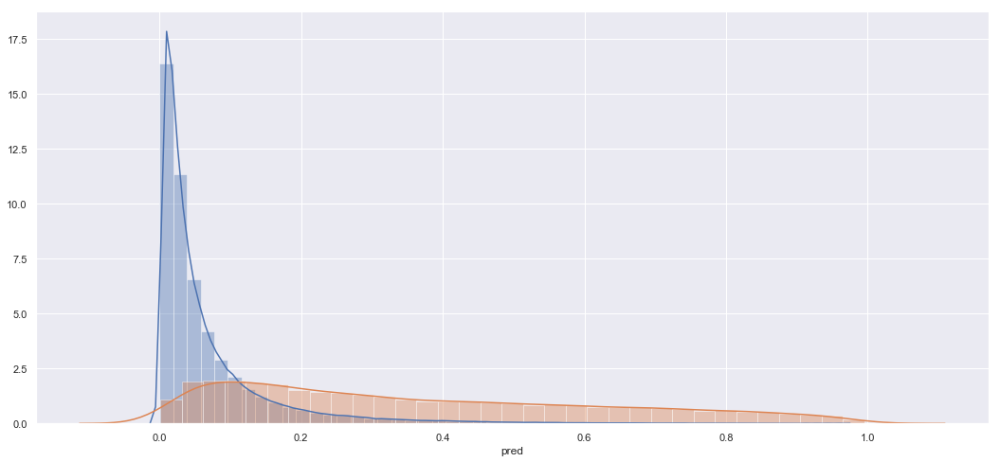

In [26]:
plt.figure(figsize=(18, 8))
sns.distplot(train[train.target == 0]['pred'])
sns.distplot(train[train.target == 1]['pred'])

In [115]:
ID_codes_0 = train[(train.target == 0) & (train.pred >= 0.9)].ID_code.values
ID_codes_1 = train[(train.target == 1) & (train.pred <= 0.1)].ID_code.values

In [116]:
train['bbiggu_0'] = 0
train['bbiggu_1'] = 0

In [122]:
train.loc[train.ID_code.isin(ID_codes_0), 'bbiggu_0'] = 1
train.loc[train.ID_code.isin(ID_codes_1), 'bbiggu_1'] = 1

In [134]:
result = {}
for col in tqdm_notebook(col_list):
    windows = 1000
    iterations = 200000 / windows
    target = train.sort_values(col).bbiggu_1.values
    result[col] = []
    for i in range(int(iterations)):
        result[col].append(target[i * windows: (i + 1) * windows].sum())

In [136]:
time_series = pd.DataFrame(result).T

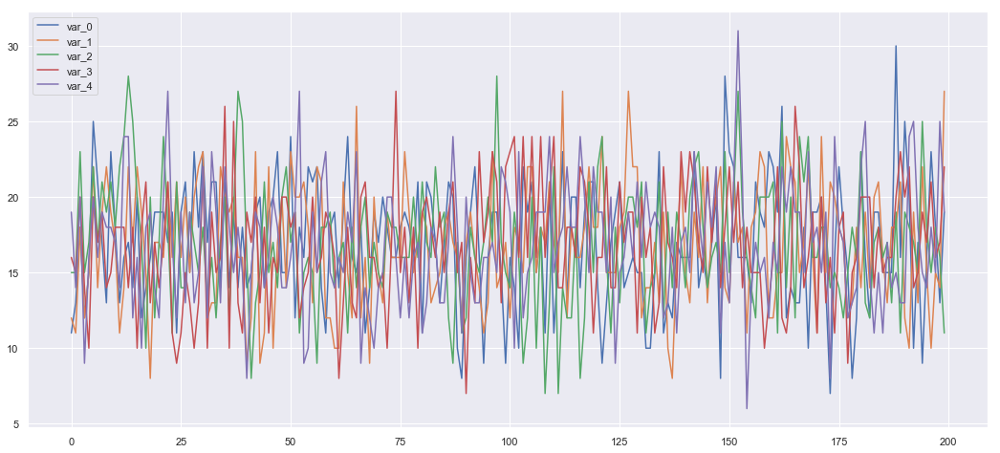

In [138]:
idx = 0
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

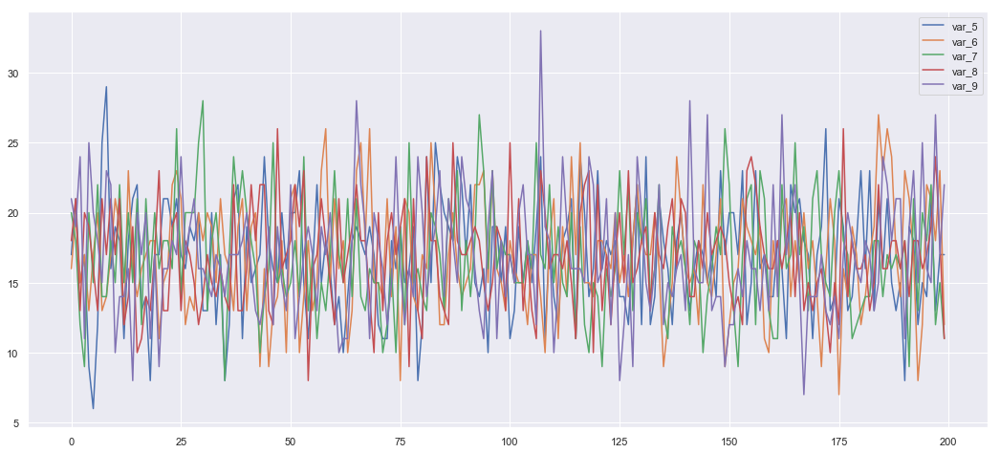

In [139]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

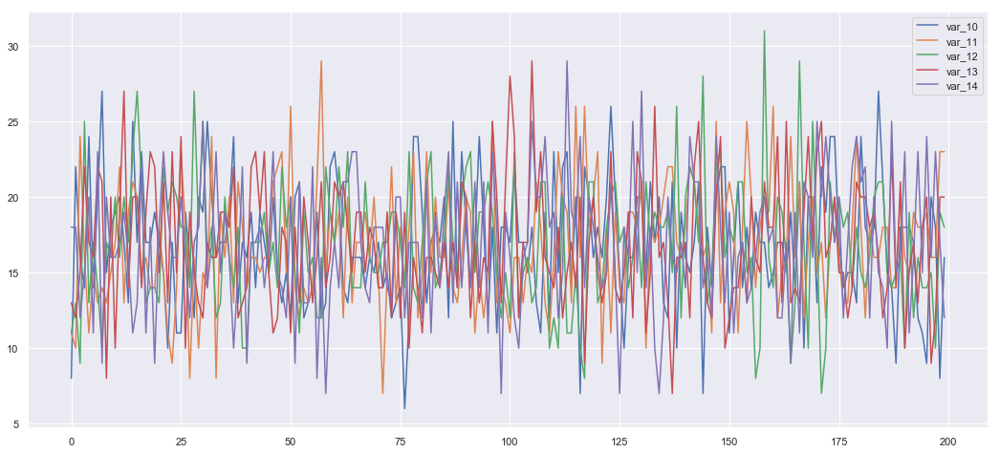

In [140]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

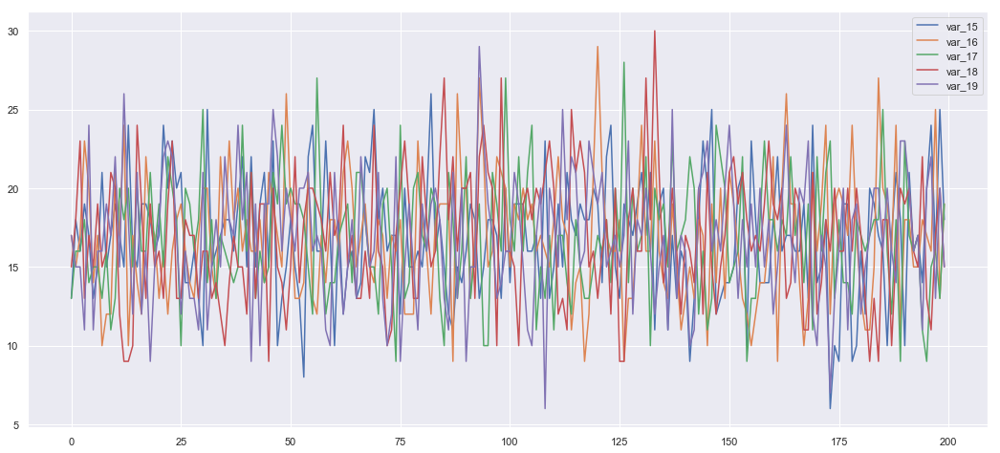

In [141]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

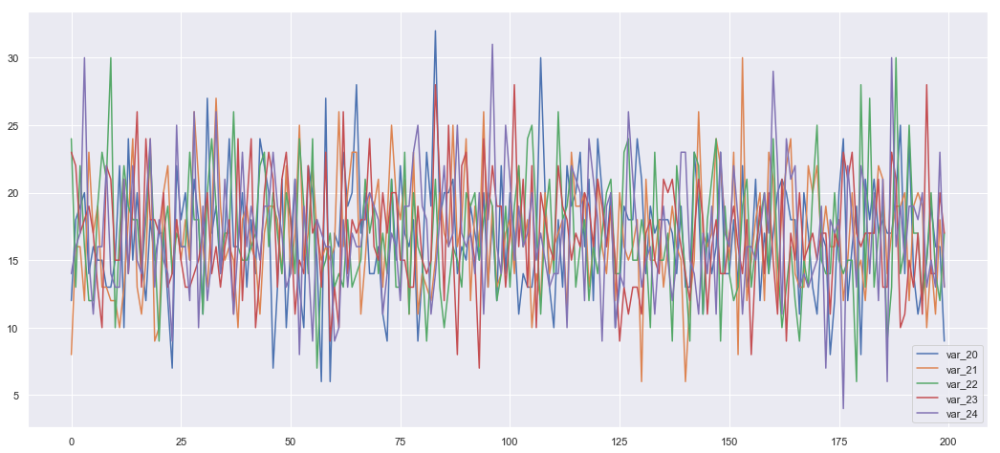

In [142]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

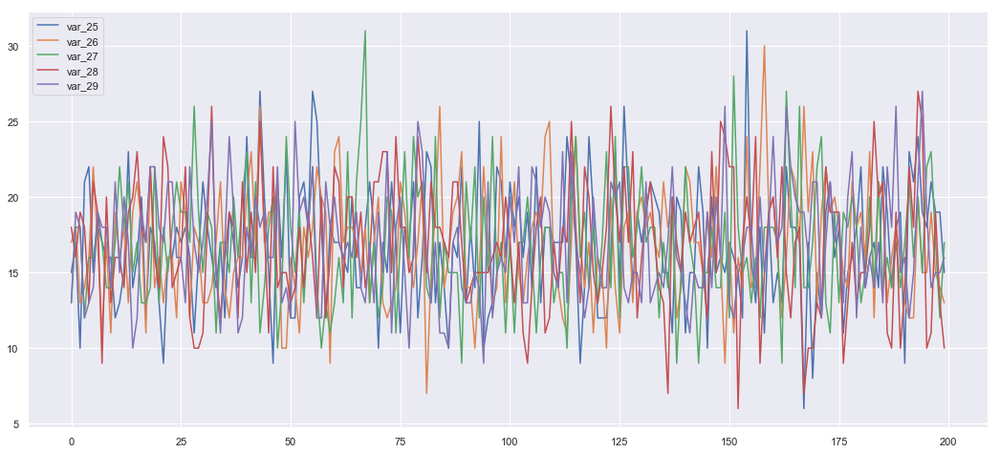

In [143]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

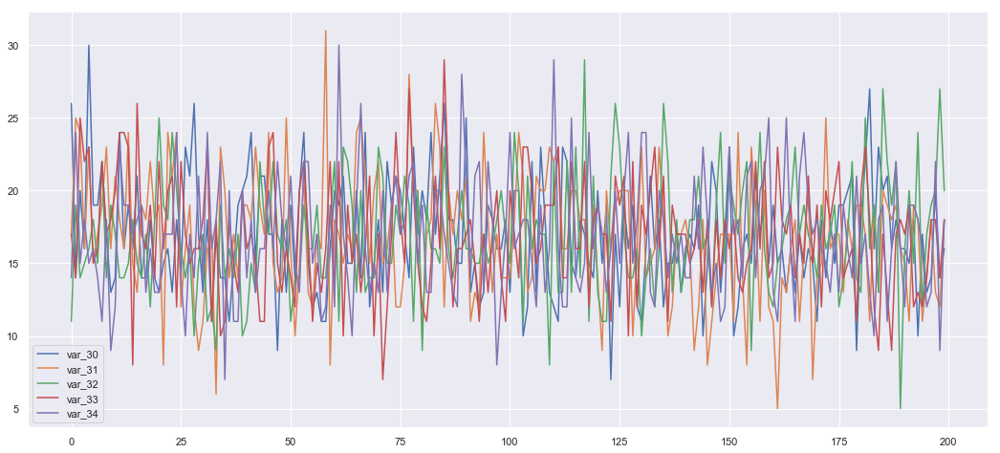

In [144]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

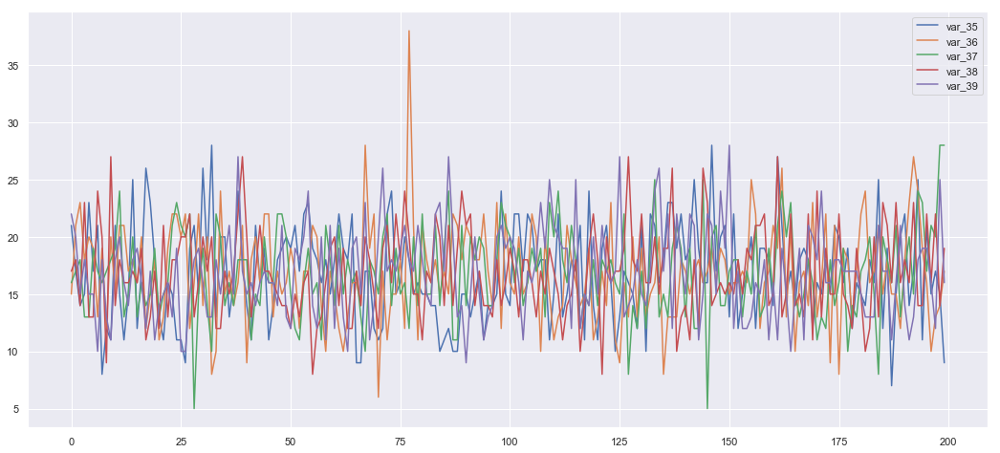

In [145]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

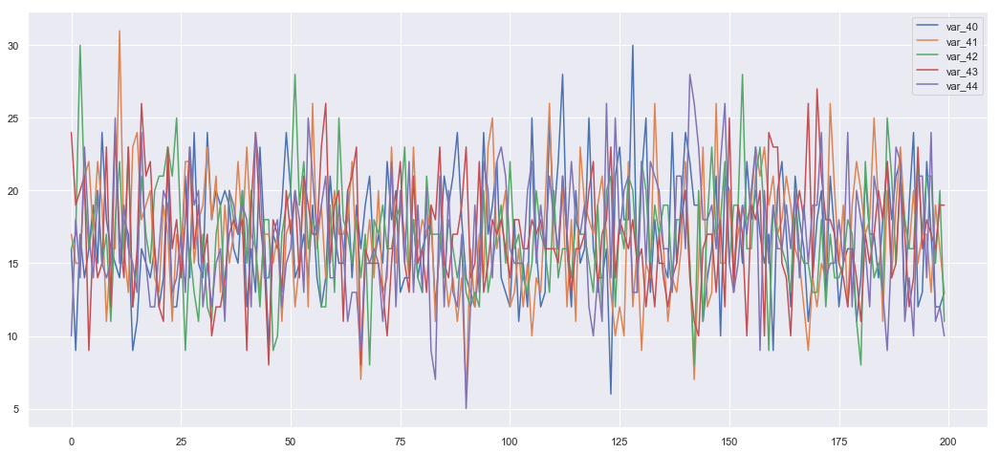

In [146]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

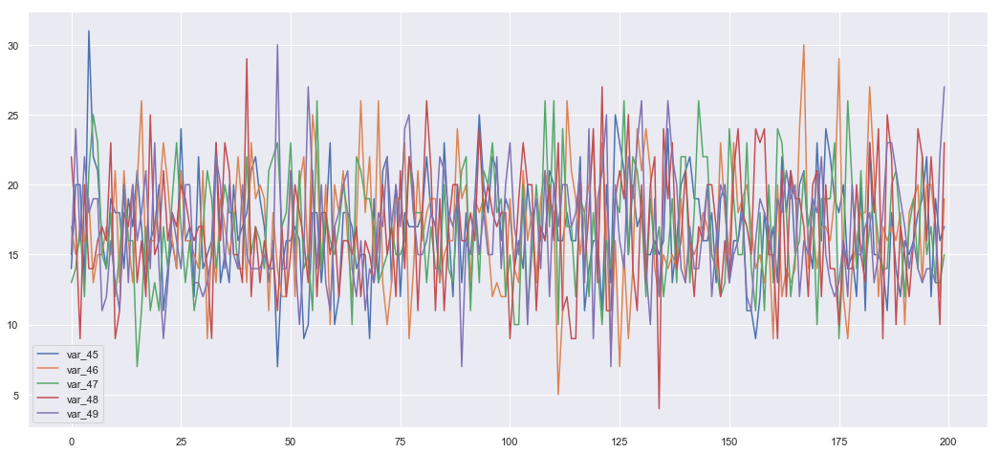

In [147]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

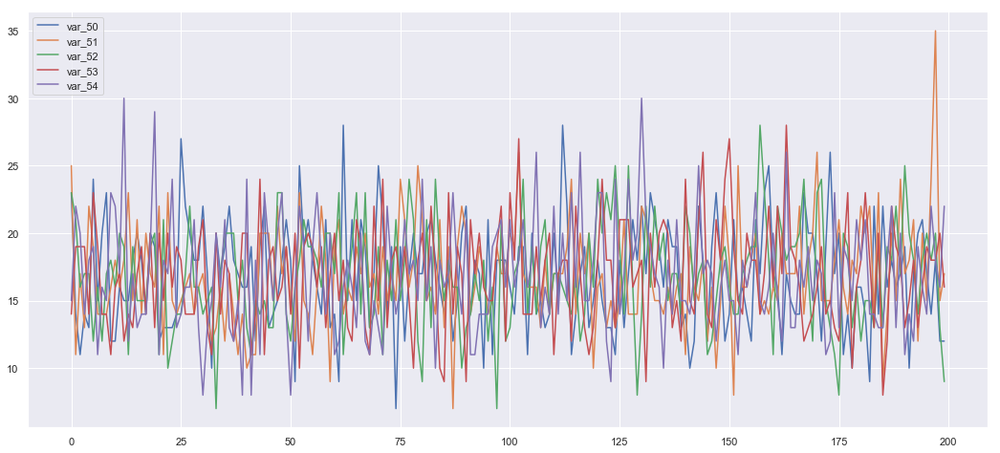

In [148]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

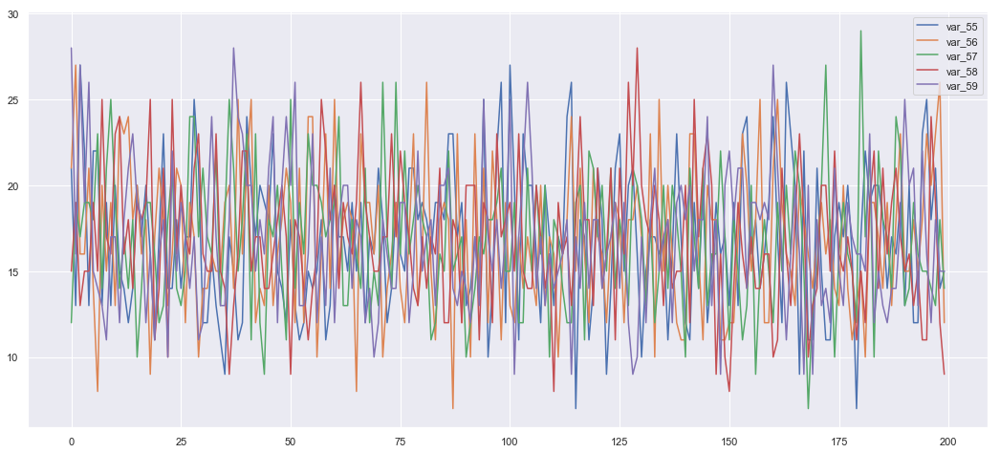

In [149]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

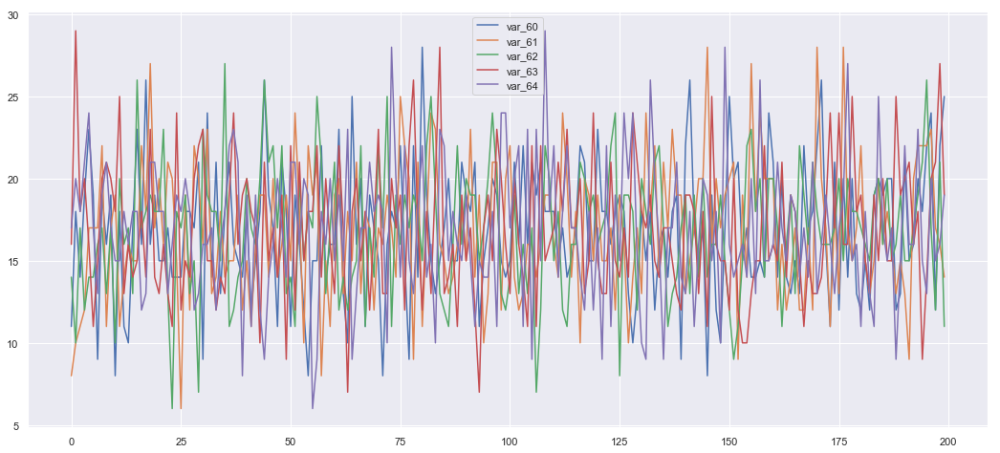

In [150]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

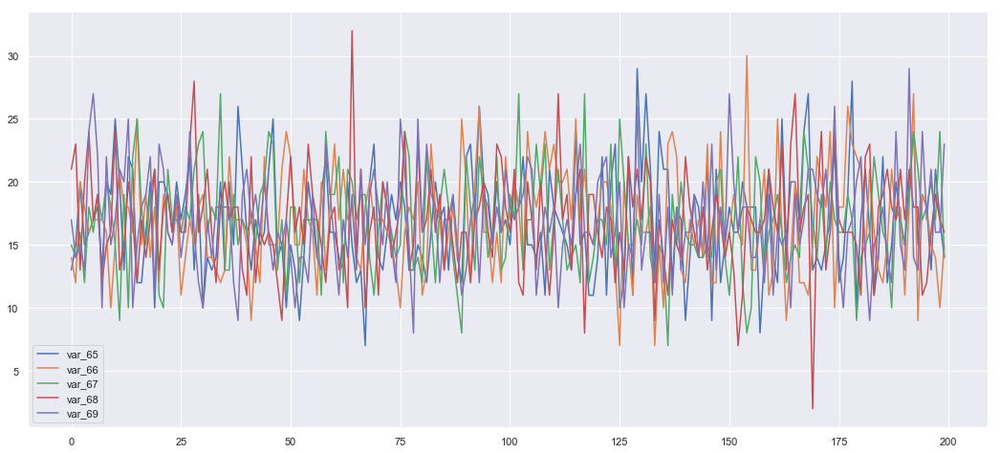

In [151]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

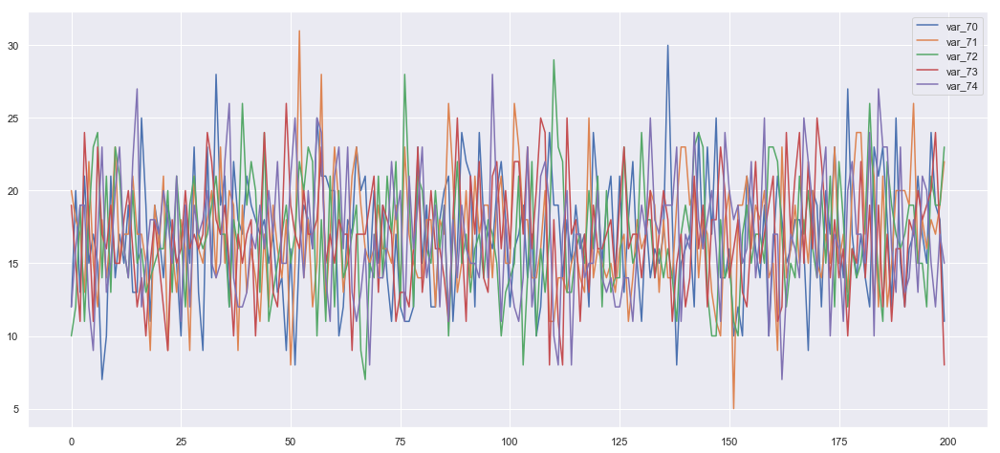

In [152]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

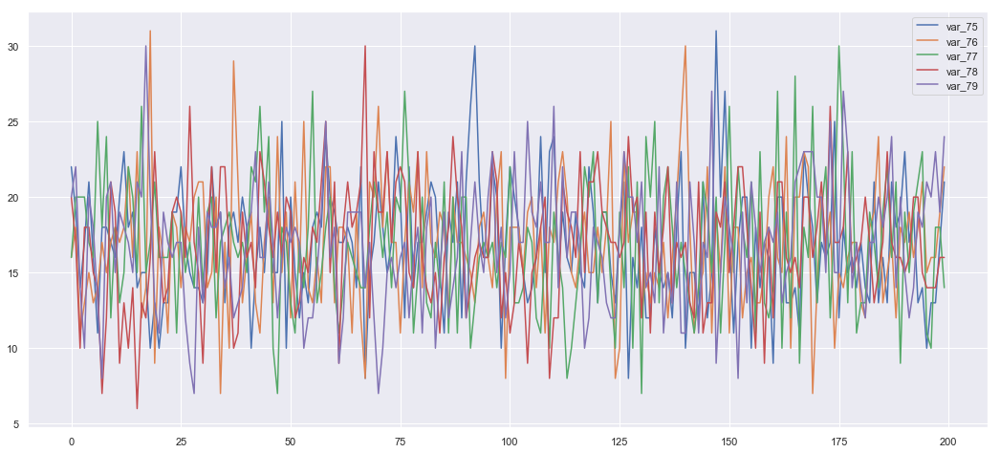

In [153]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

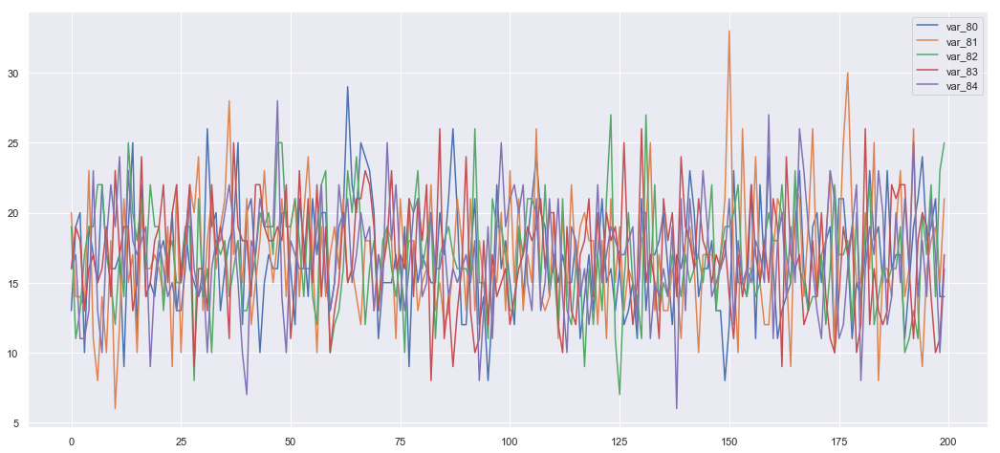

In [154]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

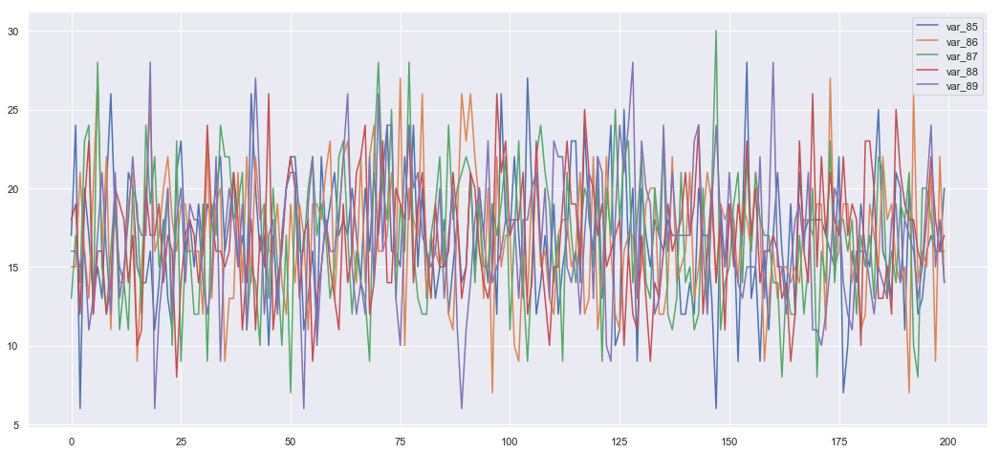

In [155]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

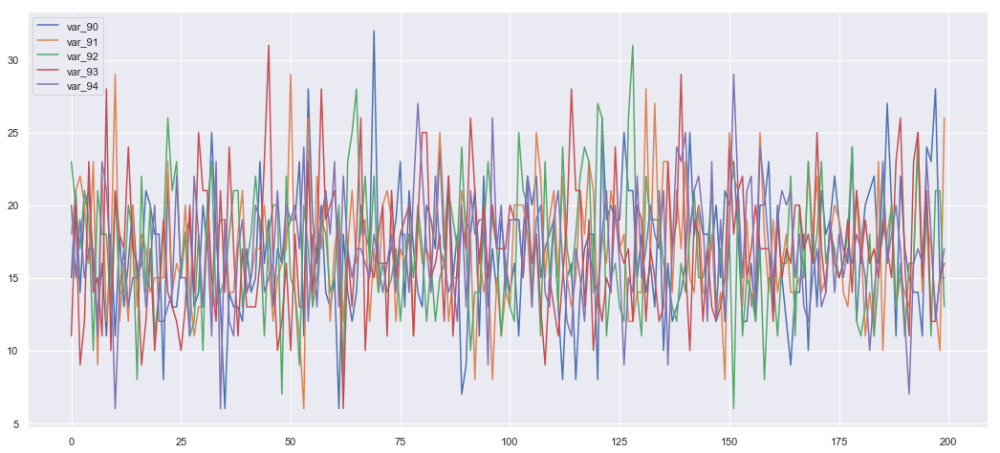

In [156]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

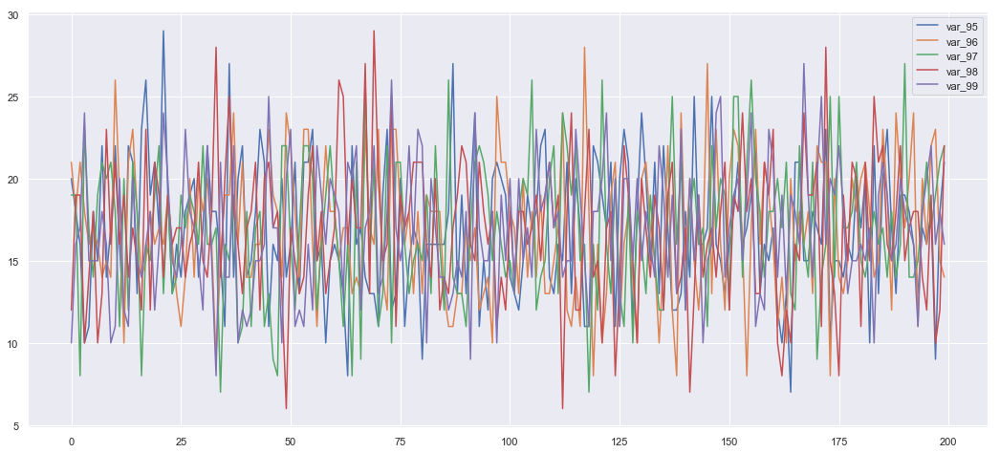

In [157]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

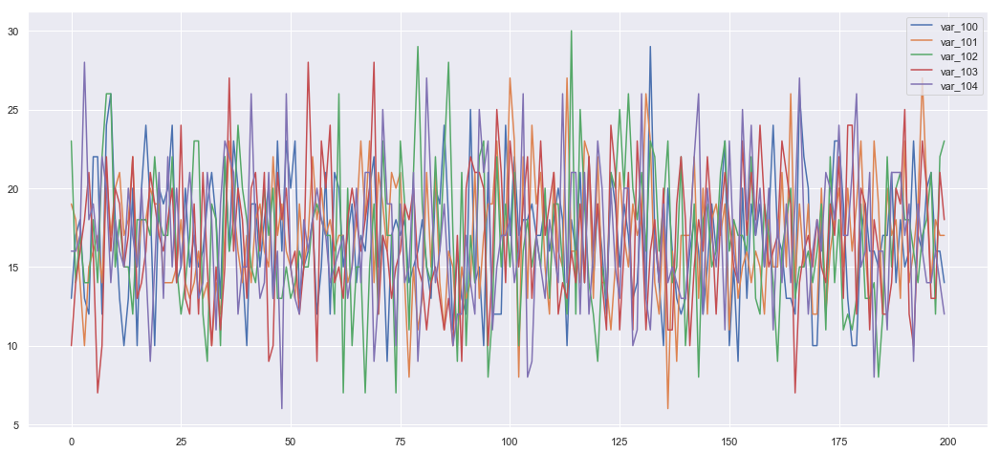

In [158]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

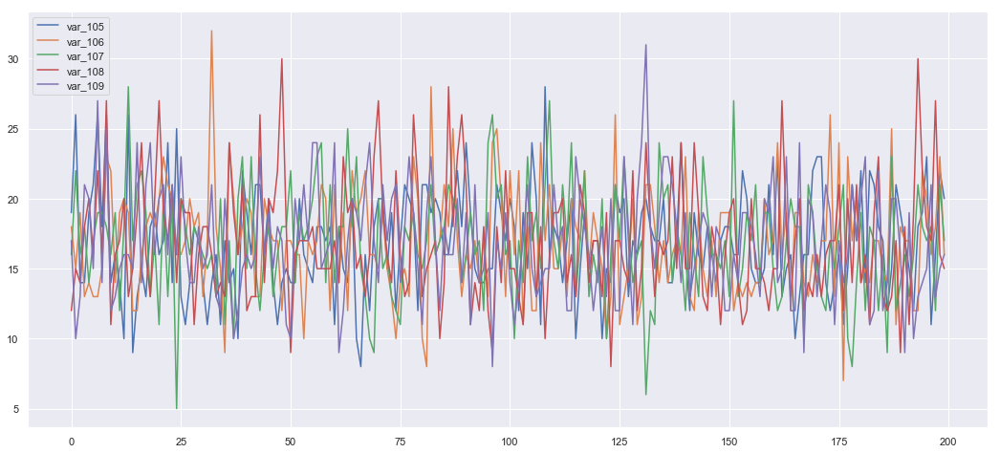

In [159]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

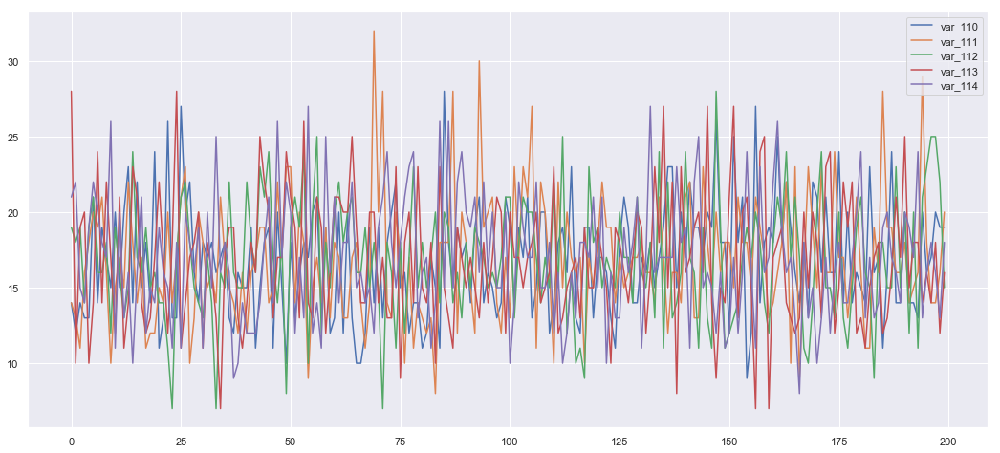

In [160]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

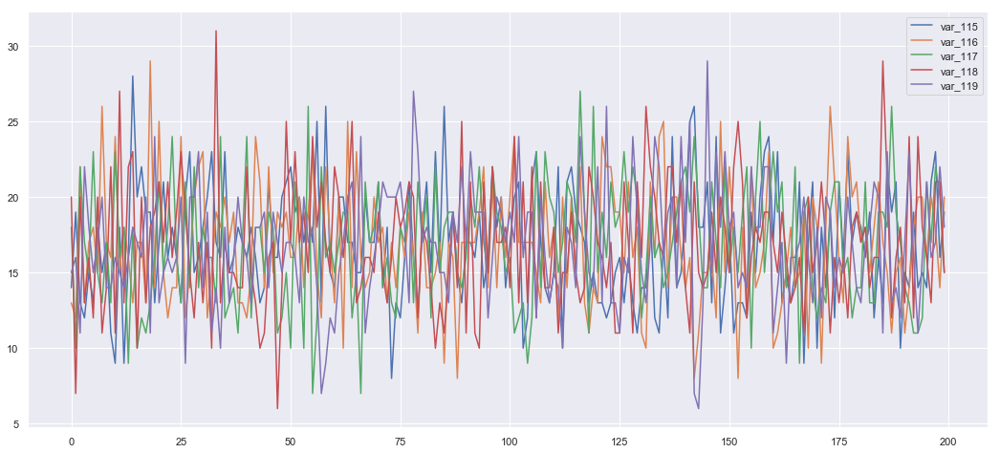

In [161]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

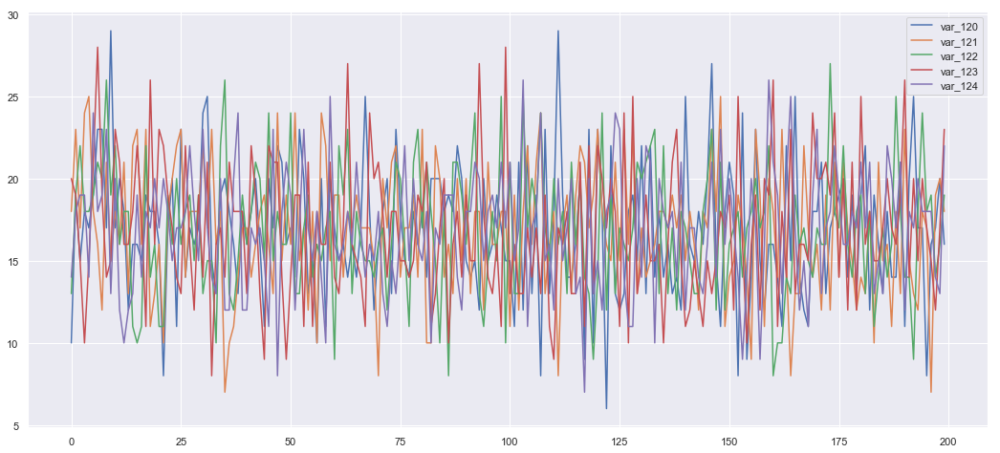

In [162]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

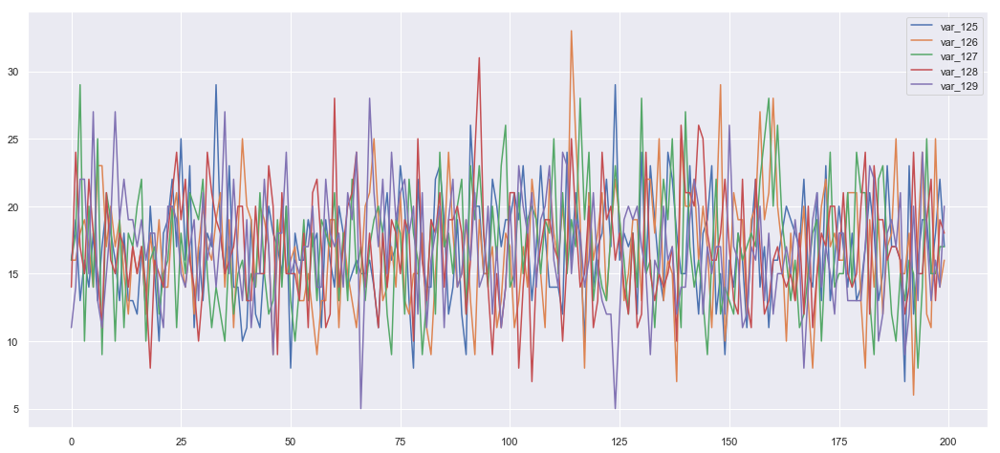

In [163]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

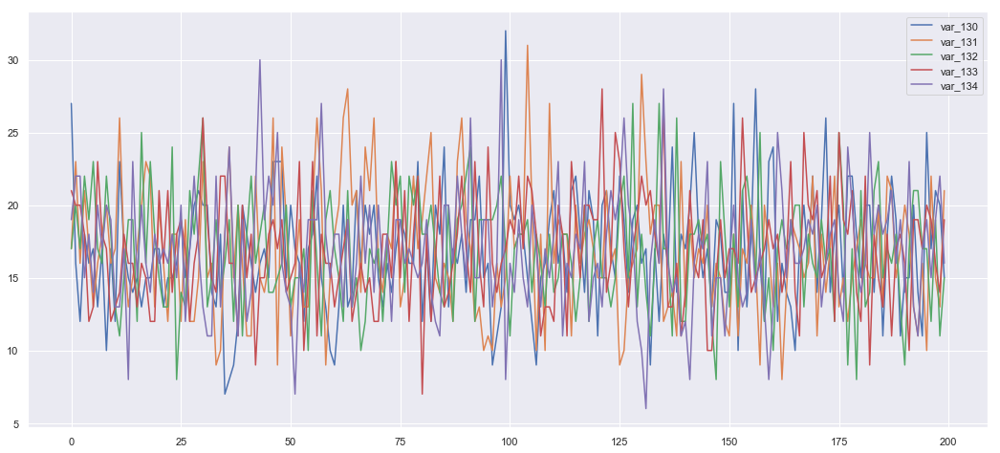

In [164]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

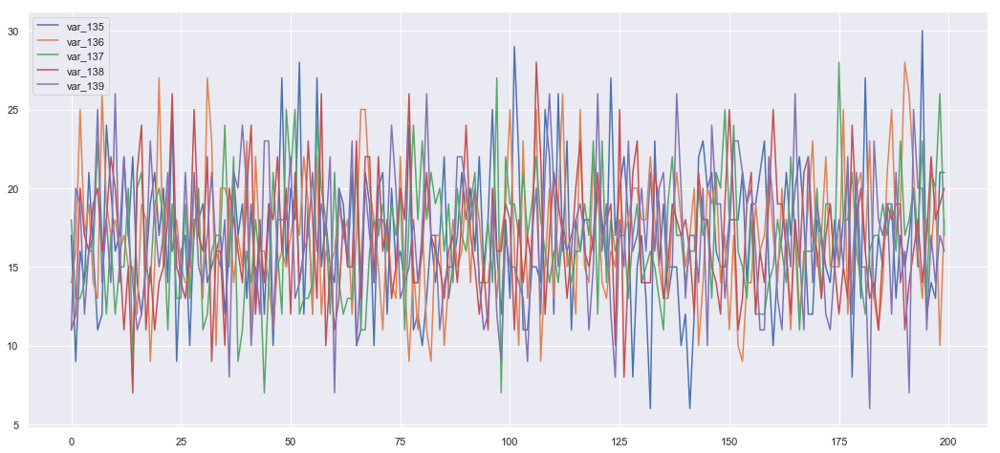

In [165]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

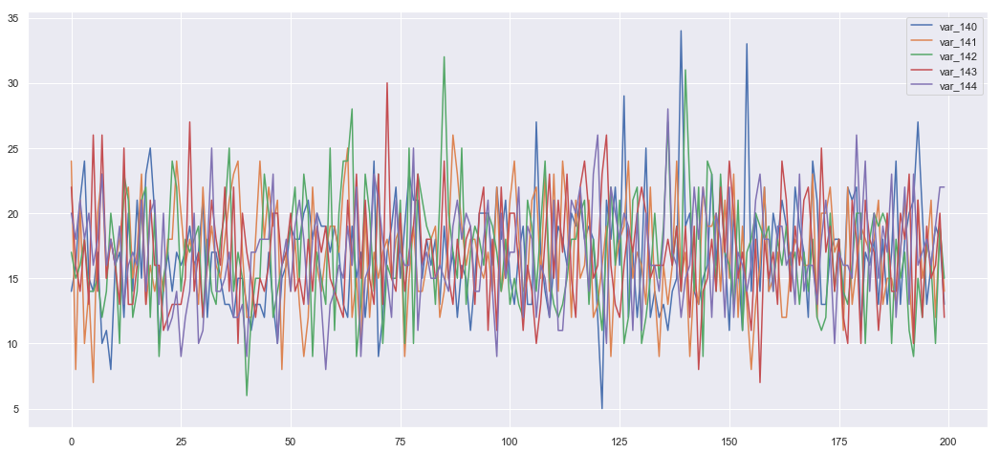

In [166]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

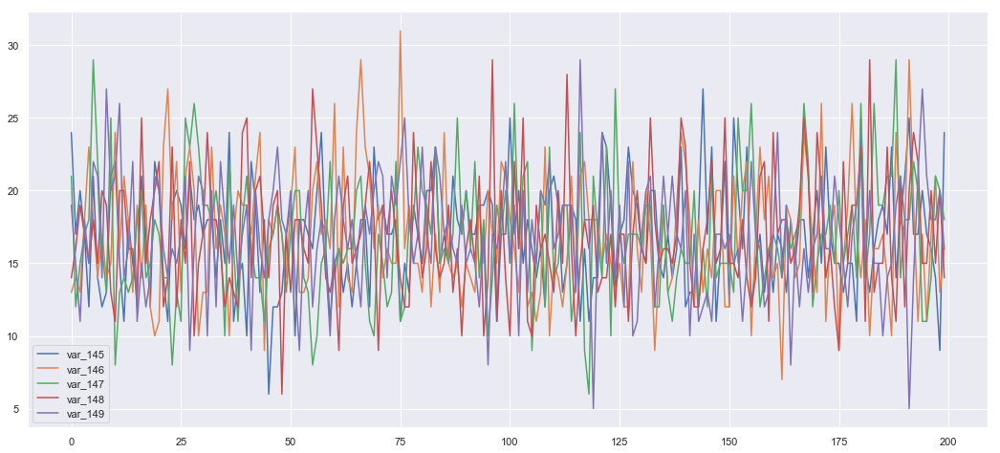

In [167]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

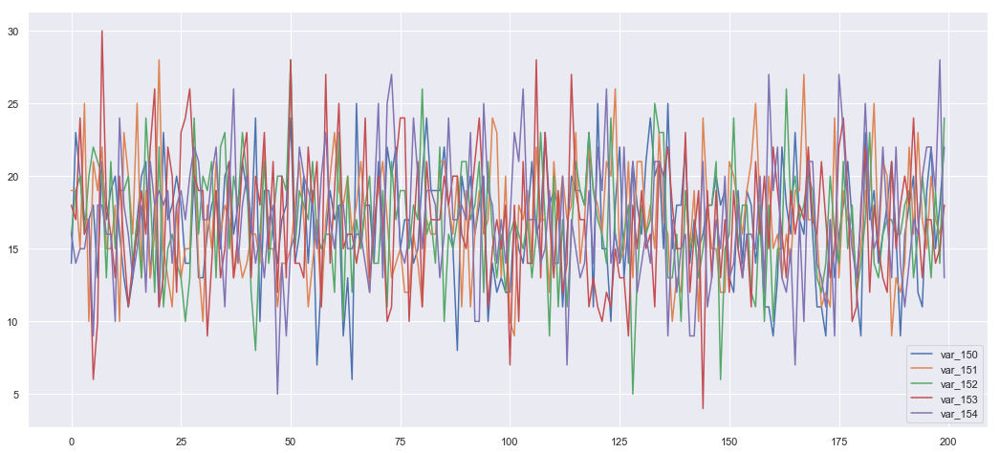

In [168]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

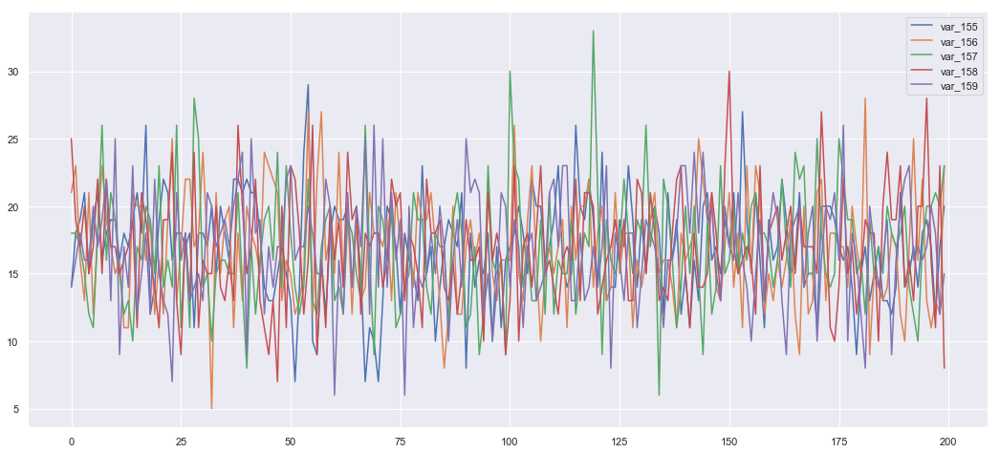

In [169]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

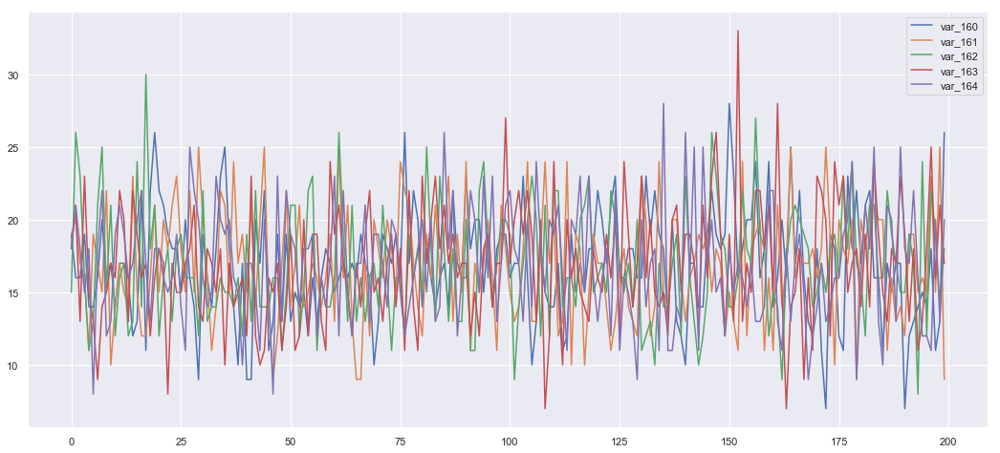

In [170]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

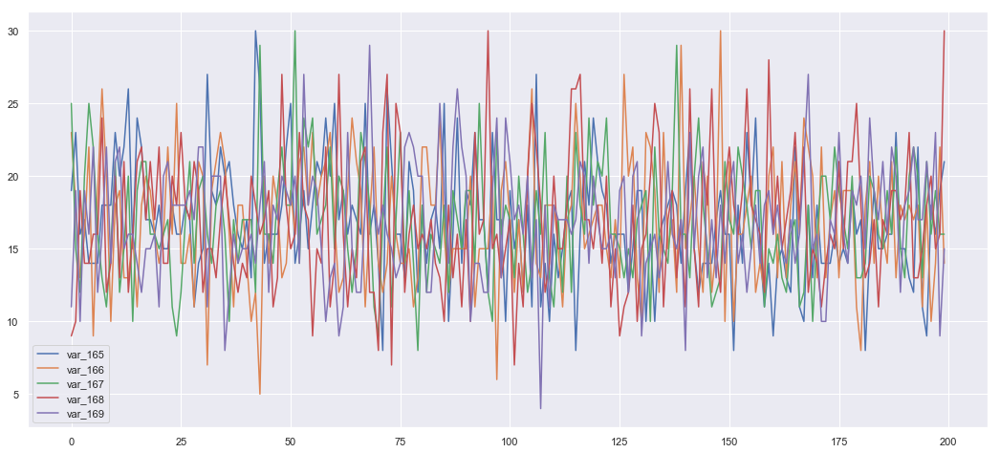

In [171]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

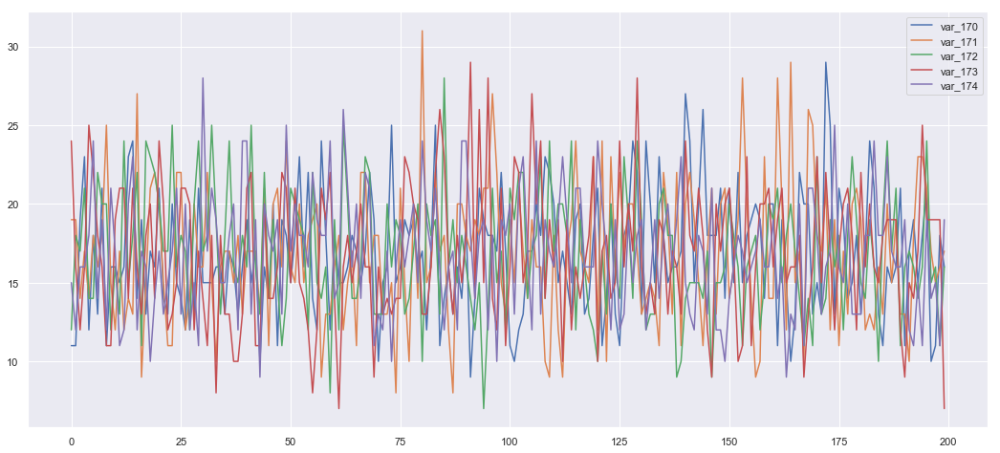

In [172]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

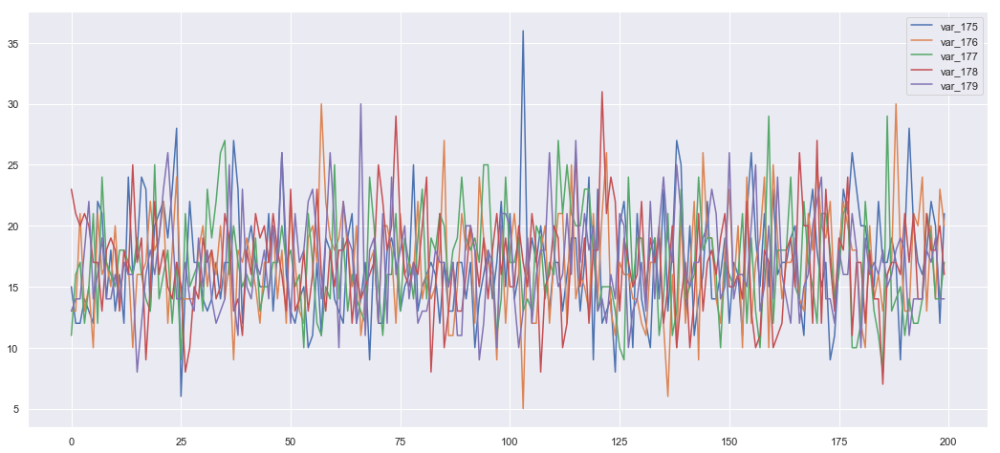

In [173]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

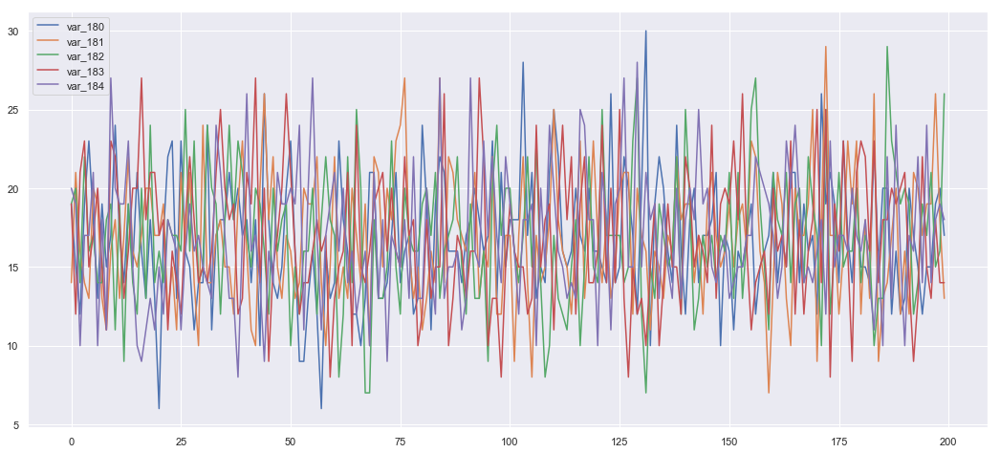

In [174]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

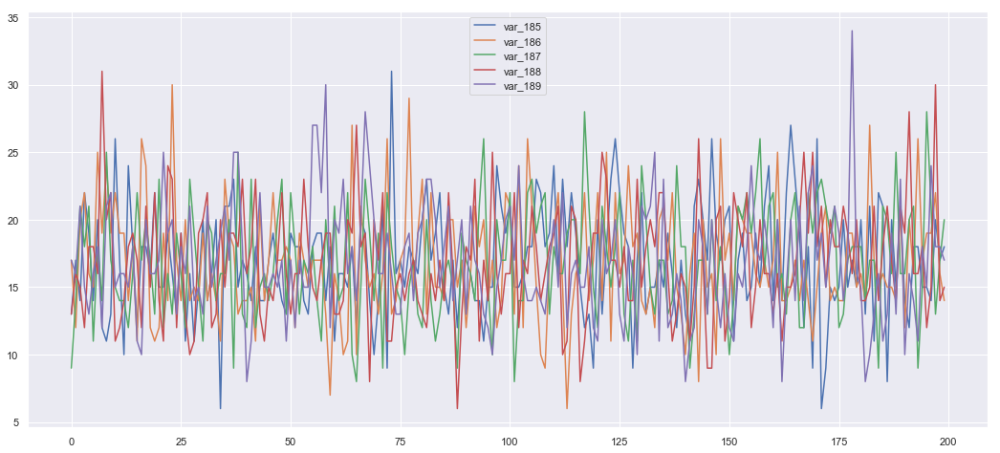

In [175]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

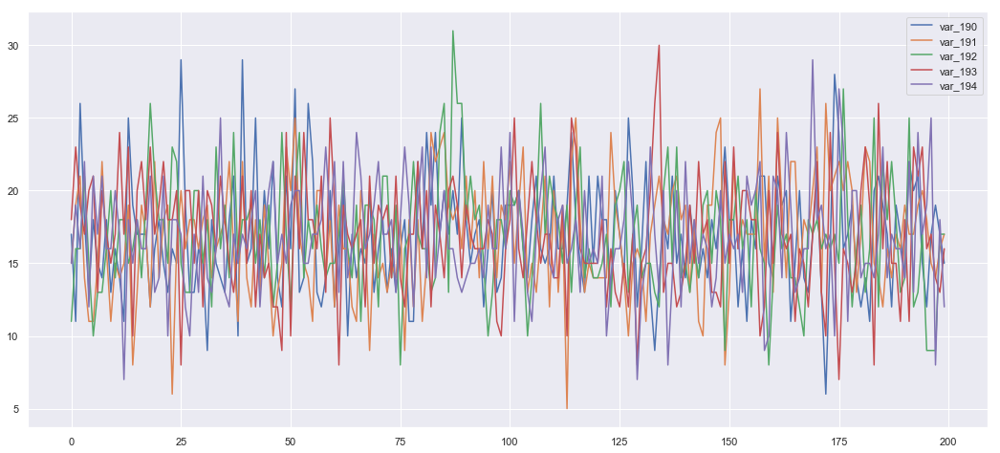

In [176]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

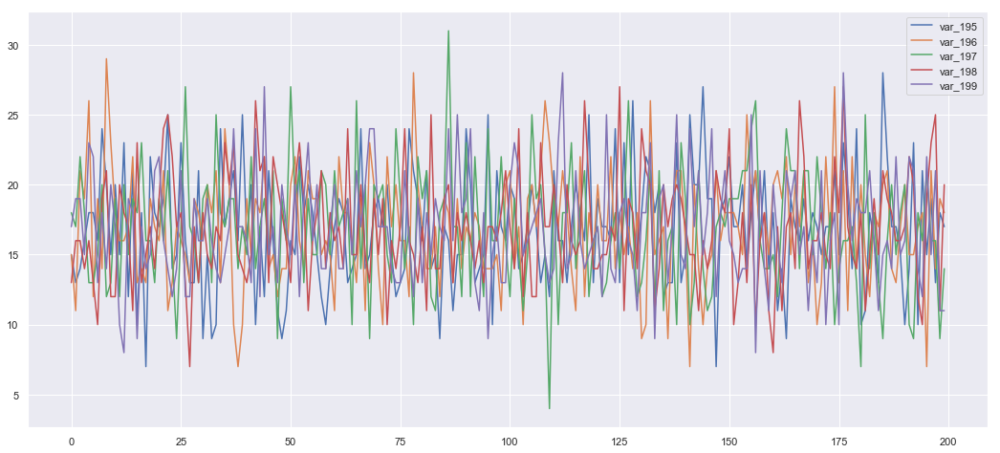

In [177]:
plt.figure(figsize=(18, 8))
for col in col_list[idx * 5:(idx + 1) * 5]:
    plt.plot(time_series.loc[col], label=col)
plt.legend()
idx += 1

In [182]:
temp = train.sort_values(['var_68']).bbiggu_1.reset_index(drop=True)

In [196]:
train.sort_values('var_108').groupby(['var_68']).bbiggu_1.agg(print)

151989    0
Name: bbiggu_1, dtype: int64
29081    0
Name: bbiggu_1, dtype: int64
181977    0
Name: bbiggu_1, dtype: int64
14141    0
Name: bbiggu_1, dtype: int64
53835    0
Name: bbiggu_1, dtype: int64
88626    0
Name: bbiggu_1, dtype: int64
2881    0
Name: bbiggu_1, dtype: int64
95477    0
Name: bbiggu_1, dtype: int64
23769     0
192480    0
Name: bbiggu_1, dtype: int64
6956    0
Name: bbiggu_1, dtype: int64
106470    0
Name: bbiggu_1, dtype: int64
38895    0
34864    0
36926    0
Name: bbiggu_1, dtype: int64
175505    0
79497     0
Name: bbiggu_1, dtype: int64
127184    0
Name: bbiggu_1, dtype: int64
71348    0
Name: bbiggu_1, dtype: int64
155314    0
180058    0
Name: bbiggu_1, dtype: int64
151625    0
Name: bbiggu_1, dtype: int64
112184    0
Name: bbiggu_1, dtype: int64
118073    0
66940     0
82063     0
Name: bbiggu_1, dtype: int64
101361    0
117448    0
Name: bbiggu_1, dtype: int64
3520      0
31808     0
157592    0
Name: bbiggu_1, dtype: int64
47824    1
Name: bbiggu_1, dtype

Name: bbiggu_1, dtype: int64
181769    0
8673      0
121148    0
115400    0
55346     0
104733    0
76353     0
118570    0
33223     0
112319    0
168457    0
92516     0
159019    0
154226    0
158476    0
4063      0
132114    0
133278    0
47442     0
10563     0
189091    0
51661     0
137722    0
100591    0
23103     0
135234    0
34420     0
195845    0
42904     0
59568     0
152715    0
76879     0
82468     0
159702    0
63744     0
6119      0
114073    0
99260     0
177123    0
127121    0
67537     0
75725     0
163464    0
119105    0
60794     1
156735    0
98369     0
140709    0
188685    0
110154    0
139652    0
95911     0
114936    0
140701    0
50298     0
144621    0
50741     0
87231     0
115011    0
51362     0
183012    0
192287    0
161153    0
146086    0
161344    0
82380     0
112881    1
153277    0
45291     0
121600    0
38179     0
154079    0
91211     0
26912     0
170992    0
8963      0
157511    0
67371     0
120392    0
49518     0
62379     0

Name: bbiggu_1, dtype: int64
114852    0
71639     0
10519     0
56897     0
54429     0
160165    0
136292    0
61590     0
3503      0
156910    0
80533     0
40578     0
130532    0
144875    0
82233     0
85146     0
88795     0
93092     0
33829     0
40534     0
34869     0
152960    0
51154     0
44361     0
120863    0
9798      0
184960    0
124631    0
86881     0
41195     0
103043    0
44715     0
194495    0
50708     0
110576    0
184261    0
117235    1
18301     0
14439     0
106872    0
156914    0
72843     0
104064    0
191066    0
121126    0
110271    0
193369    0
121997    0
17903     0
149482    0
76460     0
144185    0
52239     0
112177    0
163713    0
62101     0
39641     0
62399     0
146061    0
23835     0
91578     0
186400    0
185033    0
55695     0
2134      0
161254    0
53311     1
184253    0
163360    0
65832     0
25768     0
173451    0
172713    0
180225    0
87723     0
101211    0
26369     0
122793    0
199455    0
64097     0
119405    0

Name: bbiggu_1, dtype: int64
113642    0
110755    0
165416    0
184263    0
131093    0
80461     0
25219     0
56356     0
59507     0
64831     0
9476      0
191302    0
197370    0
108533    0
87909     0
113109    0
12233     0
46216     0
77649     0
187004    0
156274    0
29912     0
18998     0
114168    0
97500     0
157613    0
117369    0
37900     0
135568    0
60937     0
168242    0
16917     0
88738     0
142687    0
171530    0
113374    0
65187     0
23030     0
192243    0
11594     0
99102     0
88336     0
190630    0
161007    0
31659     0
199015    0
149841    0
99041     0
84312     0
144827    0
133237    0
113633    0
193412    0
49763     0
26879     0
130698    0
143562    0
100190    0
168878    0
112447    0
121593    0
118312    0
31270     0
78469     0
2186      0
56320     0
131471    0
99042     0
100921    0
107118    0
42836     0
66759     0
106929    0
81437     0
185295    0
166517    0
124948    0
82683     0
1359      0
184381    0
152811    0

Name: bbiggu_1, dtype: int64
562       0
158370    0
2546      0
158395    0
137987    0
98852     0
164023    0
132521    0
114514    0
15326     0
160081    0
3382      0
19898     0
131990    0
13090     0
102595    0
61248     0
31792     0
153524    0
60001     0
44947     0
126523    0
131048    0
63442     0
186592    0
171269    0
35245     0
60847     0
176856    0
186447    0
183683    0
193993    0
127742    0
23869     0
146124    0
144598    0
80110     0
182652    0
141033    0
60486     0
129501    0
82883     0
5783      0
178541    0
146900    0
1514      0
47638     0
119335    0
23847     0
68924     0
30480     0
74200     0
187338    0
23324     0
150420    0
193290    0
160152    0
191798    0
96907     0
149078    1
65606     0
107659    0
35030     0
150679    0
130619    0
93987     0
6931      0
110982    0
130348    0
148674    0
126317    0
183169    0
90362     0
73166     0
196421    0
88767     0
186896    0
160716    0
129270    1
96528     0
40991     0

Name: bbiggu_1, dtype: int64
125732    0
17073     0
128489    0
142042    0
60916     0
18815     0
139962    0
13193     0
115650    0
64100     1
61049     0
123482    0
102836    0
129786    0
193841    0
14144     0
136042    0
16750     0
123103    0
47697     0
169863    0
9363      0
132247    0
61997     0
90263     0
164470    0
137479    0
128136    0
102339    0
88368     0
90189     0
34531     0
177255    0
11076     0
144369    0
74049     0
44540     0
73532     0
66429     0
110460    0
111681    0
4456      0
66998     0
59745     0
176012    0
18451     0
607       0
157450    1
189430    0
43909     1
197500    0
43392     0
42289     0
131976    0
102685    0
62381     0
132310    0
15287     0
80517     0
197506    0
168840    0
22062     0
79544     0
148868    0
141869    0
1768      0
67545     0
156629    0
19139     0
173010    0
163671    0
36555     0
67255     0
60498     0
128617    0
125977    0
90536     0
42701     0
184468    0
25210     0
149958    0

Name: bbiggu_1, dtype: int64
141891    0
98653     0
76932     1
70524     0
196091    0
194396    0
167621    0
77697     0
119315    0
9905      0
152351    0
169038    0
175897    0
44539     0
98133     0
114867    0
177236    0
143400    0
91674     0
157497    0
129544    0
132742    0
153035    1
115708    0
113102    0
126741    0
109933    0
148996    0
74940     0
101710    0
186223    0
175718    0
133548    0
18987     0
188089    0
188770    0
92316     0
11720     0
94026     0
31655     0
32322     0
141524    0
30372     0
150541    0
55934     0
134786    0
182040    0
141931    0
94067     0
103576    0
129333    0
176123    0
41667     0
124018    0
196142    0
48539     0
182548    0
151075    0
191589    0
32417     0
141261    0
5605      1
161674    0
155917    0
131046    0
191698    0
55826     0
74856     1
36890     0
152178    0
74321     0
43296     0
164787    0
37456     0
60633     0
90746     0
3281      0
37980     0
78063     0
1788      0
39913     0

Name: bbiggu_1, dtype: int64
55931     0
33283     0
88485     0
53852     0
192801    0
55640     0
138670    0
135127    0
96470     0
106335    0
40647     0
7226      0
173428    0
7501      0
2267      0
85603     0
107737    0
21401     0
165196    0
121692    0
39548     0
20562     0
181478    0
65768     1
133533    0
42719     0
106353    0
47522     0
35501     0
162048    0
143088    0
7850      0
142128    0
21012     0
20235     0
68461     0
13644     0
187394    0
31017     0
161802    0
164438    0
86736     0
195418    0
26973     0
150165    0
157039    0
164006    0
27487     0
91968     0
199147    0
106755    0
188339    0
35510     0
73456     0
118859    0
46371     0
74218     0
145293    0
131002    0
163152    0
178099    0
58773     0
149006    0
99057     0
128246    0
114530    0
87075     0
150748    0
125151    0
161079    1
58950     0
50616     0
140297    0
15646     0
120004    0
7185      0
43494     0
157726    0
140032    0
107387    0
89202     0

Name: bbiggu_1, dtype: int64
94827     0
179654    0
146995    0
18111     0
73590     0
184264    0
12977     0
92286     0
81312     0
173804    0
127887    0
128708    0
148254    0
29961     0
70431     0
92123     0
170935    0
171997    0
138822    0
75048     1
125711    0
60567     0
72920     0
191307    0
44855     0
151129    0
177232    0
148227    0
120928    0
74099     0
23278     0
159241    0
181287    0
175385    0
70288     0
43435     0
140778    0
152512    0
67290     0
163980    0
156106    0
98650     0
12113     0
52990     0
169196    0
7799      0
184107    0
149349    0
195598    0
47992     0
77320     0
75595     0
31620     0
142051    0
183852    0
58680     0
69588     0
66883     0
140967    0
141425    0
120044    0
115250    0
174033    0
11901     0
127942    0
14733     0
163515    0
171381    0
166721    0
129865    0
12294     0
132027    0
167934    0
16370     0
181598    0
162780    0
197947    0
140628    0
28662     0
93744     0
192740    0

Name: bbiggu_1, dtype: int64
184236    0
43171     0
193547    0
4138      0
78465     0
158167    0
199339    0
109837    0
67987     0
199498    0
49628     0
139643    0
18654     0
147917    0
31456     0
198846    0
127868    0
32285     0
64996     0
162883    0
6188      0
56325     0
49212     0
127885    0
162613    0
171737    0
163066    0
4954      0
158042    0
67281     0
9231      0
103652    0
124592    0
169094    0
148044    0
130026    0
187053    0
118501    0
4347      0
41955     0
57104     0
192123    0
121192    0
115979    0
146508    0
21730     0
151539    0
165615    0
171122    0
189593    0
66757     0
76220     0
139951    0
185926    0
103335    0
82113     0
179229    0
49704     0
189184    0
147037    0
99000     0
113696    0
163250    0
48162     0
131223    0
71598     0
206       0
93198     0
61098     0
179305    0
196640    0
89454     0
35389     0
81379     0
138991    0
125648    0
68248     0
173538    0
14740     0
157154    0
168480    0

Name: bbiggu_1, dtype: int64
185534    0
108226    0
85957     0
31275     0
13776     0
59960     0
162875    0
182565    0
115164    0
70318     0
146485    0
188166    0
26826     0
3685      0
10302     0
151018    0
140856    0
80510     0
198520    0
89402     0
135823    0
156589    0
94080     0
131852    0
75410     0
180099    0
79282     0
183206    0
180751    1
190868    0
58948     0
78215     0
178565    0
76738     0
145828    0
103333    0
197550    0
128575    0
2165      0
181830    0
146491    0
64947     0
163015    0
64079     0
135410    1
156850    0
23072     0
127904    0
127715    0
50296     0
82131     0
92294     0
135826    0
175534    0
38950     0
100703    0
48329     0
190870    0
135245    0
182688    0
89388     0
89117     0
170894    0
134753    0
23080     0
115749    0
128197    0
100020    0
128228    0
97282     0
75220     0
141093    0
197294    0
162207    0
58300     0
194024    0
184245    0
50078     0
77668     0
178912    0
36454     0

Name: bbiggu_1, dtype: int64
188618    0
191813    0
43899     0
59775     0
13410     0
89711     0
28525     0
66773     0
65249     0
147246    0
178007    0
155636    0
116021    0
39281     0
184954    0
41918     0
193122    0
173345    0
196734    0
170867    0
189319    0
99435     0
25230     0
42291     0
143549    0
134115    0
19094     0
130871    0
198938    0
83681     0
186167    0
83083     0
175479    0
166983    0
141913    0
18649     0
113252    0
24907     0
27191     0
32528     0
14857     0
188515    0
176513    0
38836     0
35681     0
33983     0
192362    0
152888    0
63718     0
4366      0
59820     0
198386    0
171829    0
80841     0
122400    0
15237     0
43905     0
82979     0
181863    0
17879     0
564       0
157569    0
116974    0
63337     0
27031     0
126216    0
59481     0
49214     0
55729     0
71712     0
130149    0
44408     0
17410     0
23993     0
96502     0
160642    0
5063      0
147840    0
121950    0
122096    0
55484     0

Name: bbiggu_1, dtype: int64
105541    0
123602    0
107547    0
70878     0
55016     0
45044     0
136120    0
71545     0
85240     0
39022     0
42281     0
26938     0
199247    0
155957    0
13636     0
30192     0
47959     0
94024     0
54585     0
78938     0
58460     0
114450    0
98058     0
33655     0
128877    0
154900    0
102806    0
117912    0
196951    0
39276     0
108523    0
43636     0
69385     0
144886    0
142245    0
138345    0
60779     0
20312     0
155372    1
130134    0
70741     0
194268    0
149199    0
199972    0
33523     0
144038    0
49892     0
138702    0
65873     0
128705    0
181360    0
186482    0
51352     0
94118     0
82563     0
66159     0
52639     0
61941     0
80100     0
175099    0
149301    0
118226    0
70957     0
68671     0
150210    0
64346     0
125848    0
49399     0
157655    0
190417    0
122497    0
138296    0
13380     0
34461     0
18559     0
152246    0
22065     0
83144     0
123514    0
141035    0
87669     0

Name: bbiggu_1, dtype: int64
114417    0
34765     0
159107    0
45343     0
163491    0
198138    0
182154    0
45865     0
33735     0
42855     0
176153    0
94690     0
173304    0
55958     0
65253     0
140175    0
23996     0
40159     0
1646      0
47376     0
139224    0
9292      0
62654     0
56412     0
84465     1
122082    0
16191     0
173628    0
183535    0
140887    0
52047     0
69402     0
76165     0
170311    0
64809     0
157579    0
9081      0
152151    0
30297     0
23680     0
176018    0
166554    0
120828    0
134406    0
30969     0
95604     0
44514     0
195318    0
176275    0
100417    0
8091      0
89284     0
129494    0
180125    0
163485    0
100795    0
47506     0
2029      0
194540    0
97402     0
172437    0
179240    0
178787    0
21691     0
198414    0
33471     1
155109    0
199618    0
20891     0
134823    0
68020     0
15048     0
10317     0
183343    0
17384     0
176733    0
14858     0
5483      0
84873     0
84865     0
106206    0

Name: bbiggu_1, dtype: int64
88695     0
67610     0
98212     0
34013     0
91742     0
128724    0
46450     0
6217      0
1167      0
37903     0
83735     0
91149     0
105373    0
43043     0
198236    0
169731    1
150227    0
127008    0
126932    0
56840     0
49731     0
3091      1
186272    0
167338    0
181665    0
112065    0
18858     0
111020    0
17436     0
117191    0
52933     1
138356    0
11242     0
55067     0
125055    0
62292     0
77342     0
134971    0
74985     0
94332     0
153984    0
199007    0
105571    0
175442    0
41633     0
138909    0
173870    0
153246    0
123539    0
63972     0
33679     0
113694    0
110179    0
26387     0
82873     0
184007    0
174124    0
66831     0
145369    0
23367     0
142913    0
180295    0
150744    0
180001    0
24911     0
184594    0
62469     0
123734    0
10138     0
132318    0
79290     0
131984    0
119575    0
177768    0
43300     0
21796     0
158547    0
87121     0
135634    0
106191    0
4714      0

Name: bbiggu_1, dtype: int64
114328    0
68397     0
70317     0
76157     0
187925    0
142351    0
101411    0
107891    0
62710     0
60853     0
7477      0
199100    0
92931     0
6337      0
194115    0
119401    0
157348    0
65243     0
47826     0
6101      0
9430      0
118850    0
42666     0
175558    0
145617    0
94822     0
10573     0
124908    0
21605     0
77764     0
66880     0
34385     1
162038    0
14212     0
49713     0
171641    0
164880    0
135623    0
44217     0
146591    0
89144     0
103935    0
55768     0
71302     0
144702    0
48837     0
167524    0
199275    0
136996    0
129283    0
158852    0
184591    0
195327    0
171903    0
125191    0
91584     0
53662     0
49392     0
124359    1
143095    0
41264     0
155558    0
21917     0
86540     0
112527    0
4299      0
97352     0
4529      0
28611     0
120234    0
130472    0
54915     0
170995    0
102313    0
153294    0
18165     0
66793     0
141935    0
31366     0
72325     0
25253     0

Name: bbiggu_1, dtype: int64
78011     0
48159     0
175978    0
61602     0
195945    0
81411     0
9077      0
20702     1
136878    0
160253    0
117964    0
104133    0
159003    0
195328    0
85471     0
101426    0
168521    0
77949     0
72435     0
179553    0
84273     1
197422    0
109317    0
112956    0
12738     0
10866     0
141357    0
106393    0
139688    0
71729     0
125444    0
175393    0
41090     0
27919     0
146721    0
12180     0
143053    0
34778     0
179964    0
157999    0
149073    0
177865    0
26457     0
170665    0
113326    0
38135     0
131424    0
34332     0
58140     0
110518    0
56296     0
53424     0
70320     0
22212     0
140590    0
59761     0
170024    0
135343    0
103253    0
184740    0
195005    0
3211      0
81483     0
196543    0
11163     0
102400    0
31776     0
62518     0
50643     0
13834     0
160986    0
197484    0
183774    0
122719    0
137797    0
33805     0
88601     0
24716     0
49385     0
112925    0
98529     0

Name: bbiggu_1, dtype: int64
196211    0
54175     0
192318    0
64233     0
41941     0
45410     0
16707     0
192053    0
29658     0
85888     0
24883     0
174766    0
154090    0
2365      0
194860    0
140307    0
179256    0
8583      0
100837    0
179312    0
77380     0
11555     0
10751     0
178699    0
126254    0
144069    0
46644     0
91915     0
36600     0
42534     0
99319     0
138469    0
151076    0
180819    0
173225    0
116667    0
175576    0
79898     0
196283    0
6693      0
56360     1
72895     0
141821    0
75527     0
19418     0
89725     0
190446    0
98747     0
67840     0
49674     0
150463    0
27001     0
140703    0
146215    0
62512     0
192652    0
107367    0
146939    0
131183    0
62401     0
24527     0
182055    0
89628     0
181602    0
44022     0
130291    0
140583    0
61537     0
193765    0
30721     0
169398    0
30335     0
37921     0
43528     0
168923    0
39720     0
63670     0
139370    0
50872     0
18471     0
157164    0

Name: bbiggu_1, dtype: int64
140570    0
188234    0
186729    0
182434    0
39838     0
62704     0
96028     0
72994     0
145726    0
165710    0
76760     0
112085    0
148546    0
172737    0
159538    0
139719    0
28572     0
171534    0
25792     0
127925    0
4588      0
184939    0
6819      0
2607      0
79303     0
104632    0
92502     0
144525    0
152768    0
176934    0
27579     0
167454    0
119659    0
129007    0
172968    0
149522    0
34651     0
8825      0
117928    0
74059     0
153771    0
87402     0
143166    0
195555    0
130635    0
137974    0
141758    0
95902     0
14984     0
189922    0
62694     0
73840     0
176600    0
88648     0
103426    0
194655    0
104418    0
126015    0
176659    0
170101    0
21434     0
123388    0
117140    0
45625     0
5171      0
78723     0
145494    0
194595    0
98424     0
125527    0
26184     0
106408    0
8455      0
40677     0
75742     0
188023    0
116100    0
24511     0
167494    0
55740     0
136215    0

Name: bbiggu_1, dtype: int64
163745    0
47142     0
136817    0
26829     0
189137    0
28078     0
54582     0
1627      0
3354      0
61229     0
123547    0
64025     0
92787     0
155583    0
143299    0
41071     0
76074     0
5095      0
27794     0
188371    0
33061     0
121241    0
113594    0
170588    0
176190    0
171346    0
152800    0
192972    0
155175    0
1734      0
194903    0
169138    0
9738      0
23098     0
126649    0
59064     0
124028    0
169205    0
4726      0
175410    0
3663      0
101857    0
115051    0
15582     0
83832     0
43325     0
117710    0
64319     0
175419    0
26769     0
138919    0
75574     0
25026     0
178774    0
133718    0
132485    0
70672     0
31043     0
36268     0
24068     0
134157    0
20405     0
189312    0
18793     0
32692     0
82391     0
83634     0
72171     0
67157     0
188572    0
55163     0
167031    0
134812    0
120282    0
3471      0
73822     0
182972    0
85546     0
84182     0
66817     0
192961    0

Name: bbiggu_1, dtype: int64
145593    0
147710    0
60125     0
36868     0
140976    0
189938    0
70640     0
65505     0
157151    0
140119    0
50281     0
156324    0
141927    0
169874    0
112483    0
25051     0
192294    0
106876    0
3800      0
42563     0
117225    0
32226     0
160692    0
46505     0
94279     0
92997     0
74550     0
19910     0
161001    0
116182    0
30629     0
178985    0
188822    0
111009    0
1561      0
155691    0
190709    0
197086    0
4027      0
138198    0
18796     0
38225     0
155544    0
71924     0
2566      0
10959     0
23480     1
98821     0
110414    0
93678     0
68708     0
163788    0
105903    0
23933     0
41347     0
194532    0
144503    0
87523     0
112809    0
179519    0
179219    0
90099     0
187807    0
30691     0
192100    0
9197      0
112215    0
82943     0
5615      0
105454    0
96871     0
133362    0
188612    0
154606    0
133191    0
174556    0
43545     0
124245    0
165406    0
106561    0
83969     0

Name: bbiggu_1, dtype: int64
10870     0
18467     0
186260    0
78479     0
193512    0
84889     0
101511    0
46674     0
73614     0
100271    0
128267    0
52847     0
162198    0
188531    0
11391     0
12804     0
182241    0
189448    0
165403    0
132997    0
189483    0
54614     0
175736    0
104555    0
46722     0
45239     0
174537    0
1508      0
309       0
98509     0
40659     0
154329    0
105390    0
126953    0
174472    0
110553    0
198284    0
75289     0
163281    0
64212     0
141137    1
33706     0
29557     0
65745     0
15590     0
172776    0
67593     0
85648     0
63034     0
80126     0
30359     0
155921    0
41668     0
3770      0
169156    0
32497     0
6222      0
64201     0
129257    0
26416     0
41348     0
125557    0
131912    0
113969    0
158454    0
134718    0
48027     0
87641     0
105161    0
83229     0
198726    0
1229      0
101653    0
110309    0
49171     0
37173     0
90974     0
81478     0
140031    0
139429    0
148047    0

Name: bbiggu_1, dtype: int64
162307    0
147945    0
97020     0
5724      0
13629     0
147712    0
76215     0
106328    0
171161    0
163370    0
32318     0
26500     0
140089    0
84917     0
139336    0
190047    0
6579      0
101093    0
15479     0
148657    0
29354     0
140622    0
21189     0
63928     0
61978     0
141888    0
152285    0
57633     0
20036     0
165490    0
175475    0
128077    0
23997     0
168495    0
112196    0
166644    0
157393    0
182117    0
87816     0
154377    0
191886    0
182574    0
684       1
64488     0
32400     0
172831    0
128887    0
72656     0
135181    0
152043    0
91621     0
46715     0
172976    0
127119    0
114974    0
164625    0
154216    0
124989    0
105528    0
107377    0
46810     1
175230    0
20376     0
78857     0
184966    0
150813    0
9364      0
8290      0
93574     0
102930    0
34625     0
62688     0
194970    0
94193     0
76458     0
184260    0
19313     0
54436     0
128460    0
52098     0
155880    0

Name: bbiggu_1, dtype: int64
3166      0
163441    0
124986    0
3107      0
180806    0
95867     0
168404    0
182809    0
199469    0
56156     0
26236     0
88609     0
117744    0
179123    0
8791      0
34549     0
142545    0
132066    0
127646    0
84122     0
144662    0
51533     0
38226     0
6929      0
13695     0
13692     0
75733     0
111662    0
158443    0
72560     0
74918     0
43089     0
187954    0
123109    0
191175    0
26579     0
13576     0
107443    0
149952    0
87108     0
95154     0
140906    0
141485    0
86159     0
130507    0
74812     0
121850    0
34607     0
172635    0
178275    0
58083     0
85414     0
154405    0
173591    0
184958    0
92984     0
21908     0
46910     0
153532    0
48677     0
4175      0
165729    0
10735     0
78585     0
5767      0
146803    0
48488     0
123081    0
150999    0
98659     0
183964    0
134072    0
194094    0
45060     0
26544     1
193133    0
120024    0
80718     0
18283     0
148019    0
20863     0

Name: bbiggu_1, dtype: int64
85967     0
180561    0
31511     0
150104    0
149447    0
108427    0
55928     0
155373    0
2006      0
164677    0
196823    0
134565    0
126645    0
123794    0
27235     0
81778     0
145297    0
111404    0
53713     0
143579    0
120654    0
59193     0
187384    0
143978    0
167928    0
174784    0
41889     0
147944    0
166588    0
47151     0
15491     0
112200    0
12153     0
16616     0
105026    0
178336    0
44794     0
54763     0
31481     0
54156     0
181145    0
158322    0
167432    0
153619    0
121982    0
119023    0
3095      0
36611     0
17863     0
1210      0
54728     0
147093    0
146833    0
15114     0
19696     0
52464     0
109799    0
68044     0
184563    0
32979     0
11164     0
162742    0
113362    0
33762     1
57348     0
190250    0
25254     0
118367    0
177812    0
180036    0
169003    0
164170    0
50591     0
114908    0
38937     0
69814     0
109610    0
55160     0
64977     0
43740     0
100078    0

Name: bbiggu_1, dtype: int64
39937     0
80103     0
171498    0
122059    0
53470     0
139642    0
143712    0
87975     0
165105    0
92876     0
117577    0
130950    0
175601    0
7914      0
153134    0
173532    0
19760     0
83358     0
177243    0
186493    0
76530     0
24362     0
144235    0
22917     0
72828     0
139154    0
165467    0
199497    0
151858    0
41526     1
125517    0
92081     0
69060     0
163274    0
179947    0
173761    0
51860     0
89368     0
80722     0
189703    0
96214     0
11353     0
184440    0
50827     0
68591     0
8737      0
147486    0
193873    0
131670    0
93996     0
58627     0
3104      0
54500     0
46410     0
75788     0
121986    0
95421     0
130115    0
117508    0
119638    0
154139    0
162438    0
61223     0
177859    0
198225    0
163174    0
167076    0
15017     0
42214     0
91966     0
23111     0
38912     0
184703    0
157924    0
130395    0
21410     1
70855     1
54829     0
192365    0
69599     0
10039     0

Name: bbiggu_1, dtype: int64
68254     0
31149     0
194808    0
176402    0
116715    0
112912    0
160234    0
146616    0
140774    0
58075     0
189725    0
112985    0
187557    0
188479    0
24770     0
138297    0
167840    0
196832    0
124130    0
160172    0
104532    0
176746    0
27419     0
112103    0
61330     0
70060     0
109481    0
134825    0
28091     0
162550    0
30188     0
119737    0
59825     0
118750    0
135544    0
106216    0
137176    0
52467     0
18637     0
10455     0
57625     0
38817     0
103866    0
3272      0
20588     0
57254     0
195146    0
72018     0
12110     0
177559    0
107114    0
145578    0
185152    0
189856    0
9804      0
173465    0
104162    0
78571     0
133625    0
33368     0
81086     0
21748     0
184649    0
180381    0
168879    0
110811    0
126209    0
120090    0
188847    0
65682     0
39359     0
164133    0
165858    0
49203     0
166142    0
45951     0
7906      0
90440     0
180978    1
69901     0
186588    0

Name: bbiggu_1, dtype: int64
38408     0
91410     0
75749     0
111774    0
16817     0
66599     0
68036     0
37332     0
36692     0
127160    0
110064    0
189223    0
10276     0
179377    0
50996     0
76177     0
196168    0
81159     0
51125     0
70807     0
189386    0
93053     0
141126    0
107965    0
99801     0
156243    0
184361    0
97063     0
74160     0
88230     0
192825    0
15588     0
187798    0
147921    0
22439     0
64376     1
53469     0
77370     0
124617    0
27114     0
89198     0
16627     0
100429    0
67310     0
140498    0
103922    0
124237    0
90481     0
48876     0
143674    0
110203    0
39201     0
8306      0
161991    0
99258     0
14217     0
192019    0
125341    0
14229     0
32551     0
132439    0
78443     0
49379     0
165225    0
73569     0
3162      0
177654    0
29023     0
83221     0
54502     0
155178    0
25824     0
177091    0
170615    0
69664     0
133600    0
69543     0
24223     0
90799     0
81031     0
129604    0

Name: bbiggu_1, dtype: int64
62496     0
30348     0
159571    0
176982    0
196842    0
128029    0
144258    0
139457    0
119508    0
91432     0
72555     0
189434    0
86191     0
65645     0
175914    0
137728    0
84923     0
33766     0
57201     0
49208     1
118905    0
6599      0
110103    1
38323     0
184048    0
194928    0
186654    0
193563    0
150380    0
172220    0
14198     0
42576     0
127049    0
42592     0
162673    0
168120    0
144645    0
172533    0
158813    0
100401    0
198978    0
154633    0
47158     0
53249     0
182259    0
133905    0
95645     0
165638    0
181402    0
123295    0
196001    0
86270     0
2771      0
14877     0
75909     0
131254    0
146365    0
66849     0
145270    0
70813     1
146132    0
93611     0
148693    0
160373    0
23382     0
97145     0
79133     0
110947    0
127385    0
174414    0
65041     0
43361     0
14565     0
143932    0
129503    0
20873     0
27303     0
155668    0
98995     0
163427    1
84330     0

Name: bbiggu_1, dtype: int64
28946     0
21266     0
23671     0
57297     0
186523    0
46587     0
95183     0
78559     0
17787     0
111556    0
104       0
108145    0
75950     0
75907     0
18992     0
61015     0
101798    0
64144     0
113866    0
70726     0
47056     1
52278     0
27676     0
187552    0
94270     0
136254    0
112729    0
52542     0
93040     0
179715    0
91927     0
76331     0
59660     0
25360     0
26592     0
33405     0
50721     0
171395    0
116618    0
59767     0
63632     0
19964     0
177046    0
189024    0
10937     0
45401     0
76456     0
41859     0
33506     0
60414     0
9642      0
64749     0
136296    0
155012    0
175238    0
160529    0
72876     0
16807     0
169179    0
53275     0
114023    0
1871      0
72496     0
167231    0
26926     0
70088     0
823       0
191626    0
2522      0
96797     0
60727     0
142696    0
192956    0
176792    0
162255    0
44874     0
176748    0
64284     0
184861    0
126823    0
166672    0

Name: bbiggu_1, dtype: int64
14408     0
154135    0
61288     0
189142    0
104706    0
147178    0
2776      1
150716    0
122503    0
178527    1
97038     0
79501     0
185458    0
134106    0
129779    0
196633    0
8045      0
94969     0
19238     0
128731    0
155941    0
5622      1
145567    0
117455    0
60205     0
196086    0
87336     0
25994     0
59975     0
184580    0
98177     0
61040     0
41200     0
53401     0
14697     0
50208     0
107702    0
13204     0
22626     0
128344    0
125154    1
115526    0
155770    0
75087     0
15308     0
25956     0
45415     0
14737     0
188777    0
163115    0
176450    0
31632     0
92459     0
35419     0
165323    0
127487    0
164281    0
113669    0
32526     0
43487     0
93225     0
183761    0
142148    0
146116    0
150162    0
139906    0
72926     0
52941     0
115545    0
54938     0
87562     0
152081    0
5644      0
84485     0
22256     0
55060     0
165087    0
72963     0
140289    0
112219    0
4828      0

Name: bbiggu_1, dtype: int64
186841    0
30757     0
64967     0
143785    0
142616    0
42632     0
115219    0
165051    0
2618      0
71599     0
91130     0
13790     0
90146     0
68151     0
190138    0
181895    0
197306    0
173126    0
31832     0
173554    0
16390     0
50145     0
186897    0
32828     0
128185    0
196447    0
173019    0
58852     1
138414    0
135590    0
23323     0
100691    0
175509    0
166702    0
168699    0
197047    0
77473     0
121729    0
42983     0
82431     0
32014     0
61484     0
16728     0
59065     0
181520    0
159389    0
10759     0
121110    0
14825     0
32413     0
112687    0
136512    0
13501     0
6841      0
24031     0
4325      0
126136    0
59545     0
167942    0
176658    0
122125    0
192854    0
11057     0
176145    0
93610     0
3475      0
147971    0
197417    0
22335     0
111857    0
80298     0
142776    0
97112     0
181100    0
124119    0
63919     0
110275    0
153915    0
35620     0
163413    0
30753     0

Name: bbiggu_1, dtype: int64
154856    0
129426    0
82633     0
169802    0
97586     0
49244     0
12474     0
107170    0
72409     0
62698     0
66127     0
163495    0
37372     0
195879    0
38055     0
38650     0
107986    1
158687    0
25211     0
40926     0
179581    0
137720    0
14671     0
158822    0
18605     0
35994     0
174462    0
63735     0
153311    0
171644    0
87186     0
84545     0
18001     0
134452    0
165495    0
8291      0
102114    0
183831    0
138203    0
21407     0
132973    0
37517     0
183438    0
68889     0
117189    0
162855    0
34198     0
8731      0
53752     0
70069     0
118793    0
172748    0
133985    0
110308    0
101625    0
20512     0
115686    0
85756     0
2984      0
167272    0
71823     0
187655    0
74030     0
23526     0
192881    0
173325    0
77469     0
33013     0
131814    0
26843     0
18073     0
194513    0
138958    0
151465    0
62982     0
177096    0
131212    0
155041    0
11771     0
167889    0
170584    0

Name: bbiggu_1, dtype: int64
20183     0
188520    0
11745     0
197874    0
134653    0
178272    0
121916    0
46960     0
165033    0
80838     0
94304     0
104112    0
177043    1
183582    0
142261    0
28970     0
105695    0
142251    0
33544     0
58944     0
73591     0
19235     0
83108     0
32570     0
13455     0
110640    0
140049    0
92853     0
21301     0
130942    0
59957     0
27481     0
19107     0
182517    0
169109    0
192218    0
81132     0
32836     0
96583     0
35421     0
190645    0
100863    0
49174     0
105558    0
75015     0
12956     0
85882     0
129944    0
54641     0
107555    0
148226    0
101906    0
134357    0
74807     0
178346    0
29355     0
130033    0
60291     0
166698    0
33248     0
56607     0
126771    0
50142     0
94446     0
174038    0
111150    0
113974    0
147561    1
106951    0
30512     1
138663    0
11470     0
30909     0
48486     0
11693     1
175366    0
195483    0
103588    0
43662     0
48900     0
106574    0

Name: bbiggu_1, dtype: int64
110580    0
153756    0
11063     0
157314    0
164191    0
81269     0
81663     0
156938    0
84730     0
38359     0
47391     1
131123    0
155204    0
86230     0
105615    0
116421    0
135843    0
79545     0
75944     0
133744    0
108402    0
98949     0
29404     0
132531    0
33777     0
136728    0
55983     0
3171      0
192407    0
6118      0
183102    0
189875    0
27308     0
110983    0
197305    0
74757     0
113803    0
88613     0
189268    0
133082    0
35537     0
14235     0
186825    0
5022      0
45729     0
148012    0
39160     0
105344    0
44845     0
133363    0
134038    0
51950     0
17670     0
147555    0
6004      0
139121    0
146781    0
30354     0
117035    0
25417     0
47686     0
146851    0
104411    0
37737     0
92259     0
163127    0
163774    0
169502    0
195071    0
71223     0
154540    0
94336     0
105651    0
189520    0
120010    0
55688     0
179069    0
45164     0
54309     0
14748     0
106987    0

Name: bbiggu_1, dtype: int64
47443     0
14096     0
82530     0
86741     0
162420    0
40551     0
122749    0
138886    0
126581    0
174183    0
184825    0
67188     0
181260    0
120063    0
59325     0
172236    0
54528     0
128991    0
69151     0
110270    0
175012    0
105085    0
100291    0
60556     0
36303     0
110559    0
171574    0
21006     0
84426     0
1038      0
121185    0
83980     0
121646    0
165640    0
66589     0
2965      0
17556     0
47225     0
80746     0
101969    0
142165    0
111738    0
19230     0
69640     0
52601     0
101667    0
24348     0
9535      0
131007    0
186915    0
194873    0
18255     0
138350    0
125535    0
37269     0
161639    0
121122    0
1978      0
25309     0
66255     1
190930    0
130015    0
171935    0
156701    0
177961    0
150454    0
67714     0
34187     0
30165     0
94454     0
183790    0
23924     0
120827    0
103620    0
96677     0
167670    0
98319     0
33072     0
29413     0
196035    0
70704     0

Name: bbiggu_1, dtype: int64
111789    0
148360    0
190904    0
123359    0
84146     0
148390    0
188432    0
150021    0
36780     0
140417    0
64260     0
161883    0
163265    0
177796    0
20828     0
98519     0
59354     0
143449    0
193450    0
66266     0
23084     0
73388     0
66513     0
147197    0
59834     0
104560    0
30787     0
109789    0
143415    0
99383     0
93244     0
66251     0
164142    0
175039    0
11323     0
148995    0
38141     0
22614     0
96742     0
149292    0
18225     0
164449    0
42073     0
3334      0
34467     0
30671     0
15349     0
116650    0
195962    0
139303    0
99146     0
33123     0
188480    0
87304     0
166015    0
49450     0
144888    0
27454     0
191949    0
126190    0
36816     0
91892     0
175821    0
5990      0
37147     0
102489    0
32620     0
12345     0
177008    0
132094    0
92385     0
127071    0
72134     0
103878    0
175542    0
52304     0
47473     0
100377    0
13808     0
77975     0
170344    0

Name: bbiggu_1, dtype: int64
153010    0
64091     0
195210    0
180659    0
99362     0
172683    0
193715    0
180783    0
99789     0
78185     0
117145    0
68978     0
100562    0
83823     0
5584      0
134972    0
97152     0
30266     0
197987    0
58317     0
10829     0
105357    0
78941     0
1750      0
187272    0
142232    0
96461     0
116869    0
132199    0
121101    0
90873     0
78749     0
196917    0
158236    0
55521     0
92268     0
127609    0
157447    0
43687     0
45012     0
29143     1
141119    0
6108      0
108155    0
29790     0
133456    0
162619    0
178264    0
33491     0
15968     0
168421    0
51152     0
3173      0
65199     0
97853     0
1296      0
140994    0
18534     0
57491     0
26010     0
2242      0
187935    0
101073    0
50338     0
42169     0
178626    0
87923     0
137490    0
129032    0
135876    0
28244     0
99808     0
108391    0
90062     0
10106     0
91363     0
186816    0
159614    0
151114    0
114746    0
193131    0

Name: bbiggu_1, dtype: int64
101219    0
79619     0
120279    0
26396     0
166340    0
188283    0
98399     0
36686     0
173992    0
13252     0
138434    0
128688    0
164483    0
137108    0
123967    0
141629    0
168698    0
198196    0
54254     0
55460     0
44692     0
22605     0
122533    0
2551      0
171233    0
99797     0
74330     0
77475     0
30442     0
153879    0
38702     0
48022     1
195026    0
151973    0
115736    0
153948    0
182235    0
82730     0
191123    0
115923    0
173934    0
68141     0
15927     0
48117     0
77299     0
34755     0
121108    0
25116     0
47008     0
48843     0
100581    0
118202    0
114122    0
134179    0
113851    0
36386     0
13564     0
26245     0
146974    0
153791    0
139114    0
12543     0
33851     0
196159    0
162487    0
66655     0
1812      0
119033    0
43441     0
133255    0
17323     0
104152    0
180210    0
110533    0
179093    0
109811    0
28424     0
94091     0
112698    0
30973     0
92526     0

Name: bbiggu_1, dtype: int64
121603    0
90691     0
190831    0
3537      0
176823    0
70461     0
144381    0
163823    0
125131    0
138232    0
71984     0
12670     0
2498      0
58285     0
49421     0
60305     0
50527     0
120951    0
66575     0
150315    0
82319     0
178564    0
113002    1
86306     0
21198     0
37296     0
153354    0
8330      0
125139    0
11425     0
185221    0
115711    0
128898    0
191866    0
11588     0
74916     0
156148    0
132823    0
86998     0
195378    0
181547    0
181922    0
184514    0
83701     0
6371      0
111426    0
13896     0
49481     0
28796     0
158508    0
31115     0
154274    0
121690    0
24414     0
130759    0
145967    0
88615     0
85248     0
10792     0
55209     0
179037    0
40008     0
124416    0
158930    0
54689     0
143392    0
14795     0
176315    0
149888    0
191705    0
103021    0
115347    0
64367     0
84467     0
74632     0
197592    0
162844    0
100278    0
187758    0
152315    0
113601    0

Name: bbiggu_1, dtype: int64
177599    0
111101    0
88516     0
100484    0
23251     0
107035    0
41075     0
128076    0
76308     0
55541     0
162460    0
114044    0
1931      0
109476    0
169743    0
31686     0
77931     0
156528    0
192091    0
130974    0
162708    0
174734    0
33931     0
33781     0
123828    0
103938    0
74431     0
42884     0
121904    0
58816     0
152696    0
137397    0
75112     0
93978     0
88303     0
134073    0
108347    0
191762    0
189668    0
19913     0
128742    0
136540    0
182420    0
116141    0
116068    0
86781     0
61468     0
14385     0
186649    0
155754    0
30644     0
28609     0
75648     0
122842    0
133406    0
55653     0
163563    0
84385     0
23766     0
89288     0
67481     0
51778     0
84453     0
158272    0
76609     0
35500     0
173351    0
50285     0
50197     0
68125     0
163433    0
125602    0
66392     0
118983    0
152201    0
69167     0
76674     0
57268     0
124697    0
131447    0
91586     0

Name: bbiggu_1, dtype: int64
24255     0
28172     0
122384    0
169090    0
80316     0
2742      0
172112    0
170350    0
184238    0
37427     0
89244     0
7433      0
163076    1
40135     0
43129     0
74063     0
170681    0
149422    0
22327     0
78827     0
49310     0
55911     0
79749     0
33282     0
11994     0
95660     0
169456    0
175155    0
105419    0
97081     0
76323     0
104517    0
52213     0
35349     0
196985    0
32586     0
77847     0
112334    0
33819     0
46940     0
95816     0
167300    0
20815     0
137077    0
111730    0
127189    0
198078    0
132882    0
19138     0
52006     0
100080    0
19131     0
48874     0
153113    0
10414     0
186136    0
56249     0
186863    0
29324     0
64171     0
150719    0
113904    0
136914    0
72551     0
128565    0
173543    0
135771    0
184199    0
54022     0
71053     0
138290    0
97018     0
103877    0
60079     0
68809     1
60235     0
137582    0
52885     0
170477    0
176330    0
17202     0

Name: bbiggu_1, dtype: int64
214       0
182150    0
25773     0
118319    0
155341    0
90039     0
80721     0
43222     0
127304    0
43665     0
177495    0
66791     0
72773     0
89510     0
133122    0
125082    0
199386    0
136870    0
92033     0
72726     0
161903    0
85896     0
135304    0
22517     0
9605      0
143715    0
168243    0
59476     0
85768     0
81332     0
98857     0
110904    0
172633    0
104107    0
2827      0
156888    0
130465    0
67491     0
147558    0
67823     0
127526    0
96764     0
110881    0
66336     0
180833    0
54171     0
30560     0
159306    0
154276    0
66070     0
95897     0
55102     0
196382    0
98684     1
135709    0
127927    0
140761    0
151467    0
90064     0
197419    0
150890    0
37757     0
185498    0
188028    0
64215     0
12246     0
175446    0
73537     0
160353    0
37863     0
13778     0
44028     0
84245     0
91540     0
14785     0
100471    0
170672    0
18125     0
156047    0
59373     0
82254     0

Name: bbiggu_1, dtype: int64
43118     0
10704     0
61621     0
110372    0
131638    0
45102     0
36844     0
195238    0
171801    0
103565    0
166000    0
109839    0
46609     0
151695    0
62849     0
148799    0
112585    0
90584     0
127063    0
32144     0
21195     0
42773     0
115098    0
50396     0
86572     0
127740    0
183886    0
110249    0
168151    0
22269     0
154518    0
98853     0
170378    0
173660    0
53046     0
170592    0
128367    0
191443    0
141309    0
151478    0
137007    0
62037     0
138508    0
179198    0
180312    0
64995     0
69304     0
183111    0
49142     0
79577     0
151490    0
179167    0
141307    0
153125    0
156727    0
154585    0
8274      0
187656    0
85824     0
111904    0
48265     0
6864      0
110282    0
2369      0
796       0
65754     0
22523     0
17993     0
29525     0
40895     0
61350     0
881       0
94963     0
166524    0
61140     0
34336     0
144197    0
19856     0
65516     0
1235      0
93933     0

Name: bbiggu_1, dtype: int64
90705     0
18669     0
27708     0
80257     1
112884    1
166349    0
37844     0
66449     0
192661    0
65520     0
83188     0
11971     0
42713     0
96949     0
79730     0
54339     0
132967    0
109468    0
158917    0
167669    0
5577      0
30095     0
143306    0
123988    0
1689      0
54779     0
164153    0
83592     0
115257    0
153415    0
140096    0
16687     0
169858    0
106655    0
89618     0
187977    0
66525     0
10839     0
57442     0
70334     0
172781    0
97966     0
158141    0
96415     0
26836     0
177167    0
123706    0
13114     0
159559    0
146182    0
134513    0
9633      0
105029    0
154653    0
124782    0
140482    0
51838     0
84622     0
54784     0
65009     0
66530     0
150074    0
1673      0
94057     0
174212    0
72635     0
165311    0
7183      0
125940    0
140806    0
117486    0
62005     0
23170     0
62907     0
139601    0
89545     0
193538    0
33511     0
149047    0
147918    0
88150     0

Name: bbiggu_1, dtype: int64
94958     0
175724    0
20675     0
196595    0
66020     0
185765    0
31523     0
98744     0
127503    0
148322    0
138016    0
112407    0
24632     0
149718    0
53621     0
46193     0
186867    0
156554    0
4424      0
150759    0
152134    0
72493     0
28464     0
154906    0
22879     0
124489    0
129492    0
88565     0
24667     0
173143    0
121209    0
154446    0
44461     0
173918    0
140652    0
75216     0
109209    0
748       0
7493      0
33975     0
183690    0
113787    0
147097    0
197051    0
30166     0
115406    0
112934    0
196696    0
106000    0
74585     0
114358    0
178859    0
105655    0
193616    0
33639     0
85151     0
106505    0
133170    0
110956    0
172428    0
96695     0
40595     0
99771     0
26851     0
34898     0
94527     0
104127    0
43874     0
76236     0
95209     0
21067     0
52068     0
39884     0
90856     0
32510     0
5417      0
155797    0
79718     0
74444     0
8424      0
118738    0

Name: bbiggu_1, dtype: int64
55414     0
23983     0
18903     0
153158    0
39805     0
102293    0
107225    0
62966     0
96312     0
195742    0
13549     0
8325      0
77365     0
178655    0
90642     0
95493     0
4398      0
55297     0
6076      0
103648    0
25384     0
15645     0
123142    0
60297     0
104153    0
110889    0
46151     0
24707     0
166426    0
141463    0
104138    0
62448     0
110725    0
91824     0
100146    0
2333      0
128758    1
52050     0
74803     0
123296    0
8168      0
169568    0
1641      0
64156     0
102971    0
53537     0
51274     0
125023    0
14866     0
27592     0
177133    0
60183     0
108497    0
180033    0
4288      0
20879     0
52125     0
189311    0
93265     0
337       0
84381     0
132251    0
19042     0
140845    0
21170     0
92738     0
59100     0
1736      0
134869    0
38753     0
37102     0
1943      0
13530     0
133160    0
12240     0
95798     0
26681     0
114295    0
77699     0
178059    0
80206     0

Name: bbiggu_1, dtype: int64
125329    0
52121     0
176531    0
66381     0
177793    0
118588    0
86554     0
197001    0
109291    0
144743    0
80883     0
171752    0
71177     0
139203    0
144544    0
5248      0
177291    0
88422     0
173770    0
5596      0
197166    0
118248    0
90624     0
91095     0
93982     0
135676    0
11637     0
90205     0
139469    0
160023    0
163311    0
188754    0
51194     0
106790    0
132520    0
169532    0
129832    0
174003    0
47925     0
175096    0
194053    0
70162     0
60289     0
167498    0
11980     0
64475     0
142006    0
111042    0
123204    0
137629    0
16624     0
164099    0
184466    0
143632    0
73186     0
182973    0
106454    0
86281     0
11500     0
39640     0
183495    0
19520     0
15246     0
107598    0
91131     0
7720      0
196578    0
71271     0
17337     0
189364    0
25682     0
62180     0
168335    0
162463    0
112497    0
65629     0
66673     0
100655    0
62398     0
61134     0
89649     1

Name: bbiggu_1, dtype: int64
89156     0
198111    0
175627    0
198499    0
71710     0
166501    0
86412     0
156640    0
9503      0
179140    0
185445    0
173256    0
2777      0
87463     0
160313    0
13843     0
30639     0
188580    0
178413    0
172321    0
105331    0
36338     0
124972    0
51399     0
37687     0
163703    0
167641    0
117766    0
179577    0
116642    0
170079    1
71506     0
151059    0
82980     0
19111     0
41681     0
123241    0
34166     0
44343     0
2909      0
199612    0
20335     0
114956    0
82016     0
86868     0
159393    0
198749    0
162254    0
116833    0
99446     0
176724    0
170479    0
132617    0
51418     0
83417     0
23134     0
131870    0
15234     0
83831     0
8545      0
178029    0
131924    0
115829    0
108016    0
120028    0
199776    0
115487    0
153675    0
137012    0
30201     0
161780    0
47183     0
175111    0
111973    0
108352    0
28664     0
116125    0
118951    0
81658     0
185143    0
179885    0

Name: bbiggu_1, dtype: int64
53376     0
55904     0
155947    0
71905     0
2004      0
21215     0
71221     0
49013     0
177322    0
97010     0
65061     0
96226     0
195927    0
24746     0
40827     0
149659    0
160589    0
169360    0
11266     0
166224    0
108788    0
198988    0
67729     0
77408     0
80391     0
26683     0
137647    0
87010     0
149694    0
51579     0
94747     0
190177    0
5425      0
199027    0
375       0
141131    0
162134    0
96457     0
9130      0
26758     0
68307     0
184772    0
13697     0
85970     0
111348    0
183545    0
76163     0
24691     0
6900      0
144460    0
87225     0
139559    0
40312     0
191382    0
33494     0
146450    0
97575     0
185122    0
45393     0
16802     0
92694     0
81364     0
78589     0
17680     0
176067    0
118716    0
178172    0
123896    0
165908    0
163553    0
168728    0
77740     0
107369    0
107032    0
25208     0
122805    0
102091    0
21966     0
138114    0
64553     0
183092    0

Name: bbiggu_1, dtype: int64
3835      0
44320     0
58425     0
176770    0
184395    0
41191     0
152568    0
87499     0
140079    0
118923    0
187944    0
85995     0
146243    0
39989     0
135904    0
109810    1
60048     0
169222    0
161477    0
68738     0
115933    0
22862     0
89615     0
29639     0
116805    0
135007    0
170391    0
194801    0
94278     0
58894     0
110618    0
53913     0
121526    0
73298     0
183380    0
133084    1
18136     0
154970    0
90231     0
73639     0
133236    0
107701    0
10364     0
14570     0
99231     0
142861    0
11715     0
81325     0
124000    0
25859     0
78582     1
5671      0
168880    0
124744    0
83396     0
189774    0
196075    0
30474     0
84166     0
197862    0
97799     0
8255      0
59787     0
188378    0
153821    0
149473    0
170970    0
105244    0
74715     0
32066     0
28013     0
190415    1
42657     0
144081    0
50578     0
127377    0
104919    0
40769     0
83        0
132195    0
159919    0

Name: bbiggu_1, dtype: int64
188031    0
198488    0
60550     0
120990    0
151254    0
127792    0
153335    0
71628     0
163984    0
193535    0
168390    0
2229      0
127544    0
139724    0
154554    0
42966     0
193400    0
54991     0
68863     0
86017     0
70606     0
48774     0
114222    0
124679    0
134955    0
88228     0
14370     0
10326     0
106045    0
12331     0
19592     0
37677     0
192731    0
109552    0
174007    0
165798    0
176305    0
149474    0
150197    0
134638    0
69247     0
46476     0
152926    0
16486     0
198544    0
115349    0
101341    0
85566     0
33354     0
170924    0
128716    0
5645      0
84208     0
106234    0
100526    0
179224    0
12692     0
2987      0
100996    0
154223    0
79461     0
162175    0
69485     0
25388     0
90971     0
145855    0
105717    0
88236     0
137324    0
26650     0
85140     0
46846     0
54474     0
197342    0
27717     0
194482    0
153750    0
64956     0
188986    0
20956     0
156748    0

Name: bbiggu_1, dtype: int64
17142     0
47392     0
40763     0
178783    0
97939     0
51282     0
175938    0
80365     0
182461    0
16879     0
44875     0
93809     0
196089    0
175407    0
189568    0
121019    0
194003    0
121937    0
191186    0
20218     0
16982     0
22786     0
130574    0
95497     0
11931     1
128969    0
33258     0
118058    0
130935    0
28752     0
7342      0
194317    0
141507    0
157002    0
165595    0
25507     1
159025    0
67172     0
47288     0
30907     0
3920      0
163258    0
16883     0
47835     0
157529    0
84655     0
107550    0
135944    0
145446    0
36715     0
94901     0
198855    0
26484     0
138348    0
33099     0
163134    0
98176     0
173331    0
127718    0
53324     0
60254     0
24874     0
39386     0
196662    0
35298     0
121666    0
68267     0
166867    0
72875     0
160318    0
81585     0
154306    0
106653    0
160954    0
94413     0
39769     1
180592    0
119704    0
104336    0
21999     0
68445     0

Name: bbiggu_1, dtype: int64
68416     0
178475    0
149964    0
4544      0
149681    0
76234     0
72747     0
128957    0
53217     0
197285    0
53090     0
182996    0
136196    0
28185     0
7175      0
175391    0
108645    0
27650     0
9347      0
37869     0
132399    0
25692     0
85041     0
57350     0
191271    0
133003    0
104280    0
110872    0
8676      0
113671    0
196182    0
104617    0
45134     0
85804     0
155104    0
59120     0
81772     0
6331      0
9068      0
20816     0
38011     0
82957     0
157410    0
167778    0
68805     0
13913     0
165314    0
65601     0
176134    0
59424     0
123314    0
189955    0
93142     0
181486    0
49811     0
196377    0
98433     0
175688    0
191517    0
87706     0
150190    0
157915    0
80010     0
44838     0
82768     0
61942     0
96823     0
104470    0
158516    0
93988     0
45213     0
24162     0
5334      0
179668    0
190405    0
42929     0
102592    0
108551    0
109112    0
177266    0
116896    0

Name: bbiggu_1, dtype: int64
112705    0
1005      0
144006    0
85464     0
194029    0
58229     0
5099      0
121776    0
100100    0
161868    0
158276    0
79645     0
80004     0
106878    0
82421     0
28370     0
199401    0
100273    0
139923    0
136386    0
95227     0
140847    0
105961    0
140704    0
133297    0
163276    0
149595    0
123533    0
117755    0
65853     0
59241     0
172573    0
21214     0
96509     0
79606     0
42399     0
85172     0
186780    0
111533    0
173055    0
85583     0
145969    0
139917    0
177824    0
153955    0
159023    0
103248    0
8284      0
12725     0
170433    0
105725    0
194061    0
64342     0
25012     0
54932     0
179984    0
197565    0
96573     0
105550    0
32582     0
128457    0
21484     0
51872     0
95930     0
8952      0
174046    0
145138    0
149843    0
7214      0
41972     0
44896     0
97133     0
122394    0
199603    0
118077    0
112739    0
58364     0
134035    0
50417     0
36950     0
135553    0

Name: bbiggu_1, dtype: int64
7402      0
159485    0
111441    0
15756     0
179221    0
6827      0
12195     0
13280     0
33335     0
82708     0
141239    0
38914     0
148628    0
188350    0
178043    0
109750    0
59383     0
16876     0
66726     0
21464     0
181215    0
174978    0
14770     0
98718     0
115559    0
26428     0
126440    0
168231    0
50099     0
51886     0
181311    0
134030    0
12182     0
28100     0
196607    0
184443    0
91413     0
111995    0
195692    0
125723    0
117747    0
34305     0
26690     0
108916    0
130313    0
81        0
177499    0
116816    0
74869     0
133832    0
160962    0
58158     0
98283     0
7528      0
87719     0
129288    0
151258    0
99339     0
107548    0
128110    0
169621    0
154138    0
53762     0
159052    0
22274     0
121734    0
108983    0
52167     0
31789     0
45750     0
122013    0
199545    0
71862     0
180973    0
100018    0
157551    0
2412      0
167090    0
177475    0
41060     0
62774     0

Name: bbiggu_1, dtype: int64
78957     0
85401     0
174249    0
42954     0
113593    0
75140     0
73095     0
47531     0
127384    0
120661    0
118045    0
141234    0
54816     0
87602     0
55969     0
41613     0
8917      0
199547    0
6080      0
92167     0
109398    0
42423     0
111565    0
198522    0
160437    0
170217    0
78325     0
11371     0
164050    0
194007    0
48124     0
62472     0
144179    0
94174     0
162543    0
136092    0
76907     0
188458    0
31128     0
46687     0
74768     0
16156     0
151236    0
187411    0
159016    0
24175     0
174362    0
172766    0
174725    0
161756    0
77954     0
72707     0
2904      0
183413    0
199671    0
41861     0
27834     0
101412    0
35735     0
193693    0
37027     0
155315    0
10087     0
82891     0
111434    0
36756     0
84648     0
126376    0
154165    0
10692     0
10992     0
174452    0
40330     0
180576    0
188079    0
59696     0
187709    0
110652    0
138007    0
179475    0
174208    0

Name: bbiggu_1, dtype: int64
120184    0
84916     0
105783    0
33970     0
5973      0
182294    0
168314    0
8882      0
117526    0
92356     0
165597    0
124993    0
59040     0
157457    0
196310    0
82065     0
113809    0
79272     0
85998     0
196487    0
194583    0
35276     0
142848    0
126314    0
139593    0
126658    0
180769    0
144284    0
33461     0
50655     0
165497    0
146647    0
96404     0
64146     0
176233    0
180148    1
185949    0
128049    0
33249     0
148004    0
14532     0
43027     0
130889    0
29800     0
67317     0
177116    0
157501    0
39239     0
134732    0
21436     0
185859    0
58253     0
83486     0
177024    0
75544     0
63783     0
49050     1
77321     0
166761    0
82425     0
103192    0
175134    0
155230    0
112071    0
96189     0
158697    0
99669     0
73914     0
137350    0
67050     0
84251     0
189469    0
33012     0
198128    0
116781    0
59647     0
156901    0
181603    0
135189    0
136910    0
193017    0

Name: bbiggu_1, dtype: int64
154013    0
125710    0
21146     0
37312     0
46430     0
6487      0
35587     0
89762     0
55435     0
17446     0
11386     0
175537    0
20684     0
55648     0
70142     0
84345     0
78510     0
65106     0
98947     0
75071     0
90169     0
39611     0
57669     0
9981      0
51553     0
185021    0
39273     0
94065     0
37656     0
83794     0
6305      0
193459    0
124898    0
134516    0
71895     0
9499      0
117596    0
109620    0
55302     0
156316    0
877       0
158528    0
192602    0
157485    0
54786     0
18520     1
89104     0
25171     0
169501    0
8095      0
10111     0
105183    0
197130    0
128538    0
87781     0
153673    0
15482     0
156597    0
157787    0
6349      0
195032    0
185346    0
77456     0
181691    0
33688     0
110780    0
33825     0
69667     0
165344    0
186837    0
34356     0
101315    0
84173     0
1809      0
128084    0
123288    0
65517     0
119572    1
3913      0
28305     0
94195     0

Name: bbiggu_1, dtype: int64
193129    0
98291     0
157065    0
57788     0
167084    0
171509    0
194209    0
120497    0
143209    0
35189     0
93903     0
59575     0
5870      0
114591    0
2727      0
190934    0
34641     0
20986     0
146859    0
155009    0
131266    0
87647     0
154657    0
22007     0
98455     0
108834    1
46043     0
36553     0
127890    0
147915    0
47796     0
115972    1
141235    0
155834    0
91803     0
106865    0
196386    0
53809     0
70773     0
144365    0
7731      0
5991      0
24782     0
81553     0
44301     0
34401     0
119934    0
166876    0
53786     0
140881    0
88766     0
135774    0
124516    0
115679    0
1771      0
139466    0
152633    0
117233    0
27862     0
48839     0
173343    0
26302     0
2432      0
4013      0
43703     0
153794    0
10147     0
190991    0
116908    0
15936     0
121421    0
173787    0
49904     0
38409     0
146297    0
128987    0
122328    0
116352    0
104089    0
185052    0
40122     0

Name: bbiggu_1, dtype: int64
57730     0
83707     0
31711     0
35795     0
137870    0
141517    0
11231     0
111579    0
159144    0
3408      0
14234     0
102999    0
62502     0
173583    0
89027     0
31952     0
175161    0
192976    0
190837    0
19918     0
14205     0
5321      0
141864    0
127665    0
108203    0
135722    0
148315    0
154395    0
52014     0
50609     0
199263    0
199700    0
131729    0
169805    0
109962    0
108106    0
172479    0
68444     0
72014     0
105585    0
83436     0
99472     0
106925    0
8513      0
112708    0
29905     0
77135     0
26699     0
20465     0
79908     0
44701     0
142835    0
181588    0
106381    0
31595     0
131628    0
8197      0
168743    0
30387     0
187417    0
74007     0
25058     0
121519    0
104850    0
82691     0
51373     0
192557    0
29778     0
110900    0
1622      0
98698     0
45390     0
90679     0
53107     0
191268    0
47677     0
131162    0
121030    0
170926    0
94314     0
170442    0

Name: bbiggu_1, dtype: int64
125591    0
97099     0
192662    0
32796     0
196686    0
66409     0
136762    0
114641    0
152234    0
178198    0
185297    0
94603     0
100509    0
8969      0
148496    0
134069    0
35775     0
26117     1
31754     0
62015     0
94652     0
27170     0
182825    0
127635    0
23173     0
1975      0
43554     0
125455    0
34754     0
41914     0
38961     0
167148    0
177036    0
37133     0
166591    0
55621     0
19200     0
168849    0
101034    0
136379    0
1373      0
74894     0
10842     0
165124    0
10641     0
167672    0
168431    0
151350    0
188742    0
152184    0
137810    0
32343     0
54733     0
66319     0
31823     0
147758    0
109456    0
32018     0
92769     0
140820    0
157089    0
127021    0
146325    0
167506    0
190361    0
141288    0
177335    0
129714    0
15193     0
4888      0
144131    0
33539     0
109343    0
167625    0
23719     0
105292    0
45335     0
38197     0
33768     0
89093     0
122879    1

Name: bbiggu_1, dtype: int64
9536      0
191216    0
22874     0
77846     0
164080    0
194015    0
21143     0
113828    0
153636    0
101544    0
173149    0
45933     0
141305    0
2730      0
123197    0
99906     0
157421    0
104914    0
162552    0
95396     0
196133    0
93430     0
82073     0
100023    0
98506     0
3588      0
57109     0
58087     0
187512    0
142823    0
104754    0
177230    0
178958    0
95468     0
136470    0
184434    0
97702     0
105811    0
60039     0
75819     0
64482     0
14084     0
106966    0
158827    0
122002    0
65989     0
121550    0
189270    0
181999    0
7435      0
152090    0
25114     0
160602    0
84886     1
126996    0
199234    0
59462     0
28216     0
136443    0
34638     0
37700     0
98721     0
9159      0
36897     0
84078     0
119738    0
46183     0
145549    0
132467    0
87022     0
16179     0
48685     0
83182     0
192937    0
90865     0
176105    0
124899    0
25399     0
81974     0
138363    0
132305    0

Name: bbiggu_1, dtype: int64
58348     0
112695    0
123822    0
135948    0
141483    0
151080    0
109612    0
135949    0
19981     0
63345     0
42764     0
17875     0
191239    0
50780     0
138149    0
56746     0
24032     0
130374    0
104473    0
25746     0
161245    0
158407    0
66919     0
23036     0
19332     0
54129     0
165479    0
24794     0
24282     0
7517      1
151634    0
31064     0
198983    0
33049     0
167147    0
6563      0
120096    0
68050     0
43333     0
163596    0
193944    0
65826     0
9786      0
186097    0
43910     0
155186    0
65112     0
178730    0
79510     0
195228    0
197360    0
162610    0
18538     0
113722    0
124023    0
5475      0
116669    0
123243    0
193451    0
186902    0
197912    0
9912      0
128700    0
93941     0
1814      0
24351     0
187320    0
180017    0
165350    0
125924    0
69340     0
1800      0
63707     0
7371      0
22727     0
71795     0
100625    0
32569     0
52725     0
3170      0
149105    0

Name: bbiggu_1, dtype: int64
20649     0
100893    0
77550     0
126510    0
43160     0
162305    0
78284     0
140363    0
173590    0
180459    0
133626    0
26760     0
127954    0
74453     0
135327    0
117700    0
102153    0
38465     0
3359      0
97096     0
127733    0
108384    0
15805     0
64779     0
127026    0
132481    0
191445    0
21400     0
102319    0
123273    0
74878     0
60392     0
25599     0
197488    0
93164     0
151406    0
173639    0
26944     0
126969    0
49650     0
101386    0
181635    0
102780    0
82877     0
134760    0
15105     0
74305     0
192610    0
21302     0
131560    0
101322    0
167512    0
24566     0
12667     0
13817     0
45015     0
141350    0
54496     0
90638     0
159217    0
176626    0
158760    0
123289    0
65493     0
91748     0
72205     0
7189      0
105647    0
18328     0
188664    0
196449    0
141693    0
27188     0
166259    1
92736     0
71426     0
21834     0
143181    0
160255    0
80524     0
16782     0

Name: bbiggu_1, dtype: int64
182984    0
92323     0
39841     0
180657    0
110334    0
186542    0
163209    0
124017    0
159475    0
10036     0
129167    0
69069     0
165968    0
115131    0
126471    0
60420     0
83082     0
197146    0
78566     0
105298    0
166687    0
139606    0
151389    0
79056     0
133264    0
71873     0
142152    0
172749    0
120350    0
89677     0
96044     0
25545     0
75691     0
87111     0
84554     1
98672     0
63830     0
113794    0
111530    0
170513    0
33431     1
92812     0
176590    0
91602     0
41054     0
79815     0
184000    0
85771     0
150072    0
110028    0
45687     0
71636     0
94831     0
51142     0
49004     0
90209     0
47731     0
41032     0
199084    0
74426     0
188062    0
44958     0
114309    0
120541    0
27614     0
86040     0
182315    0
43834     0
6620      0
152724    0
86617     0
173224    0
21669     0
33369     0
16279     0
7490      0
153088    0
185934    0
113881    1
65564     0
193147    0

Name: bbiggu_1, dtype: int64
68221     0
23087     0
192908    0
191953    0
143643    0
26471     0
98322     0
148924    0
71290     0
24991     0
65774     0
14555     0
127795    0
159124    0
137175    0
14889     0
191043    0
47380     0
175652    0
187983    0
70517     0
141409    0
94984     0
139391    0
87823     0
124442    0
3165      0
554       0
133809    0
22476     0
33792     0
142004    0
8822      0
183981    0
35021     0
143818    0
95970     0
86423     0
186117    0
136536    0
55213     0
120947    0
54601     0
174554    0
26405     0
195899    0
102752    0
157033    0
190018    0
82971     0
53320     0
73339     0
148080    0
173511    0
199184    0
79651     0
192964    0
176366    0
7277      0
29700     0
90840     0
17584     0
33898     0
65474     0
75848     0
146214    0
9080      0
35183     0
63667     0
189757    0
145373    0
98062     0
72501     0
191501    0
51000     0
147468    0
181812    0
53269     0
100945    0
15729     0
199918    0

Name: bbiggu_1, dtype: int64
151643    0
46975     0
127255    0
192757    0
64414     0
89286     0
62483     0
23423     0
132564    0
81826     0
23094     0
93880     0
105864    0
130298    0
183402    0
123088    0
115259    0
39279     0
26141     0
117852    0
54719     0
119597    0
163506    0
198371    0
1923      0
156496    0
9603      0
17262     0
104457    0
128805    0
138936    0
75115     0
116131    0
87865     0
29796     0
179010    0
57688     0
124327    0
120603    0
47262     0
165279    0
5092      0
132867    0
133015    0
193548    0
43854     0
119981    0
128766    0
114550    0
121621    0
171239    0
184092    0
121500    0
166309    0
11610     0
61313     0
132686    0
197217    0
175793    0
186109    0
122120    0
187815    0
60182     0
122433    0
164164    0
30589     0
194423    0
13094     0
114382    0
69078     0
170389    0
91475     0
78485     0
95987     0
62213     0
113837    0
111947    0
4995      0
188958    0
181677    0
2798      0

Name: bbiggu_1, dtype: int64
74607     0
43323     0
69386     0
152992    0
14744     0
173327    0
81603     0
46274     0
186683    0
50379     0
97194     0
187490    0
87237     0
16918     0
140476    0
40513     0
65311     0
170816    0
82188     0
35365     0
187873    0
67282     0
196950    0
123987    0
76973     0
125344    0
72267     0
140435    0
20810     0
25904     0
54568     0
59513     0
28814     0
69801     1
16186     0
94178     0
132852    0
160893    0
180012    0
153006    0
197513    1
114066    0
44590     0
155967    0
48830     0
93279     0
187931    0
89832     0
82578     0
132180    0
72239     0
151270    0
91651     0
43024     0
126197    0
109798    0
48527     0
197527    0
96194     0
184546    0
94214     0
156775    0
163294    0
135578    0
149103    0
193508    0
177803    0
148391    0
141986    0
150333    0
84387     0
41302     0
98066     0
170408    0
65091     0
158869    0
178214    0
18101     0
170812    0
183606    0
62623     0

Name: bbiggu_1, dtype: int64
28636     0
171172    0
95837     0
100206    0
178965    0
80089     0
142660    0
28466     0
175703    0
168932    0
118060    0
165453    0
8055      0
101495    0
51336     0
62440     0
39250     0
83010     0
117180    0
155669    0
29167     0
154778    0
18122     0
180329    0
377       0
128662    0
14453     0
138870    0
113095    0
2046      0
15817     0
119292    0
177389    0
72642     0
124337    0
161073    0
28408     0
12937     0
103017    0
181416    0
190054    0
31627     0
34357     0
130976    0
1437      0
142844    0
26169     0
35186     0
142795    0
52220     0
180023    0
123668    0
178765    0
80400     0
150270    0
124342    0
64792     0
150070    0
182803    0
87248     0
107405    0
13955     0
93126     0
54350     0
188548    0
167371    0
54607     0
58780     0
25258     0
127052    0
179647    0
149945    0
118104    0
66232     0
99864     0
155782    0
91427     0
124065    0
42955     0
123414    0
53265     0

Name: bbiggu_1, dtype: int64
187397    0
70896     0
141614    0
174882    0
102514    0
22246     0
133591    0
189600    0
160714    0
89406     0
105115    0
95078     0
170315    0
114352    0
50885     0
116371    0
154004    0
177941    0
33972     0
181704    0
171327    0
85386     0
86409     0
25096     0
31520     0
56420     0
74341     0
974       0
157800    0
89323     0
198106    0
116871    0
156001    0
55960     0
36585     0
100577    0
146878    1
26375     0
30107     0
135977    0
55986     0
126796    0
146513    0
52899     0
131569    0
163358    0
149125    0
147253    0
90667     0
177997    0
177216    0
78796     0
69195     0
33657     0
111610    0
38524     0
6535      0
187963    0
144191    0
147484    0
5201      0
168928    0
126591    0
123935    0
92470     0
168865    0
107404    0
51724     0
50472     0
170799    0
138172    0
63096     0
76643     0
163697    0
180797    0
50200     0
171471    0
177092    0
140003    0
5020      0
113620    0

Name: bbiggu_1, dtype: int64
16785     0
107684    0
118939    0
2496      0
124942    0
70999     0
142196    0
186442    0
172488    0
175469    0
83447     0
42036     0
45016     0
175899    0
106771    0
23614     0
96481     0
87491     0
169984    0
187152    0
192094    0
159965    0
41132     0
13689     0
70969     0
76053     0
6728      0
59069     0
113209    0
54920     0
101522    0
127594    0
176553    0
94578     0
127141    0
190582    0
134670    0
36652     0
83372     0
119587    0
141059    0
154158    0
85677     0
133983    0
55697     0
131718    0
134508    0
77621     0
17004     0
157186    0
52300     0
48066     0
156810    0
9218      0
61884     0
5390      0
44414     0
7072      0
187502    0
141601    0
14352     0
72404     0
161093    0
61626     0
50143     0
97436     0
9233      0
59853     0
28751     0
105898    0
58568     0
29034     0
128284    0
3762      0
97566     0
2306      0
195716    0
39527     0
133660    0
156712    0
142556    0

Name: bbiggu_1, dtype: int64
23871     0
171748    0
69555     0
81495     0
173760    0
103609    1
27986     0
177140    0
44673     0
66081     0
58607     0
32189     0
76653     0
7151      0
151984    0
146849    0
99348     0
183616    0
41876     0
29254     0
143168    0
131891    0
153312    0
21600     0
153535    0
146852    0
126001    0
110258    0
104385    0
26846     0
184578    0
18259     0
16488     0
86914     0
97007     0
58911     0
184137    0
67677     0
177617    0
21286     0
114614    0
136064    0
186209    0
121077    0
195506    0
179000    0
16417     0
166600    0
147403    0
126544    0
43792     0
142728    0
139824    0
52938     0
61855     0
24542     0
20062     0
51684     0
13522     0
71089     0
132743    0
116555    0
4827      0
111640    1
28876     0
183143    0
13291     0
76807     0
101818    1
22482     0
99886     0
42712     0
1759      0
178300    0
116630    0
146585    0
190411    0
13074     0
140827    0
176719    0
142546    0

Name: bbiggu_1, dtype: int64
137338    0
192932    0
177602    0
134275    0
93724     0
16839     0
187643    0
196037    0
157620    0
65999     0
196192    1
102698    0
177749    0
122569    0
174113    0
163812    0
30964     0
197259    0
109438    0
131512    0
76462     0
2206      0
177716    0
59350     0
186258    0
9788      0
25607     0
81423     0
34692     0
50779     0
43400     0
67142     0
15920     0
148718    0
82212     0
169013    0
109342    0
71115     0
145575    0
190076    0
125906    0
129934    0
189685    0
41480     0
148695    0
64219     0
174467    0
87123     1
12057     0
156813    0
19578     0
54111     0
152048    0
45493     0
98946     0
106595    0
9641      0
128553    0
29895     0
152302    0
101795    0
172641    0
29139     0
84947     0
142868    0
74975     0
54916     0
166523    0
169815    0
145682    0
113829    0
112257    0
95419     0
51539     0
34361     0
39028     0
69057     0
103367    0
60014     0
105628    1
48485     0

Name: bbiggu_1, dtype: int64
65065     0
6320      0
48087     0
153485    0
53121     0
122922    0
132709    0
146347    0
17911     0
123780    0
138090    0
136236    0
135854    0
120966    0
198834    0
16115     0
119846    0
26858     0
169664    0
48951     0
180684    0
7350      0
87447     0
169256    0
42106     0
140886    0
188182    0
37675     0
60523     0
183131    0
122601    0
30519     0
70255     0
79467     0
187469    0
87444     0
122945    0
17595     0
46823     0
132316    0
109027    0
17014     0
136308    0
42578     0
10129     0
188254    0
182283    0
76482     0
138628    0
150342    0
160408    0
81729     0
80893     0
191732    0
147229    0
49103     0
104190    0
161364    0
95184     0
188918    0
145454    0
78928     0
15052     0
189348    0
153083    0
198428    0
144020    0
100468    0
112779    0
152733    0
199416    0
126885    0
187695    0
62642     0
103720    0
156063    0
113070    0
48125     0
45593     0
87041     0
119237    0

Name: bbiggu_1, dtype: int64
55733     0
109762    0
134390    0
175563    0
119942    0
187924    0
148794    0
98346     0
94422     0
41977     0
69419     0
153202    0
186340    0
90616     0
134660    0
132338    0
115345    0
71170     0
180818    0
122415    0
34195     0
148521    0
198028    0
191974    0
187093    0
142570    0
198065    0
153245    0
143139    0
111320    0
196784    0
54837     0
126927    0
129125    0
129189    0
48065     0
138942    0
5490      0
74128     0
179159    0
188004    0
43615     0
113445    0
133350    0
135431    0
101666    0
130290    0
163594    0
101464    0
88451     0
31234     0
42325     0
62095     0
19285     0
81516     0
89973     0
53577     0
41554     0
199519    0
31439     0
152230    0
161489    0
51354     0
196497    0
56295     0
130672    0
46411     1
112115    0
67191     0
154361    0
131433    0
137096    0
44376     0
119036    0
190353    0
13657     0
195755    0
105933    0
51843     0
191090    0
179728    0

Name: bbiggu_1, dtype: int64
126361    0
82960     0
136959    0
117853    0
92729     0
51541     0
90633     0
169371    0
187830    0
105516    0
99100     0
62718     0
5169      0
48221     0
46396     0
192911    0
49533     0
30098     0
147283    0
119615    0
42311     0
34537     0
73820     0
47821     0
124428    0
51204     0
83033     0
46383     0
162177    0
110089    0
2710      0
167082    0
84036     0
20963     0
163919    0
112191    0
65393     0
46399     0
94671     0
82246     0
129568    0
128212    0
46032     0
157566    0
73280     0
23753     0
182210    0
143609    0
54599     0
105636    0
159143    0
39783     0
99387     0
78041     0
131501    0
64323     0
127998    0
40326     0
23267     0
169009    0
83661     0
151305    0
192110    0
11318     0
152508    0
107490    0
146957    0
90781     0
109702    0
5421      0
41907     0
93399     0
53933     0
58915     0
29190     0
16265     0
10319     0
29431     0
199146    0
47118     0
104790    0

Name: bbiggu_1, dtype: int64
186417    0
128208    0
192454    0
194082    0
131056    0
11652     0
17238     0
166329    0
35941     0
29367     0
166486    0
69967     0
134676    0
100685    1
123616    0
15391     0
135917    0
46934     0
65758     0
53457     0
179928    0
4254      0
5478      0
59839     0
16902     0
61247     0
72761     0
17874     0
5769      0
103670    0
101214    0
20122     0
198972    0
62210     0
188579    0
113724    0
91215     0
133846    0
111577    0
79516     0
75535     0
147826    0
127087    0
33252     0
128266    0
43695     0
122263    0
124214    0
7651      0
185204    0
90226     0
51225     0
39885     0
107480    0
24215     0
88214     0
196326    0
87106     0
182981    0
133889    0
15688     0
150695    1
22355     0
189459    0
111049    0
119879    0
193253    0
119056    0
154973    0
53486     0
28438     0
122470    0
168642    0
192437    0
44035     0
187416    0
172604    0
65911     0
80079     0
77948     0
191228    0

Name: bbiggu_1, dtype: int64
198680    0
191426    0
173479    1
150099    0
106092    0
150628    0
63078     0
70684     0
36993     0
49210     0
180167    0
25982     0
100605    0
28344     0
173475    0
64002     0
59057     0
176869    0
141719    0
66980     0
120745    0
1380      0
185433    0
22392     0
78758     0
85735     0
197029    0
37941     0
112538    0
178577    0
124206    0
157391    0
38721     0
147849    0
143123    0
176813    0
176791    0
172376    0
124495    0
177730    0
177506    0
162324    0
175191    0
166817    0
44360     0
66911     0
83551     0
125050    0
135981    0
12571     0
93287     0
171720    0
99579     0
4857      0
180784    0
68203     0
142418    0
6252      0
129231    0
129897    0
85821     0
74178     0
191026    0
18577     0
180962    0
31760     0
47616     0
15972     0
154636    1
104762    0
2500      0
167471    0
29955     0
58296     0
23164     0
121701    0
112778    0
25165     0
88125     0
194756    0
154913    0

Name: bbiggu_1, dtype: int64
163954    0
160946    0
139729    0
149317    0
72200     0
184235    0
94659     0
144216    0
17588     0
38438     0
164890    0
113902    0
12891     0
70000     0
147519    0
114992    0
23651     0
109687    0
53250     0
63753     0
148592    0
148132    0
133109    0
57944     0
172755    0
3316      0
157556    0
112455    0
54027     0
160330    0
98138     0
103833    0
185270    0
120632    0
154857    0
20908     0
118531    0
69388     0
119063    0
46809     0
14931     0
32707     0
116362    0
38333     0
45881     0
118265    0
165567    0
154229    0
9349      0
30892     0
195743    0
152550    0
108587    0
90976     0
167605    0
16401     0
62069     0
32420     0
117412    0
87557     0
162589    0
92828     0
49536     0
189572    0
34470     0
179125    0
92226     0
182133    0
39255     0
89419     0
87361     0
131346    0
60322     0
23237     0
143494    0
178963    0
132708    0
129528    0
129936    0
80376     0
125569    0

Name: bbiggu_1, dtype: int64
114235    0
8408      0
138412    0
14191     0
46918     0
2205      0
145458    0
171382    0
97852     0
85526     0
19673     0
79000     0
68478     0
90029     0
125933    0
574       0
55698     0
1516      0
42431     0
154826    0
95982     0
70954     0
165999    0
145688    0
71820     0
76916     0
22240     0
106759    0
160941    0
8573      1
196953    0
163044    0
197480    0
91698     0
130682    0
6178      0
29759     0
145081    0
158972    0
123660    0
148153    0
109945    0
62020     0
99160     0
108209    0
131309    0
85333     0
13081     0
96741     0
199031    0
118756    0
152501    0
115399    0
18939     0
43593     0
165628    0
24524     0
164592    0
111541    0
138648    0
51953     0
55945     0
192523    0
42721     0
154260    1
33521     0
40892     0
21854     0
38588     0
25988     0
117164    0
177337    0
198041    0
57036     0
136724    0
117378    0
72294     0
72626     0
39451     0
59378     0
98925     0

Name: bbiggu_1, dtype: int64
7412      0
48602     0
115128    1
159737    0
168738    0
166858    0
183977    0
191510    0
92952     0
2582      0
70950     0
100449    0
39519     0
38979     0
68592     0
25175     0
136452    0
83162     0
154580    0
79120     0
12872     0
178850    0
48227     0
7535      0
25557     0
121874    0
124861    0
107640    0
77996     0
83900     0
168136    0
199984    0
145745    0
99134     0
169290    0
152472    0
3093      0
14562     0
110477    0
188731    0
136464    0
37043     0
124995    0
147888    0
10875     0
117969    0
25298     0
85671     0
48857     0
179739    0
122451    0
153595    0
157510    0
26566     0
120410    0
55162     0
53257     0
14474     0
190735    0
158023    0
10533     0
151783    0
107078    0
167488    0
183230    0
166262    0
144918    0
150674    0
112641    0
188994    0
32477     0
65085     0
142648    0
84029     0
92378     0
50140     0
124603    0
54564     0
58546     0
13203     0
68710     0

Name: bbiggu_1, dtype: int64
56287     0
80463     0
132629    0
169471    0
8120      0
152599    0
172169    0
109162    0
51029     0
50120     0
161346    0
138659    0
121117    0
55918     0
90789     0
186207    0
179534    0
170971    0
161993    0
164740    0
77336     0
112188    0
130820    0
199962    0
34534     0
15999     0
146589    0
186249    0
199571    0
93267     0
119253    0
98271     0
176390    0
84165     0
114204    0
52197     0
126241    0
56383     1
87524     0
143918    0
145139    0
15090     0
2138      0
22571     0
163747    1
194449    0
62539     0
46681     0
80956     0
47530     0
67093     0
156673    0
90518     0
9690      0
192494    0
63399     0
79797     0
123544    0
81165     0
175187    0
35449     0
37420     0
86459     0
139198    0
49993     0
23520     0
183604    0
131099    0
126422    0
198535    0
25482     0
156591    0
143113    0
3554      0
89991     0
60013     0
34709     0
66800     0
36480     0
25621     0
83116     0

Name: bbiggu_1, dtype: int64
8973      0
177487    0
56692     0
122186    0
121961    0
100041    0
70416     0
181682    0
81876     0
61171     0
169301    0
32603     0
188926    0
114013    0
31207     0
43231     0
180162    0
117500    0
64063     0
190979    0
3326      0
84293     0
141212    0
179764    0
53126     0
68716     0
125606    0
132604    0
102033    0
42350     0
195472    0
28447     0
78630     0
184914    0
128289    0
186297    0
127433    0
198768    0
185039    0
79109     0
79092     0
174760    0
84480     0
150776    0
68297     1
122887    0
68244     0
22790     0
73814     0
85152     0
135398    0
112250    0
105122    0
1888      0
150399    0
91705     0
22474     0
66367     0
42797     0
185521    0
18245     0
142395    1
68150     0
192563    0
199509    0
108609    0
142095    0
174788    0
1733      0
123549    0
176461    0
19686     0
35446     0
39894     0
68097     0
56642     0
151774    0
132591    0
20872     0
38917     0
51313     0

Name: bbiggu_1, dtype: int64
27133     0
23979     0
95212     0
134821    0
18946     0
52678     0
135881    0
138845    0
151260    0
159523    0
106138    0
26942     0
148424    0
147958    0
66743     0
133159    0
87192     0
109161    0
137962    0
56181     0
135974    0
103137    0
180415    0
76828     0
161497    0
107632    0
27051     0
134632    0
156364    0
146705    0
184478    0
156931    0
74103     0
5326      0
163447    0
175320    0
185305    0
26619     0
191801    0
179661    0
190915    0
170977    0
72891     0
184823    0
120316    0
143680    0
133189    0
58505     0
137587    0
37842     0
165294    0
57779     0
42702     0
26186     0
28925     0
44814     0
147682    0
173254    0
99957     0
56367     0
25555     0
111664    0
49106     0
94139     0
160640    0
124568    0
53995     0
56203     0
153618    0
65211     1
195058    0
193161    0
57985     0
151358    0
89103     0
172524    0
105364    0
32638     0
21542     0
128286    0
132825    0

Name: bbiggu_1, dtype: int64
60872     0
185528    0
92239     0
89045     0
169865    0
192798    0
127165    0
150665    0
157919    0
12108     0
72484     1
20933     0
14975     0
112693    0
134055    0
13980     0
64119     0
126757    0
176512    0
134610    0
181256    0
4840      0
56381     0
108955    0
48057     0
153533    0
37360     0
40398     0
4000      0
45228     0
167485    0
169093    0
74691     0
28397     0
20403     0
77272     0
48348     0
125269    0
152053    0
143683    0
45274     0
68938     0
52224     0
64499     0
139027    0
17277     0
110376    0
119362    0
149532    0
64084     0
55752     0
112639    0
121350    1
114317    0
6529      0
110299    0
185942    1
24289     0
161474    0
36092     0
53706     0
154266    0
147856    0
90378     0
56023     0
98886     0
119924    0
37342     0
116165    0
170194    0
97013     0
167907    0
24261     0
80357     0
83602     0
125595    0
158444    0
70877     0
69511     0
147977    0
179529    0

Name: bbiggu_1, dtype: int64
161578    0
180224    0
17791     0
120104    0
184815    0
112702    0
52362     0
183927    0
16566     0
107876    0
192475    0
34491     0
45967     0
9904      0
145280    0
47499     0
166804    0
136078    0
79436     0
76299     0
3741      0
88281     0
26919     0
80138     0
99838     0
161665    0
167118    0
50090     0
70468     0
175653    0
84012     0
55455     0
147383    0
106975    0
23016     0
144289    0
7937      0
195946    0
20155     0
168589    0
93346     0
107216    0
47695     0
51265     0
3053      0
28355     0
25777     0
72704     0
72873     0
193350    0
153270    0
166900    0
170016    0
119175    0
190869    0
6142      0
46802     0
41751     0
3673      0
163451    0
22583     0
89643     0
90191     0
177410    0
44007     0
39756     0
60387     0
116937    0
74496     0
131513    0
87640     0
193291    0
81067     0
187691    0
188315    0
113865    0
126444    0
10656     0
65        0
49659     0
18460     0

Name: bbiggu_1, dtype: int64
137865    0
47336     1
129371    0
49919     0
181152    0
89266     0
118432    0
125669    0
91948     0
119520    0
89687     0
73930     0
75542     0
194383    0
95036     0
178081    0
61295     0
171323    0
43573     0
187418    0
141022    0
199030    0
180858    1
115448    0
89262     0
116724    0
146236    0
46653     0
41837     0
125873    0
194826    0
193144    0
131316    0
72603     0
130913    0
70653     0
167978    0
124706    0
54668     0
107048    1
198267    0
89217     0
40030     0
112512    0
195955    0
187123    0
67185     0
98829     0
107593    0
31213     0
127221    0
58895     0
191556    0
115193    0
24797     0
99772     0
42453     0
154534    0
159511    0
10308     0
169766    0
179363    0
128334    0
7399      0
49083     0
161917    0
6678      0
12101     0
190534    0
74826     0
41221     0
52703     0
119902    0
152876    0
32663     0
193476    1
128914    0
60343     0
95276     0
98822     0
175591    0

Name: bbiggu_1, dtype: int64
132290    0
167482    0
116918    0
44198     0
112117    0
85070     0
196880    0
38200     0
120701    0
139179    0
25816     0
68276     0
88919     0
11356     0
110337    0
190455    0
122050    0
51955     0
158234    0
125847    0
104619    0
152200    0
28420     0
27557     0
24330     0
80623     0
79190     0
35325     0
151924    0
119049    0
173759    0
162473    0
170180    0
135660    0
180349    0
9026      0
109706    0
180777    0
128726    0
126780    0
19295     0
198510    0
165339    0
150285    0
3314      0
79933     0
48702     1
102359    0
69877     0
69919     0
924       0
43566     0
87661     0
138849    0
152171    0
20425     0
129916    0
104820    0
176031    0
175057    0
176357    0
62969     0
178110    0
87453     0
1786      0
7954      0
55286     0
120353    0
94980     0
117768    0
31360     0
196246    0
75773     0
116283    0
173134    0
37046     1
107137    0
197789    0
72471     0
140741    0
176383    0

Name: bbiggu_1, dtype: int64
21448     0
58690     0
56269     0
38250     0
54014     1
69277     0
160562    1
117066    0
78026     0
175482    0
23508     0
25514     0
70898     0
105805    0
115897    0
10566     0
132888    0
101374    0
193975    1
103490    0
149051    0
110663    0
75103     0
135002    0
54670     0
194002    0
198540    0
170768    0
190918    0
2487      0
136399    0
20539     0
44082     0
98161     0
61865     0
115652    0
129056    0
19063     0
77016     0
26594     0
101740    0
16861     0
147055    0
125514    0
67342     0
45993     0
107535    0
144729    0
90982     0
86022     0
73581     0
17357     0
186861    0
55358     0
44979     0
62741     0
146164    0
27668     0
112679    0
178193    0
185043    0
73367     0
68302     0
23518     0
48835     0
60768     0
100510    0
20255     0
165919    0
192639    0
171699    0
4396      0
181501    0
72710     0
88545     0
113900    0
172502    0
10688     0
96576     0
112670    0
54964     0

Name: bbiggu_1, dtype: int64
193752    0
163270    0
61980     0
135180    0
36319     0
12029     0
7590      0
123400    0
59316     0
143698    0
17338     0
36637     0
160053    0
123336    0
173013    0
30489     0
135533    0
173979    0
55348     0
17170     0
3518      0
102789    0
141549    0
134974    0
190491    0
128526    0
191647    1
96324     0
77159     0
174532    0
137157    0
188991    0
141770    0
77192     0
113041    0
100389    0
133124    0
29852     0
165029    0
160636    0
185509    0
137153    0
37003     0
107115    0
127246    0
88001     0
195393    0
165976    0
52699     0
72943     0
162021    0
29846     0
145328    0
102844    0
28042     0
28716     0
71024     0
150681    0
151053    0
97828     0
86370     0
31356     0
13645     0
168447    0
65856     0
156679    0
129316    0
86345     0
167301    0
13481     0
66741     0
36878     0
63655     0
136341    0
64328     0
61513     0
186418    0
7310      0
134697    0
48292     1
103440    0

Name: bbiggu_1, dtype: int64
6407      0
96206     0
85358     0
1186      0
148502    0
28522     0
173001    0
125268    0
187052    0
194070    0
76362     0
41956     0
33665     0
32174     0
109956    0
66568     0
1687      0
60120     0
42600     0
96727     0
118868    0
139815    0
163303    0
149941    0
1974      0
193454    0
82963     0
116548    0
151157    0
59291     0
44741     0
54851     0
190490    0
112284    0
52267     0
199714    0
163424    0
9774      0
2587      0
146984    0
39361     0
114658    0
59273     0
17176     0
40988     0
8254      0
188459    0
50930     0
28739     0
81321     0
76167     0
31497     0
3842      0
23061     0
68380     0
166410    0
4401      0
56225     0
39215     0
127001    0
51082     0
107682    0
144959    1
44177     0
86549     0
181803    0
37730     0
50453     0
101062    0
108789    0
145915    0
44609     0
154663    0
120757    0
105694    0
91867     0
28641     0
893       0
198167    0
128569    0
68650     0

Name: bbiggu_1, dtype: int64
148215    0
174499    0
16334     0
77807     0
94954     1
101091    0
124874    0
66434     0
1397      0
146770    0
22525     0
104700    0
35070     0
7195      0
149064    0
169364    0
89964     0
19896     0
79846     1
147605    0
90348     0
80232     0
153269    0
108084    0
40674     0
234       0
188902    0
163865    0
94674     0
191461    0
128671    0
72120     0
119784    0
173093    0
124002    0
31909     0
20623     0
198594    0
72262     0
189340    0
190849    0
103767    0
150680    0
159140    0
2231      0
96752     0
34988     0
131231    0
146550    0
87761     0
19053     0
70774     0
71104     0
52420     0
125510    0
121823    0
178700    0
101083    0
99863     0
95958     0
172495    0
124056    0
120203    0
51148     0
38760     0
100179    0
48679     0
129749    0
97431     0
48123     0
199489    0
79870     0
89645     0
25671     0
8364      0
25121     0
2155      0
64213     0
91984     0
142711    0
56410     0

Name: bbiggu_1, dtype: int64
173454    0
6047      0
140632    0
12132     0
79211     0
83561     0
50815     0
193821    0
122529    0
161291    0
15626     0
154976    0
71581     0
182415    0
59995     0
67287     0
142653    0
172933    0
68386     0
129988    0
97216     0
109831    0
154035    0
113654    0
109621    0
65554     0
45914     0
48752     0
112623    0
195827    0
119233    0
41571     0
2775      0
77855     0
94273     0
120418    0
80552     0
61757     0
136219    0
42710     0
14012     0
158780    0
176384    0
60700     0
129005    1
45021     0
189451    0
29787     0
167808    1
98411     0
135177    0
51725     0
8615      0
161962    0
135393    0
70844     0
98588     0
126899    0
27699     0
1013      0
32186     0
173047    0
13763     0
166163    0
127999    0
108556    0
33736     0
85202     0
98651     0
88660     0
151038    0
165940    0
64170     0
57427     0
69232     0
72978     0
189931    0
49850     0
186062    0
161761    0
22210     0

Name: bbiggu_1, dtype: int64
56759     0
87939     0
166215    0
48960     0
128174    0
75700     0
142314    0
84976     0
156202    0
166185    0
2671      0
73913     0
150276    0
3625      0
31536     0
49688     0
136708    0
108621    0
104491    0
22670     0
37056     0
12948     0
67748     0
65884     0
64081     0
50109     0
27184     0
178745    0
142370    0
33845     0
45908     0
17276     0
38608     0
165484    0
78674     0
9937      0
197315    0
165796    0
84764     0
50747     0
80559     0
45005     0
87495     0
67117     0
163023    0
34439     0
118304    0
79150     0
50980     0
163792    0
188346    0
141774    0
135297    0
127747    0
199480    0
142401    0
148688    0
67119     0
41851     0
126259    0
31878     0
173115    0
171961    0
10347     0
127174    0
40717     0
135146    0
171420    0
151218    0
79030     0
58199     0
115491    0
551       0
197858    0
40202     0
123332    0
93815     0
112758    0
164489    0
182963    0
140850    0

Name: bbiggu_1, dtype: int64
138080    0
94691     0
59343     0
71484     0
56354     0
38192     0
52349     0
124949    0
188560    0
90649     0
94648     0
183186    0
1705      0
107757    0
177466    0
42709     0
123112    0
134894    0
83525     0
67217     0
35138     0
129770    0
130409    0
54338     0
138684    0
109172    0
12004     0
3026      0
44370     0
26698     0
46068     0
78408     0
159585    0
160955    0
192682    0
134359    0
2374      0
140869    0
103361    0
175960    0
185899    0
167132    0
145810    0
42068     0
170346    0
190998    0
166042    0
192333    0
93835     0
24081     0
171868    0
24952     0
100948    0
93183     0
183544    0
124638    0
108918    0
8894      0
171828    0
192553    0
4878      0
1559      0
184812    0
186793    0
99013     0
89142     0
185753    0
128172    0
83609     0
77825     0
193901    0
122097    0
138255    0
180468    0
45223     0
9506      0
37575     0
188409    0
147627    0
14985     0
136727    0

Name: bbiggu_1, dtype: int64
140841    0
79820     0
172389    0
12568     0
139010    0
6265      0
78299     0
89250     0
191378    0
32147     0
147633    0
12658     0
114582    0
147943    0
17457     0
164750    0
95704     0
124046    0
22522     0
171193    0
22873     0
43297     0
82181     0
107184    0
57000     0
124462    0
156954    0
7555      0
129725    0
168295    0
93526     0
103614    0
44462     0
87616     0
163627    1
161052    0
132940    0
108061    0
749       0
184287    0
184979    0
41065     0
57415     0
182654    0
142565    0
14394     0
21073     0
108713    0
30516     0
126573    0
95866     0
28877     0
168682    0
38422     0
193102    0
27993     0
112361    0
66548     0
34968     0
153180    0
167691    0
181617    0
183522    0
9522      0
106225    0
16040     0
139167    0
38941     0
48141     0
144808    0
114184    0
132948    0
105998    0
93418     0
65434     0
194307    0
77565     0
109992    0
122220    0
154378    0
185911    0

Name: bbiggu_1, dtype: int64
175882    0
159952    1
130271    0
174245    0
162304    0
64211     0
148608    0
170715    0
131133    0
140165    0
178314    0
84419     0
146042    0
183973    0
176585    0
14046     0
27234     0
3548      0
30173     0
154248    0
40567     0
74743     0
70784     0
173623    0
83171     0
172981    0
154149    0
144942    0
46532     1
112903    0
23451     0
58890     0
183007    0
16020     0
60467     0
157794    0
108308    0
23412     0
199809    0
109511    0
46932     0
139475    0
147077    0
92706     0
123391    0
175108    0
76109     0
42780     0
80669     0
124768    1
65395     0
144409    0
152579    0
174237    0
7210      0
47403     0
191797    0
187331    0
189222    0
108069    0
17781     0
130175    0
54298     0
194981    0
129931    0
79772     0
11709     0
91813     0
73970     0
131001    0
14403     0
141280    0
69694     0
11453     0
113117    0
165097    0
80955     0
102099    0
179904    0
169080    0
192612    0

Name: bbiggu_1, dtype: int64
138406    0
32970     0
153805    0
119271    0
145463    0
172629    0
37135     0
25705     0
162646    0
22909     0
75926     0
28952     0
191660    0
146901    0
3578      0
140290    0
132792    0
105881    0
180411    0
34758     0
73580     0
180193    0
67284     0
169077    0
166330    0
67521     0
198423    0
118695    0
40808     0
114821    0
95299     0
8384      0
29419     0
156415    0
190279    0
93191     0
184934    0
150400    0
125553    0
71763     0
104247    0
145995    0
20067     0
130731    1
94407     0
52223     0
175054    0
37343     0
159213    0
58699     0
50127     0
117913    0
192425    0
49727     0
95640     0
144586    0
140915    0
124551    0
61418     0
166033    0
133807    0
67498     0
58636     0
150928    0
62407     0
63656     0
88808     0
15902     0
114559    0
90842     0
180433    0
8701      0
197413    0
2599      0
31355     0
54365     0
141949    0
198393    0
44737     0
190938    0
126211    0

Name: bbiggu_1, dtype: int64
51546     0
189576    0
164770    0
154942    0
106628    0
19360     0
58939     0
145587    0
89726     0
34981     0
70669     0
16849     0
25468     0
34156     0
70374     0
126981    0
5906      0
187363    0
157499    0
98971     0
46851     0
47194     0
72993     0
129318    0
187676    0
150997    0
13317     0
148834    0
78466     0
57790     0
166144    0
171026    0
183556    0
152426    0
144407    0
179201    0
170735    0
146059    0
189726    0
95895     0
4862      0
6059      0
121211    0
194974    0
55366     0
68217     0
120882    0
164874    0
19996     0
149647    0
126505    0
97741     0
126822    0
148458    0
169372    0
173694    0
128468    1
116755    0
89609     0
156674    0
127928    0
148958    0
165591    0
186429    0
92276     0
52880     0
136772    0
63705     0
845       0
61070     0
52535     0
33938     0
18840     0
13179     0
1538      0
55920     0
78258     0
104538    0
100270    0
93850     0
40511     0

Name: bbiggu_1, dtype: int64
177516    0
32712     0
23325     0
96867     0
73626     0
119104    0
25141     0
19972     0
61376     0
125395    0
86320     0
124335    0
85664     0
59965     0
108473    0
81456     0
198357    0
4707      0
28816     0
116336    0
186160    0
109175    0
67538     0
23000     0
4674      0
88786     0
169762    0
142544    0
11060     0
127380    0
20090     0
54084     0
6888      0
113609    0
115277    0
111182    0
95887     0
144092    0
40755     0
138230    0
121335    0
168975    0
87054     0
63708     0
87571     0
103541    0
83738     0
65290     0
13363     0
176887    0
113483    0
46930     0
5530      0
141175    0
72426     0
49439     0
130241    0
3122      0
133664    0
169492    0
125503    0
25441     0
58210     0
127808    0
102596    0
172851    0
172597    0
26505     0
18488     0
74990     0
10799     0
5489      0
103077    0
59247     0
198405    0
175641    0
180195    0
19568     0
32076     0
40522     0
98097     0

Name: bbiggu_1, dtype: int64
483       0
148187    0
19461     0
131514    0
9405      0
116936    0
114621    0
189859    0
34405     0
156508    0
27535     0
53807     0
18641     0
49645     1
175911    0
74627     0
58909     0
172598    0
142476    0
127994    0
152804    0
63560     0
179669    0
50719     0
178585    0
111330    0
111041    0
156045    0
8000      0
130956    0
71132     0
41939     0
67951     0
20186     0
103928    0
92962     0
150717    0
36775     0
31086     0
30283     0
29937     0
52742     0
174301    0
36573     0
135512    0
47541     0
26789     0
153979    0
196838    0
143129    0
196660    0
195634    0
45801     0
42113     0
158423    0
90282     0
41512     0
4506      0
99        0
148803    0
181558    0
133569    0
62436     1
139312    0
101811    0
164935    0
68147     0
74525     0
114939    0
56481     0
190618    0
104361    0
1003      0
165891    0
86346     0
73682     0
177416    0
195612    0
67368     0
127449    0
71392     0

Name: bbiggu_1, dtype: int64
82116     0
176478    0
152528    0
189420    0
155915    0
144516    0
8638      0
44538     0
48964     0
189463    0
175962    0
113965    0
74260     0
56124     0
146953    0
159070    0
139965    0
163407    0
134976    0
194504    0
110115    0
51386     0
37106     0
50760     0
13303     0
127906    0
32637     0
161272    0
56860     0
66212     0
186510    0
108919    0
6776      0
84425     0
183406    0
21512     0
172558    0
192103    0
179993    0
117505    0
24182     0
72486     0
88975     0
34914     0
57866     0
177590    0
191959    0
15876     0
44099     0
66618     0
44487     0
186052    0
74806     0
125155    0
169575    0
161631    0
152808    0
179723    0
77002     0
54532     0
158696    0
107810    0
23308     0
111369    0
122810    0
77654     0
127429    0
53277     0
18332     0
23066     0
91254     0
163502    0
14507     0
92807     0
136634    0
5733      0
123090    0
39738     0
61875     0
178731    0
52129     0

Name: bbiggu_1, dtype: int64
31617     0
128296    0
30954     0
195145    0
146282    0
195445    0
122584    0
141152    0
23772     0
40187     0
167700    0
192325    0
161138    0
8951      0
65084     0
34321     0
151885    0
83484     0
91335     0
186955    0
124770    0
112521    0
7281      0
41786     1
148597    0
39383     0
166925    0
58825     0
152369    0
120503    0
119958    0
46185     0
172207    0
130739    0
97185     0
74626     0
118252    0
187306    0
54876     0
184470    0
8363      0
71620     0
95856     0
121745    0
162536    0
154396    0
88600     0
127161    0
116252    0
180437    0
6134      0
18164     0
44263     0
78073     0
30435     0
181465    0
147325    0
93750     0
91977     0
30034     0
84490     0
132599    0
61957     0
86962     0
4104      0
57854     0
116929    0
183491    0
84133     0
47630     0
172327    0
192125    0
179808    0
194418    0
194669    0
72476     0
134540    0
16559     0
186792    0
19181     0
184275    0

Name: bbiggu_1, dtype: int64
7424      0
55019     0
162728    0
135509    0
135386    0
55646     0
39147     0
145656    0
115646    0
126568    0
12717     0
4409      0
180988    0
148923    0
44507     0
25931     0
121249    0
175837    0
89500     1
86052     0
155510    0
44102     0
31924     0
3059      0
63084     0
177841    0
111737    0
84446     0
147984    0
100785    0
81913     1
52231     0
9348      0
94952     0
42264     0
110823    0
107792    0
6920      0
197850    0
86534     0
146707    0
53855     0
183085    0
8133      0
73038     0
184342    0
95728     0
181307    0
26450     0
173822    0
155628    1
71214     0
54543     0
82649     0
33617     0
15440     0
107648    0
88686     0
77778     0
104994    0
29840     0
79636     0
68265     0
83496     0
191110    0
186803    0
146174    0
177184    0
112531    0
193606    0
72290     0
60931     0
135083    0
22595     0
34015     0
169195    0
119260    0
48947     0
134788    0
106524    0
83022     0

Name: bbiggu_1, dtype: int64
51622     0
10078     0
2454      0
163346    0
147719    0
7609      1
24007     0
30232     0
42059     0
177007    0
181216    0
28838     0
79678     0
106391    0
73547     0
51831     0
105928    0
162115    0
40661     0
65550     0
23523     0
113513    0
42093     0
85930     0
21639     0
196189    0
171195    0
99436     0
48999     0
105957    0
51140     0
60967     0
84302     1
95056     0
6546      0
47911     0
96339     0
83669     0
36616     0
138180    0
139888    0
9747      0
78411     0
180892    0
4341      0
64927     0
181408    0
2389      0
81892     1
89863     0
184191    0
1936      0
48768     0
185372    0
179839    0
92815     0
46194     0
79804     0
93819     0
149768    0
193577    0
172850    0
107142    0
10617     0
45739     0
162368    0
172786    0
64427     0
158551    0
91971     0
117777    0
40200     0
156448    0
60233     0
197600    0
73681     0
24821     0
124974    0
59359     0
77887     0
39664     0

Name: bbiggu_1, dtype: int64
127471    0
107983    0
17382     0
111763    0
9313      0
92103     0
197621    0
172703    0
19201     0
117044    0
31863     0
9915      0
150715    0
156630    0
76763     0
11049     0
102305    0
171852    0
115546    0
162928    0
152654    0
152421    0
2554      0
11754     0
159264    0
192901    0
84542     0
23797     0
191255    0
45402     0
74749     0
162470    0
128519    0
160488    0
37451     0
199513    0
188463    0
87019     0
192925    0
95901     0
44356     0
199273    0
161186    0
52956     0
40282     0
154962    1
137664    0
78098     0
171186    0
89071     0
76392     0
127589    0
55982     0
6808      0
94726     0
11277     1
80290     0
125863    0
85933     0
190701    0
195129    0
16160     0
98996     0
25852     0
157654    0
134914    0
159063    0
27101     0
175955    0
787       0
58657     0
147465    0
148839    0
143979    0
84177     0
164656    0
133509    0
19035     0
163608    0
21774     0
2220      0

Name: bbiggu_1, dtype: int64
141360    0
156009    0
165021    0
190208    0
138803    0
51480     0
20037     0
85389     0
78455     0
114899    0
198444    0
173056    0
97494     0
184094    0
130771    0
44081     0
103477    0
9073      0
158068    0
121333    0
37488     0
64717     0
135420    0
36789     0
128827    0
24232     0
143073    0
100612    0
169149    0
23768     0
20379     0
148791    0
130214    0
141240    0
135023    0
10677     0
5891      0
95207     0
29339     0
14003     0
14713     0
133228    0
46385     0
151300    0
141694    0
55573     0
92819     0
8718      0
84834     0
67518     0
39973     0
58571     0
144697    0
48972     0
44571     0
118371    0
75263     0
156076    0
32867     0
105081    0
5323      0
20846     0
22673     1
182793    0
33044     0
40040     0
125359    0
154025    0
106863    0
131324    0
70843     0
124825    0
20730     0
155182    0
97762     0
30003     0
165551    0
165569    0
127801    0
75901     0
5140      0

Name: bbiggu_1, dtype: int64
144854    0
32104     0
75869     0
89891     0
36012     0
101776    0
156392    0
186961    0
137767    0
18459     0
101773    0
115427    0
47174     0
102030    0
52276     0
44497     0
111971    0
91673     0
89114     0
60197     0
132610    0
188359    0
151090    0
44611     0
164527    0
75481     0
87528     0
180921    0
138969    0
141436    0
80338     0
57573     0
115034    0
110957    0
22117     0
175176    0
159276    0
31309     0
154660    0
126571    0
114072    0
72608     0
102324    0
110659    0
74886     0
191750    0
12865     0
108219    1
18137     0
196099    0
45197     0
48359     0
141184    0
8857      0
162750    0
123505    0
68834     0
156318    1
94596     0
30911     0
63543     0
195476    0
125687    0
76022     0
139194    0
24399     0
146560    0
85850     0
34917     0
58968     0
10605     0
176378    0
82371     0
142808    0
49138     0
175716    0
153445    0
75142     0
135246    0
67069     0
19336     0

Name: bbiggu_1, dtype: int64
15337     0
119866    0
52176     0
189575    0
79655     0
177254    0
105574    0
119698    0
161299    0
183054    0
58988     0
192525    0
62273     0
17078     0
15669     0
125046    1
115939    0
127774    0
37288     0
108007    0
192544    0
93011     0
34367     0
138277    0
183299    0
152110    0
34475     0
110329    0
162186    0
132299    0
167399    0
194162    0
123375    0
98819     0
154861    0
53879     0
113549    0
191713    0
198880    0
40896     0
49819     0
28938     0
31096     0
143285    0
78838     0
93026     0
28132     0
112211    0
87634     0
117789    1
36739     0
90918     0
130985    0
165590    0
129784    0
114335    0
198701    0
157040    0
171364    0
72128     0
153278    0
26238     0
86421     0
164293    0
152936    0
102388    0
184482    0
111286    0
12358     0
148100    0
178856    0
143744    0
49918     0
66035     0
98960     0
55868     0
46936     0
32850     0
110151    0
46522     0
14136     0

Name: bbiggu_1, dtype: int64
134264    0
61366     0
184320    0
73005     0
81399     0
21903     0
151009    0
2491      0
84491     0
121573    0
38102     0
22365     0
80209     1
168365    0
25601     0
125474    0
167979    0
56780     0
149625    0
83780     0
110544    0
73761     0
166141    0
57106     0
76920     0
85767     0
92027     0
147123    0
71904     1
134789    0
55038     0
19823     0
9004      0
104203    0
100105    0
74928     0
85825     0
20471     0
8176      0
156347    0
181648    0
60800     0
7836      0
157749    0
85193     1
146719    0
51118     0
164332    0
128738    0
120643    0
199942    0
73847     0
156178    0
149572    0
101649    0
168367    0
12802     0
52589     0
17497     0
31008     0
44005     0
153621    0
153711    0
88640     0
177338    0
189304    0
158557    0
39208     0
102274    0
114281    0
152217    0
58782     0
99179     0
23956     0
66036     0
111598    0
101346    0
107113    0
105892    0
9928      0
62370     0

Name: bbiggu_1, dtype: int64
87324     0
106231    0
26941     0
116144    0
187843    0
59426     0
38107     0
177922    0
85454     0
105530    0
105829    0
90727     0
133593    0
180546    0
84410     0
115746    0
148246    0
84121     0
63444     0
190048    0
82661     0
117283    0
162502    0
49569     0
110399    0
105218    0
183785    0
25111     0
142496    0
195064    0
111188    0
149726    0
6339      0
44526     0
154991    0
50015     0
167510    0
147679    0
188290    0
21690     0
114462    0
36002     0
111387    0
131580    0
48603     0
162711    0
88344     0
140532    0
164258    0
158078    0
168652    0
45307     0
36874     0
183561    0
114780    0
37860     0
97508     0
26453     0
119314    0
3622      0
193354    0
64078     0
117872    0
99736     0
161223    0
45329     0
86760     0
123431    0
112899    0
178295    0
13079     0
9002      0
123209    0
63732     0
173862    0
105963    0
78094     0
73219     0
14440     1
117515    0
83984     0

Name: bbiggu_1, dtype: int64
175053    0
88318     0
160316    0
194913    0
156996    0
87339     0
193014    0
27841     0
61464     0
79321     0
63392     0
98556     0
30811     0
10853     0
99381     0
187864    0
39316     0
14468     0
157713    0
116765    0
66686     0
2895      0
32807     0
58381     0
132661    0
196183    0
155743    0
159379    0
60107     0
102982    0
99756     0
192329    0
84712     0
106385    0
104374    0
37406     0
34048     0
165341    0
79426     0
165446    0
148919    0
190597    0
181376    0
139307    0
22951     0
132492    0
93687     0
21246     0
39883     0
164966    0
45513     0
80727     0
185629    0
123321    0
117405    0
158190    0
51330     0
9799      0
14745     0
7127      0
40154     0
32546     0
57191     0
160618    0
135046    0
77010     0
87050     0
82820     0
68275     0
21545     1
41695     0
82801     0
175903    0
130986    0
155064    0
124298    0
188812    0
173195    0
178033    0
8210      0
31091     0

Name: bbiggu_1, dtype: int64
81473     0
45509     0
50764     0
36937     0
133177    0
102042    0
134886    0
53794     0
139419    0
166165    0
25283     0
8490      0
60667     0
185706    0
93447     0
41342     0
45882     0
9337      0
38012     0
70444     0
56293     0
193383    0
65357     0
198956    0
122107    0
69314     0
107222    0
124883    0
177623    0
166593    0
28919     0
169947    0
160181    0
15978     0
94634     0
112001    0
183430    0
139485    0
94606     0
108176    0
96411     0
45520     0
47534     0
15962     0
29038     0
45103     0
58469     1
111080    0
60832     0
17520     0
123339    0
38791     0
164627    0
26286     0
182930    0
175535    0
159666    0
56823     0
40783     0
86752     0
189495    0
89381     0
7790      0
64327     0
179820    0
169825    0
110156    1
1011      0
103621    0
150819    0
151288    0
185799    0
42227     0
17767     0
32421     0
64773     0
19382     0
149023    0
21929     0
154576    0
107008    0

Name: bbiggu_1, dtype: int64
100165    0
23123     0
177168    0
107263    0
187098    0
133535    0
14888     0
111297    0
9117      0
34206     0
79327     0
152566    0
19163     0
18090     0
40329     0
76837     0
56689     0
19453     0
148341    0
102125    0
87319     0
55468     0
87802     0
99722     0
91470     0
139531    0
131353    0
181801    0
87607     0
17442     0
69145     0
72663     0
20832     0
9516      0
13070     0
123237    0
94888     0
101782    0
198068    0
145831    0
89598     0
89922     0
199259    0
148244    0
111801    0
138814    0
197192    0
165189    0
80296     0
135593    0
75046     0
104175    0
36154     0
196900    0
104052    0
74394     0
150868    0
167963    0
81989     0
159396    0
6123      0
127939    0
19484     0
136901    0
170718    0
102171    0
36324     0
42945     0
152758    0
74489     0
199658    0
96572     0
157663    0
170639    0
6749      0
59437     0
159566    0
40460     0
23813     0
102819    0
183167    0

Name: bbiggu_1, dtype: int64
13858     0
21279     0
97609     0
3487      0
166710    0
45957     0
79567     0
168414    0
131986    0
193033    0
29847     0
14599     0
64902     0
3289      0
143891    0
189193    0
103405    0
5535      0
7707      0
181592    0
122289    0
78500     0
101141    0
44321     0
177253    0
109416    0
176141    0
146333    0
78271     0
120570    0
121583    0
149599    0
61869     0
145826    1
97761     0
33936     0
7219      0
42180     0
42571     0
128677    0
36212     0
42185     0
78017     0
62985     0
2576      0
82504     0
133397    0
76645     1
83813     0
132528    0
97073     0
132627    0
96807     0
24775     0
127765    0
194403    0
157155    0
193505    1
123934    0
68163     0
150185    0
11805     0
175296    0
97744     0
167314    0
47975     0
114357    0
79029     0
143520    0
185384    0
65997     0
50605     0
183322    0
154876    0
149356    0
38126     0
66150     0
65447     0
10996     0
74887     0
184765    0

Name: bbiggu_1, dtype: int64
126439    0
55184     0
196258    0
192463    0
123864    0
10241     0
152763    0
107281    0
94031     0
124848    0
53820     0
199787    0
134009    0
121435    0
79432     0
153062    1
198453    0
99913     0
85055     0
65000     0
183225    0
73688     0
115674    0
11563     0
24353     0
50993     0
110550    0
149225    0
73729     0
30445     0
10238     0
83600     0
96886     0
125209    0
128728    0
29017     0
155736    0
26508     0
101150    0
164292    0
122795    0
120945    0
44314     0
21956     0
66102     0
105722    0
45651     0
98094     0
17434     0
128038    0
29045     0
191226    0
51175     0
131122    0
47105     0
165499    0
47846     0
62018     0
1808      0
2307      0
174072    0
185057    1
12630     0
67798     0
94931     0
144872    1
51289     0
21492     0
100070    0
110398    0
44075     0
65184     0
144764    0
9303      0
180816    0
73993     0
39814     0
127395    0
119971    0
189655    0
12220     0

Name: bbiggu_1, dtype: int64
90271     0
141383    0
51623     0
85622     0
68176     0
88602     0
118559    0
108858    0
135462    0
46124     0
106273    0
171392    0
19743     0
195141    0
163861    0
38350     0
137446    0
8450      0
48242     0
183297    0
80063     0
117086    0
137011    0
183849    0
24107     0
56937     0
14083     0
184145    0
138839    0
103353    0
105698    0
186130    0
60209     0
113038    0
13008     0
190338    0
67585     0
106283    0
30317     0
35626     0
36562     0
141878    0
76620     0
182329    0
167618    0
186142    0
180319    0
35732     0
132259    0
198904    0
32824     0
154385    0
71875     0
105412    0
61581     0
168380    0
147564    0
116387    0
112081    0
23461     1
176758    0
58246     0
90786     0
10196     0
175864    0
48892     1
75009     0
17114     0
197098    0
109728    0
163149    0
18031     0
195123    0
6652      0
119558    0
53115     0
106325    0
71358     0
146881    0
113998    0
178868    0

Name: bbiggu_1, dtype: int64
6378      0
37889     0
27143     0
129745    0
156915    0
27921     0
366       0
133684    0
60735     0
177813    0
159724    1
89651     0
50442     0
14967     0
171769    0
68951     0
146390    0
66301     0
129613    0
97857     0
156187    0
66052     0
195811    0
146296    0
168808    0
4833      0
46073     0
41338     0
106418    0
57417     0
74944     0
154931    0
32252     0
2422      0
130178    0
172664    0
185187    0
141860    0
59540     0
71309     0
191121    0
1271      0
157430    0
3196      0
105518    0
132987    0
96374     0
20308     0
153469    0
105624    0
23972     0
78986     0
67849     1
52704     0
64619     0
167003    0
120851    0
150071    0
162130    0
50220     0
135698    0
69043     0
172417    0
16147     0
42597     0
13156     0
4318      0
140232    0
71239     0
36219     0
73945     0
95446     0
112157    0
4467      0
26393     0
189234    0
68095     0
139012    0
32847     0
140281    0
156854    0

Name: bbiggu_1, dtype: int64
20978     0
186975    0
88844     0
179944    0
35688     0
196440    0
13479     0
169206    0
63914     0
72312     0
50835     0
148198    0
91825     0
73360     0
119068    0
178722    0
46719     0
98410     0
65998     0
72388     1
107242    0
153468    0
105196    0
70280     0
142222    0
59381     1
141835    0
9439      0
59651     0
90199     0
101027    0
7286      0
35656     0
10815     0
187346    0
195413    0
110535    0
60206     0
33614     0
197878    0
36704     0
137744    0
187179    0
75938     0
132818    0
110898    0
176307    0
188868    0
22142     0
199521    0
108054    0
162672    0
169775    0
106355    0
57118     0
168522    0
63945     0
110681    0
9524      0
109978    0
70045     0
116338    1
154077    0
110684    0
182265    0
99313     0
4505      0
149904    1
124500    0
115119    0
171747    0
51990     0
42026     0
181082    0
130203    0
174783    0
85182     0
89617     0
26613     0
78817     0
192782    0

Name: bbiggu_1, dtype: int64
62004     0
3180      0
75198     0
17240     0
159630    0
152075    0
155052    0
37751     0
164251    0
97051     0
46903     0
192360    0
155391    0
118635    0
58998     0
159830    0
180543    0
19435     0
5039      0
199891    0
18267     0
196778    0
178031    0
137066    0
195928    0
10888     0
171888    0
144246    0
149801    0
63840     0
94127     0
6843      0
195706    0
50403     0
90585     0
130510    0
56657     0
23920     0
155049    0
100063    0
95044     0
16916     0
97537     0
180131    0
158428    0
69479     0
115989    0
119298    0
79042     0
149700    0
5686      0
98435     0
139584    0
85273     0
35478     0
85031     0
52236     0
150091    0
148252    0
182422    0
83322     0
146695    0
163872    0
149290    0
100209    0
22363     0
102236    0
12943     0
119720    0
105222    0
69534     1
70508     0
1806      0
87927     0
72633     0
101081    1
39209     0
139377    0
98855     0
132859    0
115387    0

Name: bbiggu_1, dtype: int64
45818     0
48364     0
67436     0
7768      0
141363    0
197740    0
199663    0
15210     0
27797     0
43444     0
189233    0
133403    0
169589    0
52308     0
179948    0
106519    0
127811    0
99173     0
4322      0
117439    0
95588     1
189456    0
33992     0
149089    0
127173    0
118964    0
79654     0
79050     0
54095     0
37356     0
17742     0
122725    0
186254    1
124930    0
81591     0
133562    0
102181    0
14215     0
73921     0
100603    0
145886    0
54878     0
3660      0
4730      0
93478     0
88367     0
192262    0
36085     0
126829    0
84107     0
160101    0
116193    0
196428    0
149367    0
16933     0
105104    0
94172     0
138480    0
1751      0
41240     0
18788     0
94934     0
127456    0
57321     0
61125     0
92317     0
193310    0
118064    0
74712     0
54008     0
34526     0
122796    0
170401    0
113721    0
73972     0
127623    0
197769    0
150049    0
23483     0
172229    0
93666     0

Name: bbiggu_1, dtype: int64
111255    0
24015     0
64546     0
23729     0
182604    0
103740    0
44999     0
107125    0
125095    0
101072    0
191972    0
93896     0
53952     0
150037    0
190388    0
190955    0
139851    0
133317    0
164462    0
88927     0
102692    0
91493     0
141513    0
56727     0
198100    0
137026    0
53171     0
102373    0
154759    0
38563     0
149173    0
85947     0
181514    0
74484     0
91701     0
47689     0
69445     1
120794    0
16929     0
13496     0
117158    0
142673    0
192501    0
134566    0
48720     0
188985    0
123936    0
4120      0
75980     0
84850     0
90359     0
141820    0
30148     0
175091    0
78875     0
150232    0
70211     0
124651    0
101242    0
62187     0
35515     0
46344     0
187291    0
121399    0
16204     0
161369    0
56530     0
29239     0
177594    0
186057    0
58188     0
65119     0
29256     0
167776    0
86078     0
1383      0
196743    0
6642      0
161174    0
33727     0
35976     0

Name: bbiggu_1, dtype: int64
113572    0
99932     0
122094    0
171513    0
15984     0
35677     0
140439    0
148909    0
30327     0
181685    0
60559     0
35235     0
33088     0
11871     0
1247      0
56770     0
198449    0
168719    0
24424     0
56022     0
198565    0
109922    0
160988    0
191436    0
98409     0
99297     0
47067     0
85720     0
85836     0
111027    0
90644     0
63982     0
54423     0
146773    0
58483     0
70157     0
101821    0
93765     0
47172     0
142008    0
32220     0
123884    0
86414     0
80640     0
11162     0
53987     0
114927    0
13648     0
35967     0
89257     0
58320     0
101313    0
99214     0
71693     0
110191    0
896       0
183677    0
150040    0
36259     0
94525     0
52469     0
47072     0
67214     0
176242    0
92937     0
96779     0
114040    0
64656     0
148578    0
178       0
91299     0
190335    0
180860    0
126659    0
69062     0
136913    0
170206    0
87608     0
22115     0
130470    0
12551     0

Name: bbiggu_1, dtype: int64
193339    0
86496     0
83883     0
24196     0
101715    0
63612     0
166849    0
17183     0
48938     0
41920     0
22111     0
33589     0
21788     0
99845     0
86531     0
166836    0
186216    0
170263    0
74072     0
101583    0
69429     0
66401     0
6467      0
36254     0
121341    0
156772    0
68330     0
72368     0
177317    0
136842    0
185876    0
79065     0
23558     1
99730     0
127512    0
171378    0
173208    0
28120     0
140549    0
64604     0
77178     0
38315     0
155667    0
176648    0
84879     0
196453    0
183696    1
54366     0
24475     0
71376     0
158666    0
120965    0
20055     0
2189      0
4745      0
69224     0
193376    0
102218    0
7450      0
185331    0
93410     0
110530    0
177142    0
134270    0
162500    0
72024     0
123389    0
32632     0
124872    0
84647     0
77087     0
53449     0
58302     0
39774     0
193556    0
91815     0
86059     0
110596    0
23841     1
2851      0
160092    0

Name: bbiggu_1, dtype: int64
188780    0
172308    0
31939     0
25425     0
11521     0
40162     0
43363     0
149489    0
194327    0
16510     0
14366     0
145876    0
8113      0
8188      0
168437    0
39500     1
195428    0
111311    0
46601     0
59009     0
178554    0
46452     0
136200    0
93758     0
80584     0
70745     0
52946     0
100296    0
181489    0
149948    0
16397     0
69849     0
174830    0
127632    0
166342    0
199734    0
4710      0
60615     0
147776    0
185759    0
46220     0
127339    0
21679     0
109868    0
133354    0
149684    0
191883    0
87128     0
791       0
129278    0
168924    0
46346     0
181012    0
11821     0
55650     0
161792    0
79720     0
145106    0
65092     0
46007     0
183458    0
93431     0
10300     0
19077     0
41187     0
147749    0
117373    0
1596      0
56992     0
96559     0
133667    0
37        0
177650    0
74854     0
116894    0
15357     0
149923    0
189219    0
129600    0
152407    0
68686     0

Name: bbiggu_1, dtype: int64
181000    0
164557    0
184326    1
114388    0
176953    0
176202    0
131674    0
111742    0
44008     0
125483    0
32182     0
69653     0
127853    0
110865    0
139447    0
124334    0
46651     0
142678    0
177627    0
106862    0
53531     0
100402    0
27286     0
144817    0
179135    0
46304     0
175264    0
74273     0
58800     0
97587     1
157476    0
87318     1
96724     0
175594    0
983       0
151371    0
195523    0
60819     0
119661    0
176892    0
55953     0
170567    0
132845    0
178816    0
83092     0
67088     0
59482     0
111269    0
9379      0
87972     0
123803    0
41560     0
111599    0
173340    0
111536    0
112268    0
87059     0
99393     0
51164     0
194046    0
24537     0
10973     0
186621    0
32674     0
177801    0
166422    0
130710    0
148767    0
106258    0
24603     0
124950    0
7394      0
101701    0
166191    0
134873    0
186305    0
157907    0
38740     0
51327     0
91969     0
66334     0

Name: bbiggu_1, dtype: int64
189425    0
124019    1
27162     0
67399     0
76054     0
79096     0
82968     0
4596      0
131006    0
48842     0
28050     0
30150     0
87903     0
7888      0
44508     0
140764    0
61996     0
145540    0
36087     0
13545     0
137702    0
118024    0
890       0
73399     0
84392     0
53941     0
59897     0
106633    0
387       0
81105     0
154424    0
113929    0
48385     0
187738    0
196506    0
195229    0
87349     0
90664     0
2032      0
72750     0
50541     0
111920    0
35348     0
87778     0
31719     0
24550     0
12318     0
41615     0
113436    0
29904     0
70328     0
148229    0
27107     0
43008     0
57524     0
137084    0
165765    0
100094    0
129721    0
66826     0
152576    0
109821    0
150050    0
51996     0
176232    0
65807     0
59772     0
160425    0
151842    0
156948    0
197312    0
16763     0
65532     0
160229    0
155335    0
28111     0
47596     0
120367    0
6822      0
169927    0
145375    0

Name: bbiggu_1, dtype: int64
142396    0
183893    0
119208    0
34567     0
86853     0
194054    0
74900     0
107143    0
79658     0
76851     0
164760    0
129352    0
14578     0
62986     0
91260     0
52543     0
153444    0
189535    0
54392     0
194340    0
70558     0
179575    0
25953     0
19267     0
68928     0
75942     0
150687    0
24849     0
64318     0
160100    0
30796     0
129306    1
43524     0
183243    0
154815    0
52916     0
15182     0
152521    0
127007    0
20621     0
37850     0
38892     0
65668     0
102328    0
193652    0
99690     0
82079     0
141192    0
169674    0
77290     0
61907     0
196297    0
57184     0
75784     0
8263      0
56982     0
161331    0
9463      0
140275    0
15921     0
91462     0
174216    0
26399     0
89105     0
14601     0
71485     0
56966     0
147210    0
168601    0
77534     0
113378    0
112907    0
13836     0
136100    0
103441    0
91350     0
71205     0
175094    0
96928     0
41242     0
76741     0

Name: bbiggu_1, dtype: int64
143552    1
54716     0
91222     0
149660    0
47004     1
34929     0
69986     0
160183    0
22028     0
54572     0
108499    0
128153    0
105936    0
30167     0
70945     0
44323     0
140903    0
198139    0
81646     0
48725     0
135389    0
54236     0
104073    0
28746     0
151485    0
89667     0
47168     0
198164    0
72299     0
103753    0
80953     0
93884     0
108000    0
128741    0
65366     0
165812    0
82909     0
32714     0
103278    0
7192      0
21838     0
167458    0
41387     0
97621     0
37767     0
149232    0
140322    0
98828     1
25064     0
121923    0
177763    0
147255    0
84506     0
193725    0
63312     0
85619     0
44623     0
162674    0
93841     0
189199    0
18610     0
13509     0
154341    0
48758     0
80185     0
101287    0
140202    0
174463    0
7998      0
69285     0
192647    0
78757     0
34460     0
141371    0
195179    0
166024    0
15649     0
36847     0
118117    0
189099    0
160055    0

Name: bbiggu_1, dtype: int64
130946    0
187987    0
40378     0
136318    0
189646    0
196694    0
3855      0
67896     0
179773    0
40277     0
153399    0
104302    0
47810     0
37611     0
150632    0
144174    0
198872    0
154270    0
21371     0
80084     0
68340     0
141529    0
174138    0
66225     0
29974     0
59579     0
27204     0
108168    0
136748    0
52227     0
21460     0
146941    0
100502    0
82331     0
128318    0
24864     0
2463      0
121163    0
34322     0
8741      0
123531    0
199353    0
10934     0
84267     0
92006     0
111874    0
81611     0
42310     0
65906     0
51121     0
172838    0
146273    0
192951    0
144713    0
41535     0
25828     0
185508    0
178419    0
44117     0
84060     0
41858     0
142239    0
197111    0
4594      0
25715     0
63951     0
139699    0
186295    0
81433     0
105045    0
36778     0
76801     0
58634     0
81288     0
146112    0
82170     0
154667    0
83737     0
120834    0
138819    0
87620     0

Name: bbiggu_1, dtype: int64
193527    0
154059    0
183514    0
108662    0
163042    0
52719     0
13960     0
181941    0
163269    0
123457    0
186480    0
4390      0
72781     0
80530     0
99359     0
100314    0
1831      0
188898    0
139297    0
11475     0
76701     0
20133     0
80045     0
30401     0
73100     0
162963    0
41555     0
143425    0
48655     0
22346     0
88399     0
83121     0
87801     0
35659     0
27307     0
91937     0
30681     0
173877    0
5412      0
2479      0
38727     0
137920    0
98339     0
36961     0
158568    0
19891     0
49027     0
148174    0
49270     0
55802     0
31193     0
1093      0
121257    0
120425    0
161979    0
144015    0
182356    0
114427    0
169706    0
44658     0
179922    0
156660    0
5058      0
87699     0
77328     0
149069    0
112961    0
9030      0
43621     0
141871    0
9880      0
68851     0
17187     0
166300    0
94813     0
72186     0
188102    0
71414     0
46812     0
22236     0
111068    0

Name: bbiggu_1, dtype: int64
175477    0
41608     0
130054    0
35010     0
168978    0
84739     0
181013    0
78289     0
45255     0
62338     0
20971     0
140829    0
94856     0
52153     0
106851    0
49914     0
117047    0
23977     0
105281    0
192835    0
105259    0
197907    0
121724    0
19191     0
106473    0
76918     0
167065    0
71526     0
184272    0
32116     0
165670    0
72181     0
57359     0
72614     0
191790    0
32811     0
30332     0
15450     0
111326    0
160549    0
187481    0
187239    0
266       0
135355    0
168931    0
129796    0
9158      0
78512     0
48302     0
78524     0
146924    0
158066    0
47329     0
90897     0
80361     0
117585    0
190670    0
7224      0
63375     0
135643    0
169844    0
93912     0
15836     0
83632     0
85056     0
136353    0
44530     0
111290    0
12748     1
174041    0
161429    0
108271    0
71204     0
131322    0
22802     0
115071    0
36804     0
1496      0
89813     0
168628    0
174035    0

Name: bbiggu_1, dtype: int64
179753    0
99298     0
195812    0
33226     1
109730    0
111211    0
130358    0
57723     0
196275    0
63268     0
160194    0
15429     0
188878    0
124509    0
168274    0
16030     0
179389    0
78016     0
66189     0
13916     0
91890     0
177618    0
141947    0
140283    0
19831     0
30027     0
104827    0
138402    0
192748    0
187519    0
20034     0
182302    0
195931    0
159274    0
113946    0
43638     0
22556     0
58973     0
56382     0
887       0
55009     0
95187     0
91487     0
32456     0
98145     0
134393    0
5928      0
61470     0
54396     0
128876    0
87169     0
141048    0
49145     0
197389    0
157392    0
192710    0
17550     0
130088    0
1203      0
98083     0
979       0
175620    0
88702     0
106768    0
158661    0
85547     0
29742     0
171073    0
93791     0
86659     0
50263     0
182510    0
135273    0
23539     0
136416    0
177264    0
11598     0
179990    0
85884     0
64164     0
187611    0

Name: bbiggu_1, dtype: int64
113291    0
49046     0
185166    0
92571     0
163450    1
41665     1
64948     0
59980     0
107157    0
137911    0
134628    0
137765    0
67827     0
121902    0
185882    0
135653    0
60026     0
62294     0
55094     0
157830    0
105205    0
124316    0
133437    0
29708     0
166753    0
102823    0
52954     0
163108    0
159583    0
99394     0
118042    0
188365    0
69776     0
44786     0
16951     0
26735     0
94976     0
14603     0
78257     0
165100    0
138738    0
90268     0
127442    0
136955    0
86300     0
57518     0
190230    0
85199     0
125425    0
10509     0
84646     0
141160    0
182296    0
97607     0
63869     0
142594    0
86011     0
165001    0
60133     0
172732    0
52677     0
67703     0
187998    0
174227    0
183411    0
140975    0
50366     0
53151     0
11743     0
89573     0
83091     0
154237    0
81966     0
170736    0
92661     0
114068    0
38597     0
119256    0
19881     0
89021     0
22866     0

Name: bbiggu_1, dtype: int64
72147     0
67486     0
57816     0
198513    0
49935     0
129237    0
83957     0
155234    0
40183     0
145952    0
116823    0
135237    0
146718    0
194821    0
17793     0
166660    0
69336     0
119967    0
61108     0
3465      0
127299    0
182496    0
69223     0
168999    0
107875    0
27996     0
149493    0
22651     0
106798    0
189094    0
23365     0
149716    0
172660    0
180790    0
190621    0
34215     0
114175    0
127762    0
81542     0
77587     0
150569    0
108276    0
40799     0
198032    0
158123    0
138671    0
189939    0
68344     0
153539    0
173817    0
72226     0
122007    0
161039    0
86436     0
106143    0
191106    0
4118      0
195194    0
153209    0
107533    0
46799     0
179609    0
167328    0
174796    0
172138    0
61694     0
133044    0
82318     0
126037    0
164713    0
81009     0
13600     0
148997    0
163602    0
145825    0
37141     0
198792    0
175207    0
129580    0
114078    0
105755    0

Name: bbiggu_1, dtype: int64
56508     0
37240     0
169154    0
115058    0
44891     0
118362    0
112748    0
64896     0
138389    0
43979     0
12087     0
73656     0
118633    0
98877     0
73333     0
165898    0
81347     0
140323    0
125250    0
37808     0
180993    0
147509    0
63613     0
124138    0
61136     0
92898     0
19902     0
2623      0
47687     0
36633     0
102084    0
36365     0
82182     0
93733     0
125034    0
103092    0
33166     0
26916     0
198292    0
173865    0
67576     0
4301      0
112067    0
130066    0
189991    0
77883     0
167372    0
54164     0
145937    0
1515      0
161642    0
140199    1
187245    0
192866    0
90363     0
46852     0
197535    0
157693    0
54113     0
12637     0
117705    0
170760    0
40098     0
97914     0
134800    0
87555     0
103044    0
166643    0
154739    0
86012     0
28865     0
184813    0
89132     0
24853     0
21934     0
95992     0
173584    0
125907    0
102770    0
148208    0
147847    0

Name: bbiggu_1, dtype: int64
3933      0
193208    0
90755     0
151972    0
80367     0
141215    0
66986     0
22455     0
116914    0
119822    0
140403    0
96340     0
113009    0
11137     0
194593    1
150076    0
146306    0
144171    0
50334     0
108760    0
50213     0
66623     0
180291    0
34290     0
80114     0
113005    0
40784     0
153318    0
86748     0
22008     0
114225    0
17443     0
30863     0
80717     0
118481    0
23951     0
21621     0
161307    0
38223     0
118452    0
51921     0
34014     0
74114     0
63891     0
76823     0
198243    0
3124      0
155575    0
178644    0
26435     0
69778     0
75463     0
169180    0
22184     0
101974    0
131675    0
170570    0
148155    0
199799    0
20007     0
65031     0
170891    0
132712    0
127422    0
41563     0
146046    0
131655    0
183300    0
2812      0
92560     0
48572     0
166629    0
21664     0
5713      0
1         0
47465     0
120924    0
132366    0
76366     0
36340     0
30883     0

Name: bbiggu_1, dtype: int64
12410     0
185071    0
82017     0
124108    0
199272    0
153213    0
173456    0
37967     0
112535    0
141983    0
63549     0
162455    0
13071     0
197968    0
96993     0
159973    0
173401    0
57484     0
31485     0
81438     0
57408     0
90815     0
63032     0
148141    0
141113    0
123067    0
50161     0
183199    0
136178    0
105734    0
115929    0
160605    0
90784     0
75038     0
139796    0
124155    0
192179    0
143434    0
17080     0
82435     0
4571      0
81362     0
125677    0
125964    0
91712     0
197768    0
194627    0
83966     0
111974    0
164829    0
46069     0
192405    0
105857    0
156917    0
183746    0
251       0
9421      0
124482    0
42461     0
49264     0
110783    0
104858    0
167878    0
57024     0
112348    0
50685     0
163126    0
17810     0
161712    0
32994     0
120936    0
158188    0
144071    0
150263    0
143536    0
110790    0
47078     0
117840    0
146758    0
25424     0
131842    0

Name: bbiggu_1, dtype: int64
161310    0
34025     0
148935    0
10610     0
151022    0
161679    0
77755     0
70343     0
147142    0
194152    0
87184     0
199009    0
9697      0
39089     0
101051    0
80362     0
144408    0
84816     0
55238     0
181085    0
37257     0
190121    0
86645     0
52079     0
83325     0
150516    0
119935    0
189782    0
108087    0
3472      0
164628    0
61068     0
32452     0
196293    0
165147    0
73018     0
79909     0
43845     0
192960    0
193069    0
91394     0
148062    0
59580     0
70183     0
30942     0
35086     0
113565    0
118708    0
54341     0
35082     0
48593     0
176151    0
109751    0
87135     0
105469    0
168417    0
42527     0
40612     0
64431     0
128462    0
185260    0
154948    0
175156    0
127861    0
106153    0
114455    0
113017    0
38316     0
131520    0
52651     0
50860     0
185209    0
38450     0
90142     0
112510    0
139694    0
10805     0
64500     0
14272     0
115521    0
122939    0

Name: bbiggu_1, dtype: int64
18775     0
178457    0
98388     0
160864    0
74897     0
167252    0
124649    0
53211     0
160403    0
68045     0
140943    0
18663     0
121766    0
89206     0
65931     0
176936    0
53631     0
127558    0
58187     0
154289    0
76909     0
51673     0
195724    0
167456    0
110608    0
17137     0
193549    0
101793    0
74511     0
4448      0
12519     0
140422    0
65707     0
63563     0
127881    0
166110    0
50983     1
65769     0
98965     0
103825    0
40182     0
89884     0
165161    0
87129     0
137937    0
162700    0
71690     0
144690    0
96516     0
90084     0
10318     0
10585     0
157975    0
122458    0
46981     0
151235    0
150061    0
180965    0
36047     0
21072     0
171774    0
68856     0
45561     0
58173     0
165489    0
151030    0
50214     0
111171    0
6797      0
170930    0
64129     0
173467    0
31621     0
186996    0
183038    0
97925     0
142142    0
187458    0
139119    0
23448     0
125624    0

Name: bbiggu_1, dtype: int64
31560     0
40019     0
38283     0
115153    0
80942     0
152709    0
94149     0
72739     0
182700    0
59861     0
138157    0
56609     0
164700    0
22635     0
87711     0
26218     0
74941     0
177653    0
7139      0
199655    0
175302    0
14240     0
20282     0
32482     0
40643     0
50087     0
26180     1
171505    0
173043    0
134343    0
161261    0
84769     0
92860     0
1423      0
158255    0
32800     0
166526    0
3644      0
149731    0
198934    0
180595    0
124683    0
105386    0
181       0
38444     0
103787    0
179877    0
154762    0
141616    0
165770    0
171967    0
81872     0
145891    0
136533    0
84993     0
81694     0
121706    0
117979    0
123210    0
157913    0
15622     0
16271     0
46192     0
102554    0
2291      0
79267     0
83853     0
17393     0
152366    0
36876     0
170803    0
33999     0
105968    0
143851    0
56579     0
33996     0
102522    0
28479     0
166972    0
178377    0
145417    0

Name: bbiggu_1, dtype: int64
9584      0
163628    0
136543    0
107951    0
147700    0
147728    0
172425    0
120612    0
126312    0
37570     0
73510     0
61009     0
66872     0
4614      0
48174     0
152969    0
92648     0
108017    0
90696     0
10680     0
52052     0
52210     0
176440    0
66779     0
21173     0
149092    0
111206    0
151727    0
87178     0
122967    0
108183    0
11504     0
138524    0
43735     0
102296    0
179154    0
161896    0
36904     0
104497    0
7810      0
80337     0
48722     0
142946    0
108680    0
60591     0
19298     0
60649     0
192054    0
187589    0
95976     0
108013    0
62086     0
155366    0
34450     0
94126     0
7786      0
30934     0
186326    0
176838    0
157781    0
124470    0
159567    0
175589    0
188506    0
129244    0
94938     0
98337     0
137189    0
123145    0
74560     0
106163    0
145391    0
156201    0
164869    0
54360     0
56088     0
116676    0
167703    0
111924    0
145320    0
138353    0

Name: bbiggu_1, dtype: int64
143187    0
143194    0
41514     0
54796     0
61187     0
114041    0
77053     0
1216      0
79940     0
108360    0
194667    0
122205    0
3597      0
97487     0
111926    0
198649    0
37236     0
46175     0
42913     0
129057    0
162665    0
56852     0
111390    0
92280     0
198852    0
159103    0
33769     0
139172    0
157041    1
11198     0
169480    0
19365     0
142052    0
31349     0
65787     0
86156     0
8194      0
18780     0
184732    0
6038      0
12939     0
15127     0
130705    0
146007    0
62648     0
124259    0
75027     0
36433     0
34628     0
60870     0
19199     0
144078    1
184516    0
55892     0
165481    0
124113    0
176816    0
42732     0
143640    0
27053     0
137932    0
130055    0
56396     0
90698     0
157131    0
190098    0
91688     0
44892     0
124035    0
68522     0
158587    0
84942     0
32547     0
79989     0
92070     0
111006    0
21445     0
44339     0
9512      0
12525     0
153304    0

Name: bbiggu_1, dtype: int64
109989    0
91864     0
55737     0
148240    0
156062    0
196443    0
180454    0
92312     0
187116    0
186931    0
195443    0
116600    0
120383    0
109924    0
190843    0
114239    0
27239     0
41734     0
143837    0
8628      0
73529     1
132353    0
34168     0
176457    0
38978     0
189947    0
77234     0
13536     0
24352     0
136836    0
182197    0
160520    0
28131     0
146623    0
72254     0
116114    0
9459      0
41871     0
193116    0
77298     0
175005    0
117895    0
135909    0
132670    0
166166    0
23626     0
48237     0
100365    0
189525    0
144558    0
83051     0
137145    0
156788    0
157565    0
31274     0
38320     0
26307     0
71920     0
78321     0
193280    0
24154     0
46100     0
183493    0
136554    0
154846    0
128381    0
77160     0
102501    0
176179    0
26411     0
135800    0
136823    0
60307     0
151731    0
36065     1
69672     0
17923     0
68492     0
70763     0
108258    0
30428     0

Name: bbiggu_1, dtype: int64
134432    0
192043    0
131280    0
174271    0
117161    0
45960     0
30995     0
91592     0
6736      0
29712     0
115988    0
6659      0
82964     0
37292     0
20220     0
4435      0
140490    0
102437    0
54846     0
5360      0
154314    0
81764     0
110223    0
95125     0
14766     0
88046     0
144770    0
95380     0
20389     0
46757     0
57004     0
68105     0
182513    0
179572    0
69144     0
69856     0
99354     0
114270    0
79305     0
64157     0
143233    0
137437    0
88201     0
173910    0
137686    0
95703     0
55073     0
199568    0
63554     0
102845    0
60278     0
132403    0
185788    0
179376    0
486       0
88015     0
48516     0
11387     0
179871    0
26232     0
6494      0
129771    0
11545     0
37286     0
153966    0
137213    0
32671     0
19478     0
182074    0
78324     0
186084    0
183579    1
102394    0
47742     0
90695     0
171476    0
137534    0
106120    0
62249     0
84530     0
58060     0

Name: bbiggu_1, dtype: int64
123460    0
126387    0
44173     0
168208    0
149060    0
65469     0
68196     0
26383     0
100660    0
191614    0
78615     0
110803    0
29702     0
132985    0
105953    0
166296    0
44205     0
191266    0
46911     0
84154     0
182599    0
124197    0
105166    0
22021     0
135336    0
149797    0
2630      0
69623     0
180188    0
195330    0
90719     0
144908    0
81476     0
74821     0
78691     0
10002     0
67754     0
105673    0
41391     0
39785     0
106172    0
85428     0
79055     0
17291     0
162356    0
97286     0
29743     0
68002     0
51772     0
144058    0
93437     0
115993    0
77253     0
102112    0
108047    0
98253     0
73208     0
62008     0
155328    0
103839    0
122121    0
6375      0
137081    0
34619     0
78082     0
56260     0
174100    0
131594    0
133164    0
92085     0
60974     0
85061     0
137232    0
81836     0
151813    0
149114    0
129157    0
96077     0
72951     0
25386     0
135694    0

Name: bbiggu_1, dtype: int64
28897     0
188323    0
53398     0
12336     0
101878    0
156599    0
126887    0
152209    0
84478     0
54431     0
10551     0
198551    0
23494     0
113029    0
64300     0
117582    0
175849    0
158184    0
75657     0
122953    0
195338    0
123920    1
69371     0
157167    0
170459    0
36216     0
127075    0
186388    0
75940     0
22103     0
183395    0
45868     0
43550     0
98787     0
135956    0
61663     0
114988    0
151302    0
65488     0
133595    0
178076    0
168607    0
8806      0
55071     0
96269     0
189841    0
107574    0
130072    0
71560     0
117712    0
16749     0
180400    0
24692     0
54993     0
45382     0
33984     0
150769    0
101837    0
45943     0
4903      0
23348     0
84903     0
178597    0
104947    1
196252    0
160667    0
105280    0
26869     0
177350    0
29188     0
182995    0
178698    0
96696     0
33852     0
166108    0
177894    0
193690    0
56149     0
128403    0
37150     0
99576     0

Name: bbiggu_1, dtype: int64
53114     0
13683     0
154228    0
93792     0
125399    0
100418    0
8954      0
143969    0
84564     0
52774     0
197309    0
192220    0
5026      0
140950    0
29126     0
48744     0
187781    1
105523    0
42717     0
174247    0
62299     0
32276     0
48950     0
39687     0
20095     0
131032    0
44622     0
131306    0
180900    0
95818     0
139926    0
136420    0
159619    0
141799    1
77085     0
116605    0
169985    0
7637      1
112942    0
78927     0
40923     1
94452     0
188435    0
189261    0
31044     0
135493    0
166225    1
175224    0
7011      0
155905    0
38569     0
30722     0
113670    0
175380    0
138914    0
38491     0
43826     0
149371    0
65154     0
19306     0
3336      0
178095    0
96223     0
192354    0
124369    0
42336     0
34188     0
107403    0
71573     0
192486    0
84830     0
39808     0
76899     0
156652    0
166530    0
70500     0
42232     0
75932     0
111870    0
193853    0
44624     0

Name: bbiggu_1, dtype: int64
106432    0
114265    0
144477    0
185684    0
147050    0
142650    0
176068    0
73207     0
178952    0
39646     0
83249     0
51180     0
172972    0
190917    0
146572    0
171325    0
121893    0
96998     0
96260     0
26278     0
24847     0
191315    0
61404     1
170031    0
36835     0
121424    0
126003    0
136307    0
89656     0
46180     0
4697      0
115426    0
171330    0
55597     0
30867     0
49604     0
164634    0
105863    0
180856    0
139723    0
126825    0
148538    0
19836     0
50538     0
3647      0
138515    0
113503    0
119545    0
61203     0
92015     0
17803     0
189516    0
13055     0
58407     0
33452     0
131110    0
44575     0
168316    0
182867    0
96855     0
102220    0
173307    0
150371    0
183826    0
117825    0
173715    0
176903    0
84393     0
4984      0
21159     0
123398    0
99725     0
97642     0
81303     0
56075     0
88962     0
190823    0
43427     1
29871     0
193481    0
117690    0

Name: bbiggu_1, dtype: int64
17976     0
58275     0
104561    0
66832     0
135704    0
195984    0
165290    0
68746     0
33874     0
35112     0
131286    0
27569     0
73346     0
95520     0
109961    0
84044     0
66957     0
171825    0
179112    0
185685    0
130566    0
110416    0
46256     0
126397    0
77872     0
163590    0
57222     0
77911     0
55680     0
122365    0
137700    0
185058    0
174645    0
56862     0
125966    0
83142     0
104214    0
103024    0
61566     0
171948    0
130328    0
23107     0
133417    0
83314     0
9576      0
150990    0
127081    0
13653     0
71816     0
171693    0
164650    0
149613    0
27322     0
65793     0
100025    0
117711    0
32483     0
66078     0
78518     0
62355     0
13762     0
30592     0
164518    0
147140    0
82749     0
196520    0
57319     0
164668    0
49109     0
100029    0
85802     0
137791    0
54302     0
192257    0
99088     0
136722    0
173690    0
64973     0
95594     0
186454    1
8347      0

Name: bbiggu_1, dtype: int64
165791    0
15801     0
71809     0
120724    0
92421     0
46535     0
65634     0
176502    0
75804     0
155081    0
12604     0
166620    0
180758    0
64817     0
29675     0
178749    0
19211     0
45720     0
43927     0
181740    0
120987    0
123452    0
156464    0
184337    0
169308    1
5254      0
40864     0
3310      0
182719    0
93045     0
151257    0
97301     0
182702    0
197731    0
3975      0
171050    0
108112    0
123715    0
124043    0
115802    0
97840     0
118875    0
24975     0
146456    0
69824     0
100635    0
187144    0
63216     0
109944    0
140716    0
101192    0
22724     0
147647    0
83680     0
91406     0
156172    0
98239     0
7573      0
84952     0
53208     0
91328     0
161201    0
77445     0
22331     0
170407    0
149811    0
187533    0
143210    0
136442    1
142737    0
21169     0
27254     0
88264     0
174780    0
14763     0
119876    0
144000    0
1928      0
69202     0
121661    0
119265    0

Name: bbiggu_1, dtype: int64
59883     0
61847     0
119804    0
12480     0
89478     0
163008    0
175878    0
67567     0
176470    0
60262     0
770       0
110138    0
147740    0
170266    0
73981     0
10538     0
31810     0
173042    0
114959    0
39064     0
7947      0
104011    0
177904    0
137381    0
124205    0
154030    0
178980    0
36315     0
44456     0
53138     0
1628      0
167668    0
147445    0
114970    0
156454    0
82211     0
187587    0
80301     0
15639     0
36584     0
76125     0
176996    0
9627      1
149692    0
195581    0
71942     0
149519    1
81453     0
83387     0
72367     0
146419    0
170988    0
199023    0
108351    0
176547    0
146603    0
33519     0
181002    0
49482     0
11979     0
183869    0
127306    0
68145     0
194643    1
57304     0
34918     0
172889    0
78270     0
111969    0
53194     0
138062    0
147770    0
43436     0
171013    0
94438     0
60408     0
169037    0
160321    0
63900     0
88187     0
52069     0

Name: bbiggu_1, dtype: int64
68342     0
114886    0
110643    0
169647    0
26868     0
31445     0
17824     0
10926     0
139100    0
56387     0
19717     0
152040    0
79726     0
125408    0
29686     0
988       0
40395     0
113245    0
122854    0
100987    0
33796     0
6062      0
129401    0
150215    0
174474    0
134034    0
49607     0
51942     0
14061     0
102311    0
61754     0
197618    0
192574    0
174627    0
93088     0
83369     0
34271     0
136361    0
180364    0
176260    0
51253     0
102340    0
79938     0
127116    0
191569    0
151860    0
60987     0
19984     0
135084    0
36302     0
37776     0
106207    0
134002    0
63567     0
73961     0
115848    0
24634     0
48360     0
154867    0
199654    0
199863    0
166748    0
67257     0
47691     0
84161     0
122494    0
170623    0
179568    0
77934     0
146640    0
127314    0
163899    0
109814    0
19963     0
166837    0
128378    0
11910     0
87154     0
96394     0
109866    0
160026    0

Name: bbiggu_1, dtype: int64
139800    0
142482    0
73528     0
97606     0
150025    0
114093    0
139869    0
58318     0
177090    0
5621      0
180019    0
114156    0
5729      0
197411    0
23086     0
185890    0
36927     0
137495    0
166091    0
12911     0
31579     0
6032      0
151602    0
119142    0
64426     0
61677     0
180955    0
135861    0
65467     0
11438     0
3006      0
191333    0
163480    0
35717     0
30220     0
21194     0
30651     0
3047      0
114586    0
160455    0
29971     0
145721    1
57600     0
44241     0
5984      0
171060    0
18868     0
20743     0
8976      0
133186    0
104426    0
196791    0
158422    0
81454     0
36534     0
141451    0
133715    0
133010    0
12953     0
79522     0
136136    0
63673     0
193152    0
59090     0
82548     0
171950    0
30039     0
187285    0
27648     0
51604     0
116474    0
72916     0
121162    0
130092    0
114560    0
70821     0
173480    0
189116    0
1132      0
30840     0
98446     0

Name: bbiggu_1, dtype: int64
40049     0
102923    0
2341      0
124717    0
133840    0
6719      0
105643    0
157336    0
2204      0
27888     0
49342     0
568       0
42191     0
96568     0
90728     0
58632     0
59668     0
145413    0
194176    0
61341     0
142427    0
156098    0
70010     0
746       0
127606    0
25638     0
25093     0
107915    0
195921    0
131593    0
120726    0
51403     0
64913     0
55077     0
101320    0
179621    0
192724    0
66014     0
123117    0
120271    0
105421    0
20332     0
142990    0
11479     1
33306     0
43348     0
62006     0
132334    0
198632    0
173005    0
107438    0
148583    0
861       0
105211    0
38954     0
70236     0
15437     1
14708     0
163981    0
107708    0
179989    0
173199    0
103875    0
111781    0
73026     0
176613    0
66839     0
27554     0
53152     0
28504     0
164321    0
74471     0
146026    0
132994    0
156738    0
126782    0
79911     0
43101     0
129762    0
31835     0
157275    0

Name: bbiggu_1, dtype: int64
79954     0
34351     0
152045    0
136902    0
89939     0
78641     0
10259     0
55370     0
122187    0
82991     0
151248    0
58786     0
13381     0
118150    0
120454    0
116612    0
103954    0
170449    0
192266    0
10723     0
1046      0
169399    0
13623     0
28529     0
154897    0
96560     0
169194    0
172258    0
144870    0
151098    0
25515     0
60502     0
197094    0
89409     0
26220     0
163569    0
124980    0
148971    0
46497     0
34555     0
134219    0
84842     0
61641     0
84616     0
143994    0
177037    0
134938    0
144005    0
34121     0
158490    0
170547    0
185596    1
90936     0
102026    0
71254     0
84272     0
112436    0
113692    0
27166     0
129222    0
152170    0
89361     0
9755      0
112979    0
130050    0
31954     0
86665     0
5157      0
37551     0
12221     0
34704     0
193735    0
25083     0
192292    0
58491     0
18043     0
64761     0
18512     0
32339     1
13934     0
40288     0

Name: bbiggu_1, dtype: int64
30460     0
51506     0
138237    0
52902     0
194819    0
77179     0
155881    0
173213    0
53975     0
138890    0
113944    0
173711    0
33348     0
85545     0
3259      0
158989    0
91682     0
147374    0
61972     0
58104     0
11442     0
42738     0
165631    0
53776     0
175198    0
71419     0
172625    0
94940     0
143404    0
144251    0
19562     0
59520     0
34683     0
157618    0
138233    0
152948    0
147774    0
199320    0
184459    0
35642     0
52490     0
91181     1
191996    0
80225     0
157971    0
134709    0
147575    0
30498     0
105674    0
18068     0
90587     0
67160     0
137389    0
136703    0
118999    0
16981     0
43590     0
97888     0
198379    0
62573     0
28989     0
97894     0
25138     0
59226     0
161572    0
77868     0
68076     0
18927     0
38926     0
57697     0
163523    0
45677     0
189786    0
61307     0
193892    0
168310    0
182749    0
160059    0
2442      0
2746      0
179394    0

Name: bbiggu_1, dtype: int64
47741     0
175038    0
149844    0
161949    0
191702    0
192533    0
110050    0
75126     0
52333     0
127790    0
137730    0
186375    0
62352     0
81073     0
7016      0
198504    0
29090     1
142188    0
85881     0
183121    0
195391    0
29607     0
181729    0
74674     0
74204     0
171939    0
186141    0
102642    0
27141     0
170946    0
58720     0
14341     0
175595    0
186791    0
85704     0
154708    0
54251     0
147212    0
142242    0
109957    0
76072     0
111819    0
65067     0
87987     0
15039     0
152957    0
93954     0
35244     0
29197     0
4608      0
161810    0
155465    0
192528    0
3400      0
42084     0
172704    0
147643    0
75035     0
112998    0
130685    0
47917     0
90967     0
53848     0
123476    0
52001     0
168643    0
154145    0
37913     0
166292    0
7053      0
111312    0
58592     0
188427    0
45714     0
29157     0
180846    0
42334     0
42588     0
120669    0
61801     0
83572     0

Name: bbiggu_1, dtype: int64
16930     0
48969     0
110094    0
68472     0
146447    0
40134     0
29347     0
23181     0
109856    0
114480    0
52689     0
159071    0
125299    0
98536     0
166853    0
42256     0
27280     0
57162     0
67592     0
63328     0
40577     1
184316    0
116354    0
68192     0
116316    0
106885    0
70296     0
162806    0
87928     0
198623    0
197012    0
113742    0
105036    0
34409     0
167723    0
16043     0
1236      0
114694    0
131822    0
124951    0
77378     0
76539     0
149295    0
46974     0
153183    0
153699    0
29147     0
41597     0
164542    0
132788    0
113968    0
119366    0
48244     0
78523     0
2296      0
73409     0
163388    0
107260    0
30432     0
122256    0
79891     0
100174    0
48112     0
191027    0
101015    0
4848      0
123043    0
135845    0
61211     0
189151    0
78697     0
83800     0
1109      0
178498    0
19148     0
164188    0
36234     0
20222     0
6245      0
15736     0
30121     0

Name: bbiggu_1, dtype: int64
76156     0
161616    0
139090    0
104591    0
132497    0
191       0
70917     0
12353     0
11301     0
28870     0
27705     0
97937     0
91025     0
75081     0
60137     0
177513    0
125767    0
18386     0
192274    0
3599      0
59376     0
26620     0
41185     0
123072    0
121610    0
192800    0
164308    0
144068    0
194972    0
190103    0
190942    0
104191    0
75166     0
133424    0
182034    0
106669    0
98984     0
38112     0
199525    0
62892     0
16895     0
38675     0
164252    0
132674    0
7261      0
67548     0
134877    0
95362     0
55559     0
96983     0
115667    1
125484    0
40255     0
176865    0
105508    0
48664     0
18879     0
170659    0
72017     0
12389     0
181897    0
197584    0
126765    0
71757     0
193192    0
199589    0
90869     0
22663     0
183910    0
112404    0
18804     0
169785    0
131373    0
144979    0
100531    0
15602     0
91042     0
199056    0
108114    0
47014     0
136637    0

Name: bbiggu_1, dtype: int64
95948     0
192505    0
139775    0
29554     0
106031    0
84513     0
76337     0
30239     0
39644     0
170903    0
12541     0
117723    0
39621     0
177644    0
61449     0
157095    0
167340    0
1819      0
42774     0
49040     0
13775     0
100216    0
68987     0
109412    0
111177    0
49217     0
33667     0
90307     0
83978     0
85164     0
149234    0
155946    0
46213     0
11627     0
156737    0
198309    0
159616    0
69622     0
112719    0
74466     0
162653    0
160966    0
80624     0
62543     0
93199     0
197695    0
38875     0
36334     0
125929    0
148643    0
6564      0
144655    0
52686     0
171065    0
2747      0
32980     0
82982     0
159941    0
84463     0
6460      0
15587     0
135519    0
191976    0
153643    0
7454      0
93971     0
43399     0
92485     0
172864    0
171151    0
101903    0
98218     0
114803    0
63213     0
188593    0
197030    0
75928     0
140081    0
7464      0
160151    0
108734    0

Name: bbiggu_1, dtype: int64
65785     0
157630    0
66230     0
185738    0
72753     0
126749    0
121482    0
101230    0
132427    0
48110     0
175538    0
170083    0
25147     0
106415    0
150877    0
29704     0
162933    0
46857     0
56571     0
89650     0
175362    0
72470     0
22981     0
31259     0
155756    0
47446     0
7648      0
67043     0
101367    0
111007    0
56440     0
174196    0
133861    0
52092     0
171541    0
5192      0
75131     0
186475    0
37961     0
152738    0
187681    0
139454    0
25225     0
88973     0
580       0
156359    0
45959     0
24546     0
17753     0
92137     0
175374    0
66515     0
48356     0
55565     0
104036    0
109408    0
165138    0
173689    0
163473    0
41816     0
61113     0
90891     0
125156    0
53006     0
31746     0
61048     0
128375    0
79449     0
1484      0
158404    0
24773     0
163711    0
91353     0
41430     0
161349    0
116966    0
149043    0
170761    0
124751    0
118834    0
50862     0

Name: bbiggu_1, dtype: int64
176651    0
119202    0
118682    1
64102     0
51975     0
35404     0
61142     0
106297    0
18542     0
163904    0
149119    0
55480     0
179109    0
80309     0
89283     0
191050    0
189095    0
154451    0
87883     0
176398    0
173782    0
194777    0
65960     0
189121    0
191586    0
162658    0
40468     0
157390    0
128231    0
68608     0
158859    0
2070      0
195658    0
72478     0
616       0
148158    0
91170     0
101558    0
4904      0
107187    0
189365    0
176958    0
162588    0
94111     0
167406    0
117819    0
120488    0
166769    0
154089    0
144225    0
52209     0
57984     0
107804    0
94650     0
153406    0
171584    0
106400    0
188891    0
104110    0
173855    0
197224    0
128501    0
5354      0
156576    0
131475    0
182122    0
79769     0
7149      0
26018     0
110080    0
49509     0
125066    0
189428    0
192231    0
186015    0
99432     0
180584    0
86019     0
95083     0
85239     0
195417    0

Name: bbiggu_1, dtype: int64
79665     0
133115    0
172436    0
20101     0
20833     0
109555    0
138399    0
135890    0
151484    0
31788     0
175437    0
116568    0
157389    0
197072    0
149235    0
181593    0
161315    0
27485     0
16854     0
36318     0
134050    0
58710     0
5712      0
56178     0
175779    0
187905    0
58427     0
192870    0
182163    0
4639      0
8736      0
70204     0
146199    0
119043    0
182743    0
116       0
136486    0
34529     0
18531     0
1420      0
144217    0
10969     0
172707    0
47907     0
3717      0
174406    0
38525     0
156992    0
157062    0
167275    0
95748     0
48756     0
59814     0
12397     0
84291     0
134497    0
153454    0
161644    0
162138    0
169258    0
155600    0
158212    0
72613     0
191678    0
115520    0
197055    0
142528    0
62626     0
134485    1
101011    0
166043    0
179026    0
7868      0
69403     0
147046    0
24786     0
110773    0
53316     0
44647     0
102743    0
93163     0

Name: bbiggu_1, dtype: int64
75439     0
136829    0
153759    0
74270     0
186553    0
197325    0
15177     0
197649    0
11027     0
98733     0
31628     0
123285    0
132934    0
134300    0
188889    0
37481     0
182128    0
146355    0
8739      0
125549    0
22089     0
189779    0
165617    0
35132     0
180335    0
191689    0
188512    0
57946     0
198900    0
107054    0
82832     0
195017    0
156160    0
110642    0
11273     0
118731    0
155250    0
83242     0
149724    0
73363     0
178409    0
172881    0
133656    0
80986     0
153612    0
63976     0
196841    0
40887     0
72252     0
109805    0
192229    0
80947     0
74714     0
16042     0
92131     0
68645     0
193981    0
119082    0
8261      0
71782     0
47861     0
97787     0
56678     0
115381    0
128551    0
130537    0
55895     0
144429    0
197615    0
176311    0
126820    0
42984     0
65023     0
14782     0
85643     0
255       0
177323    0
44015     0
116132    0
124344    0
192521    0

Name: bbiggu_1, dtype: int64
18197     0
40235     0
140728    0
81857     0
18221     0
177028    0
179465    0
39163     0
70550     0
13068     0
40039     0
28419     0
11364     0
140808    0
47140     0
57738     0
142789    0
76730     0
3364      0
184989    0
112254    0
136255    0
77076     0
39165     0
81443     0
24870     0
126664    0
62231     0
72410     0
155268    0
84394     0
134368    0
190973    0
134899    0
91251     0
9525      0
44246     0
169488    0
187546    0
177157    0
49479     0
44486     0
177074    1
38684     0
149366    0
148479    0
14622     0
132188    0
172099    0
51839     1
192451    0
45849     0
183878    0
29935     0
177473    0
38573     0
150657    0
56941     0
32610     0
127564    0
130337    0
585       0
97891     0
36554     0
54092     0
166485    0
164848    0
89463     0
115020    0
88074     0
11159     0
7364      0
46683     0
94837     0
33400     0
168020    0
173045    0
9877      0
70759     0
28161     0
73043     0

Name: bbiggu_1, dtype: int64
68854     0
190399    0
76380     0
138415    0
151146    0
132848    0
158529    0
13534     0
169207    0
93049     0
34542     0
70744     0
7417      0
111184    0
109658    0
142792    0
98241     0
65459     0
181317    0
115618    0
73099     0
21362     0
199145    0
23938     0
136012    0
17792     0
157838    0
93502     0
93063     0
47952     0
63832     0
123317    0
39504     0
97725     0
23463     0
74937     0
147743    0
99767     0
53513     0
152057    0
23927     0
173544    0
47308     0
197523    0
113081    0
139634    0
114831    0
73449     0
130989    0
180862    0
27645     0
174398    0
98402     0
18781     0
584       0
19255     0
151179    0
117678    0
15217     0
38564     1
91056     0
78892     0
89542     0
96579     0
136962    0
147630    0
152150    0
106437    0
74858     0
132167    0
104166    0
52716     0
112311    0
19210     0
143059    0
178152    0
129761    0
191447    0
1127      0
102494    0
97218     0

Name: bbiggu_1, dtype: int64
174315    0
62316     0
87805     0
29881     0
18478     0
106173    0
159911    0
19254     0
141346    0
143637    0
21102     0
199245    0
137654    0
189804    0
130282    0
47934     0
78303     0
184811    0
74362     0
2118      0
27979     0
172746    0
130524    0
3236      0
108174    0
127826    0
148365    0
38428     0
85103     0
92750     0
73634     0
175649    0
6382      0
62843     0
50501     0
69741     0
175260    0
12963     0
68119     0
58579     0
123403    0
92639     0
190632    0
183436    0
103076    0
109067    0
132719    0
8465      0
112958    0
38635     0
105879    0
58941     0
3043      0
153306    0
150535    0
92536     0
134350    0
96803     0
175989    0
44579     0
167594    0
22852     0
92265     0
187284    0
11633     0
50846     0
28561     0
159053    0
133141    0
26517     0
62115     0
9398      1
141257    0
150538    0
103608    0
15953     0
60181     0
199170    0
60783     0
134620    0
127261    0

Name: bbiggu_1, dtype: int64
168115    0
61077     0
105980    0
10513     0
17523     0
48105     0
3543      0
161820    0
101881    0
86616     0
124941    0
3066      0
132298    0
117449    0
73033     0
162684    0
194306    0
131884    0
199046    0
75565     0
27315     0
77745     0
14079     0
81781     1
829       0
116756    0
23198     0
14184     0
42468     0
32616     0
72894     0
139320    0
55471     0
197825    0
129250    0
82828     0
27595     0
145918    0
185653    0
152334    0
137       0
56037     0
110039    0
153025    0
115383    0
142804    0
184307    0
8759      0
118343    0
113266    0
160755    0
23704     0
132322    0
189431    0
146072    0
167027    0
48377     0
70081     0
111395    0
198109    0
33872     0
74719     0
179001    0
194048    0
133457    0
55383     1
102720    0
41678     0
160612    0
127545    0
86313     0
156626    0
82831     0
180513    0
180326    0
161306    1
158160    0
148400    0
78971     0
51960     0
177357    0

Name: bbiggu_1, dtype: int64
178759    0
24754     0
178341    0
57640     0
107955    0
31959     0
186176    0
117100    0
23591     0
38174     0
98728     1
183723    0
198968    0
143280    0
62527     0
146050    0
164044    0
18305     0
76715     0
162141    0
195471    0
196608    0
110100    0
151771    0
17850     0
20283     0
147522    0
182792    0
148606    0
194567    0
1624      0
176766    0
175439    0
111345    0
65955     0
59572     0
40669     0
174155    0
44570     0
112076    0
89424     0
43108     0
116027    0
94859     0
84755     0
17668     0
23759     0
66924     0
48624     0
161705    0
175493    0
71229     0
113756    0
115481    1
15538     0
60962     0
1269      0
54979     0
101627    0
120319    0
149954    0
18648     0
174586    0
83568     0
37496     0
103836    0
80846     0
113949    0
131326    0
172844    0
80572     0
144864    0
87310     1
153644    0
170246    0
104215    0
180092    0
38805     0
189531    0
120710    0
39365     0

Name: bbiggu_1, dtype: int64
133446    0
178288    0
8635      0
68200     0
189198    0
118561    0
126759    0
146539    0
98469     0
8396      0
1361      0
144881    0
113172    0
34845     0
111419    0
109951    0
80535     0
182295    0
68049     0
99236     0
142329    0
102012    0
12375     0
68058     0
102057    0
102348    0
106514    0
2999      0
107164    0
45738     0
191951    0
115116    0
98543     0
111033    0
61615     0
195211    0
56988     0
187124    0
159906    0
187814    0
125921    0
135211    0
10611     0
18298     0
169428    0
140504    0
165767    0
14875     0
46011     0
2544      0
138978    0
62889     0
17583     0
88247     0
184211    0
64124     0
197216    0
55062     0
15932     0
86454     0
89924     0
5721      0
51228     0
60817     0
51542     0
133911    0
183317    0
22278     0
135309    0
192594    0
182426    0
51030     0
39197     0
44959     0
173020    0
190221    0
41256     0
162450    0
133926    0
128684    0
34033     0

Name: bbiggu_1, dtype: int64
30918     0
148673    0
51540     0
14451     0
27649     0
100028    0
51165     0
8078      0
61823     0
96590     0
160980    0
101800    0
106205    0
58858     0
63508     0
167462    0
96485     0
100648    0
61269     0
4806      0
1182      0
163884    0
67642     0
95407     0
176554    0
121686    0
22714     0
80858     0
34197     0
122855    0
101578    0
160806    0
47488     0
39744     0
42825     0
170937    0
105790    0
130198    0
53001     0
71018     0
18873     0
22575     0
103712    0
174223    0
49201     0
7584      0
110174    0
98838     0
191294    0
48973     0
61945     0
53515     0
151438    0
124136    0
122782    0
26863     0
145542    0
24878     0
87934     1
166715    0
33        0
170817    0
32768     0
83464     0
34909     0
25271     0
134979    0
112228    0
174756    0
91876     0
77628     0
36714     0
22569     0
171386    0
142297    1
55227     0
20657     0
7423      0
1824      0
108034    0
188860    0

Name: bbiggu_1, dtype: int64
54195     0
103939    0
143365    0
29416     0
31162     0
69280     0
34792     0
65669     0
139934    0
39869     0
78363     0
17003     0
23883     0
175831    0
149424    0
175082    0
180050    0
7285      0
117794    0
153964    0
58410     0
122619    0
181314    0
146666    0
65811     0
78521     0
97353     0
104487    0
25961     0
32264     0
110779    0
115135    0
21564     0
99734     0
164250    0
106801    0
94415     0
11457     0
134514    0
25918     0
174891    0
91447     0
87368     0
41280     0
85606     0
113354    0
184604    0
198634    0
150615    0
133482    0
45217     0
166813    0
117111    0
109341    0
59904     0
140578    0
95969     0
132863    0
187125    0
70681     0
145644    0
126023    0
7216      0
4351      0
154382    0
53856     0
113552    0
65032     0
15681     0
75281     0
64436     0
121780    0
46245     0
146459    0
85745     0
31704     0
40390     0
193694    0
76673     0
33308     0
56943     0

Name: bbiggu_1, dtype: int64
100069    0
56647     0
29655     0
155758    0
19603     0
68395     0
199746    0
77284     0
135932    0
22798     0
14040     0
190197    0
74292     0
150015    0
161859    0
103411    0
170492    0
79505     0
147652    0
65865     0
189017    0
56507     0
27893     0
23421     0
132081    0
173699    0
121189    0
36453     0
124578    0
91003     0
122076    1
84084     0
116380    0
112435    0
87664     0
185181    0
173514    0
55448     0
150475    0
24457     0
199122    0
61863     0
167957    0
122209    0
6149      0
156411    0
100067    0
10194     0
22916     0
85993     0
26746     0
179328    0
67672     0
45532     0
138056    0
183192    1
129574    0
195440    0
170758    0
75477     0
51090     0
89931     0
84        0
92705     0
26546     0
175236    0
186365    0
24946     0
182143    0
199890    0
108660    0
77062     0
2300      0
52964     0
111270    0
71822     0
151463    0
18745     0
184496    0
42831     0
171500    0

Name: bbiggu_1, dtype: int64
107208    0
71322     0
2330      0
19859     0
87961     0
26649     0
89890     0
138003    0
77893     0
109228    0
81315     0
188263    0
6511      0
185263    0
187782    0
28334     0
108400    0
44971     0
178843    0
141362    0
26176     0
71073     0
161165    0
90272     0
148209    0
136647    0
17629     0
61596     0
105652    0
1375      0
77404     0
51420     0
158115    0
31858     0
66123     0
107885    0
26840     0
106154    0
916       0
123021    0
47357     0
183557    0
57335     0
2141      0
66660     0
78987     0
93243     0
108896    0
68027     0
174258    0
156457    0
64812     0
80550     0
100445    0
14446     0
17817     0
58722     0
189464    0
27381     0
168288    0
177511    0
75768     0
2182      0
18620     0
114859    0
196106    0
30776     0
83256     0
104354    0
105913    0
4290      0
188559    0
10676     0
100286    0
192922    0
96635     0
8751      0
1026      0
39963     0
101573    0
102953    0

Name: bbiggu_1, dtype: int64
131966    1
118762    0
88251     0
2602      0
46204     0
148724    0
70804     0
146987    0
24434     0
131678    0
28949     0
29201     0
89060     0
142379    0
153828    0
54646     0
178470    0
185698    0
68250     0
111645    0
12955     0
182682    0
31591     0
152713    0
82689     0
44942     0
120941    0
57961     0
82586     0
44250     0
90177     0
152406    0
24607     0
72210     0
105909    0
81823     0
177757    0
58390     0
129895    0
150417    0
187561    0
142332    0
30395     0
34318     0
59584     0
196913    0
8236      1
46707     0
157239    0
163877    0
65169     0
146409    0
136035    0
10591     0
173559    0
27688     0
2958      0
6979      0
82002     0
49644     0
103189    0
87855     0
36640     0
79782     0
74087     0
29544     0
60292     0
79561     0
56241     0
4981      0
88473     0
115063    0
94847     0
104973    0
44757     0
138186    0
134969    0
54765     0
170985    0
194108    0
177429    0

Name: bbiggu_1, dtype: int64
6061      0
112567    0
34458     0
134995    0
91347     0
131429    0
93924     0
130174    0
135811    0
171187    0
189674    0
141617    0
165989    0
100816    0
151259    0
196131    0
55628     0
45956     0
151139    0
82135     0
83886     0
103257    0
66174     0
17229     0
73819     0
151430    0
81324     0
125431    0
162939    0
43154     0
96672     0
41548     0
68961     0
124081    0
114045    0
150915    0
29656     0
126245    0
69048     0
132607    0
47910     0
10203     0
57532     0
111833    0
84039     0
185486    0
86325     0
108291    0
86142     0
72419     0
198166    0
170377    0
157649    0
153015    0
28350     0
28098     0
191145    0
147433    0
136374    0
78609     0
53632     0
149324    0
103675    0
93336     0
12537     0
28245     0
38757     0
16677     0
197796    0
125937    0
108870    0
162905    0
47896     0
19659     0
180911    0
48354     0
138516    0
173665    0
193051    0
75833     0
65263     0

Name: bbiggu_1, dtype: int64
184226    0
124307    0
127245    0
161633    0
56575     0
128975    0
134925    0
172473    0
168645    0
146017    0
135153    0
156618    0
157018    0
59509     0
132545    0
83163     0
50459     0
176339    0
61189     0
79013     0
143951    0
57009     0
155819    0
52355     0
164954    0
108170    0
194638    0
29481     0
37614     0
187615    0
115113    0
144449    0
65461     0
69851     0
199579    0
159841    0
166536    0
116058    0
138987    0
79616     0
155094    0
94739     0
185725    0
48134     0
49630     0
132410    0
98623     0
175673    1
73196     0
141701    0
180108    0
158749    0
79198     0
10137     0
173301    0
149918    0
195056    0
115525    0
125014    0
43072     0
134176    0
55499     0
121736    0
125983    0
62738     0
50906     0
174573    0
141494    0
164297    1
81392     0
126089    0
88797     0
77073     0
86464     0
17512     0
149246    0
169684    0
167461    0
15194     0
44080     0
112130    0

Name: bbiggu_1, dtype: int64
98254     0
56107     0
104927    0
158459    0
71897     0
17481     0
167153    0
13669     0
6509      0
122476    0
137260    1
148941    0
183862    0
194215    0
112581    0
140236    0
193953    0
74521     0
3724      0
138474    0
13747     0
125125    0
68473     0
110745    0
9999      0
156077    0
72447     0
13779     0
150672    0
24466     0
19312     0
69560     1
179799    0
167834    0
36625     0
87089     0
8202      0
113769    0
103592    0
50036     0
98620     0
107219    0
98614     0
62953     0
53445     0
40642     0
64389     0
131127    0
177001    0
105931    0
76642     0
197632    0
67022     0
96711     0
139871    0
29979     0
72321     0
92231     0
74752     0
55458     0
163070    0
85572     0
195088    0
68952     0
168651    0
176756    0
29480     0
5403      0
164684    0
177547    0
112550    0
78308     0
182418    0
23627     0
139806    0
149612    0
145654    0
135751    0
112298    0
121897    0
176473    0

Name: bbiggu_1, dtype: int64
153935    0
1487      0
89531     0
39283     0
50365     0
11191     0
130106    0
88143     0
73276     0
98773     0
138319    0
43598     0
51057     0
148550    0
30936     0
175205    0
125027    0
119856    1
100405    0
151826    0
117657    0
177311    0
40112     0
177543    0
138920    0
98573     0
29241     0
52030     0
95637     0
57356     0
75363     0
111       0
22012     0
174795    0
152121    0
12565     0
70656     0
19974     0
87746     0
180007    0
50712     0
129178    0
115272    0
90133     0
144625    0
180069    0
112999    0
145574    0
64293     0
6072      0
57185     0
40142     0
161557    0
104889    0
56258     0
28872     0
166102    0
23605     0
137452    0
195638    0
188113    0
161341    0
46689     0
70134     0
94945     0
63785     0
22342     0
94382     0
119603    0
12910     0
28462     0
83660     0
91581     0
180008    0
189722    0
24315     0
81213     0
140026    0
194696    0
189499    0
128564    0

Name: bbiggu_1, dtype: int64
122202    0
193217    0
174998    0
128578    0
159790    0
132995    0
127530    0
100436    0
86067     0
138769    0
151242    0
73044     0
169374    0
78846     0
90141     0
156175    0
69064     0
6871      0
171655    0
35253     0
139825    0
111039    0
24758     0
125834    0
170562    0
188562    0
161178    0
17466     0
77867     0
114106    0
49768     0
180878    0
124424    0
67415     0
99488     0
29620     0
140333    0
109752    0
39475     0
169570    0
105699    0
105414    0
62744     0
113106    0
37501     0
99309     0
186157    0
116446    0
18417     0
7036      0
16985     0
128808    0
66714     0
15589     0
61087     0
193738    0
109338    0
189950    0
146602    0
198056    0
98712     0
125288    0
36615     0
22947     0
123191    0
158844    0
67909     0
168400    0
35165     0
47948     0
188751    0
147186    0
36130     0
189648    0
105318    0
139798    0
103664    0
45085     0
183589    0
98489     0
68712     0

Name: bbiggu_1, dtype: int64
148306    0
168181    0
167642    0
11912     0
86425     0
109587    0
20710     0
6131      0
113839    0
54485     0
49626     0
102800    0
20965     0
110613    0
109716    0
165193    0
49735     0
20115     0
6607      0
172253    0
132191    0
163688    0
76622     0
7017      0
198928    0
36568     0
35006     0
85982     0
145311    0
45740     0
180522    0
25486     0
147687    0
175517    0
3960      0
95589     0
99587     0
36861     0
131094    0
173159    0
175549    0
103065    0
63384     0
131160    0
26816     0
24327     0
106436    0
104312    0
182110    0
15477     0
198007    0
162976    0
32030     0
145714    0
42988     0
125689    0
68554     0
80050     0
162327    0
177486    0
108055    0
130248    0
197190    0
156118    0
196954    0
164427    0
15173     0
39584     0
186923    0
130455    0
183682    0
101759    0
65033     0
165934    0
133495    0
43212     0
51907     0
21879     0
132429    0
149772    0
107363    0

Name: bbiggu_1, dtype: int64
95840     0
70400     0
28190     0
66897     0
59259     0
30675     0
180915    0
6640      0
158549    0
178704    0
178611    0
112508    0
132580    0
154197    0
162829    0
73008     0
121616    0
32841     0
11278     0
36191     0
59677     0
165909    0
102163    0
20646     0
168105    0
24644     0
174975    0
32636     0
70534     0
49525     0
85482     0
80853     0
11701     0
85812     0
122484    0
102967    0
33397     0
44310     0
103261    0
163119    0
172387    0
195139    0
149308    0
89443     0
110404    0
97178     0
106507    0
11262     0
24183     0
182430    0
158062    0
70426     0
36612     0
70970     0
94050     0
103430    0
9378      0
176929    0
147258    0
103163    0
175618    0
177097    0
125420    0
26162     0
50535     0
35210     0
194001    0
81245     1
102406    0
118797    0
89391     0
132581    0
148786    0
182298    0
100688    0
22808     0
38293     0
32743     0
11867     0
133550    0
131117    0

Name: bbiggu_1, dtype: int64
83307     0
144996    0
109450    0
78482     0
134163    0
4130      0
198702    0
61681     0
101502    0
45499     0
17301     0
106515    0
198662    0
64595     0
79167     0
99445     0
123370    0
74385     0
135121    0
63645     0
177993    0
161494    0
12954     0
33367     0
135579    0
152287    0
193739    0
75209     0
152469    0
9091      0
19852     0
57171     0
187177    0
112669    0
157479    0
110517    0
16722     0
13214     0
88672     0
170050    0
114055    0
129566    0
108552    0
159748    0
63232     0
196177    0
114568    0
106934    0
42403     0
98593     0
23517     0
176654    0
180601    0
199430    0
185541    0
196739    0
151619    0
103491    0
140604    0
164623    0
195098    0
197268    0
9694      0
69510     0
186585    0
107789    0
131059    0
65166     0
43355     0
183808    0
132418    0
155108    0
185874    0
165145    0
113981    0
120598    0
141112    0
56986     0
121560    0
88119     0
182903    0

Name: bbiggu_1, dtype: int64
199649    0
189250    0
11802     0
136773    0
101057    0
174445    0
113979    0
185001    1
195911    0
189594    0
149540    0
1307      0
8639      0
155768    0
144575    0
96361     0
188054    1
97297     0
1818      0
104067    0
79474     0
64988     0
106691    0
21182     0
197828    0
73003     0
106379    0
8057      0
180894    0
104729    0
63912     0
67078     0
41574     0
60827     0
140291    0
79851     0
149628    0
196772    0
149729    0
40744     0
40874     0
24302     0
94904     0
45345     0
43122     0
91787     0
11041     0
43397     0
34314     0
156733    0
158675    0
193436    0
122332    0
74028     0
91610     0
143092    0
150471    0
2584      0
71756     0
111440    0
168540    0
138855    0
181075    0
78004     0
85091     0
24033     0
59870     0
17525     0
133580    0
55098     0
95716     0
91828     0
93493     0
1344      0
197689    0
92672     0
141384    0
74512     0
82402     0
156765    0
91469     0

Name: bbiggu_1, dtype: int64
108070    0
122410    0
156058    0
188851    0
185901    0
93357     0
31742     0
116227    0
154285    0
119263    0
145770    1
2616      0
59886     0
48435     0
118215    0
30185     0
147019    0
85918     0
32017     0
178674    0
99487     0
45692     0
34507     0
55237     0
43562     0
64999     0
19242     0
184642    0
106553    0
109623    0
60488     0
989       0
77834     0
112858    0
139668    0
152365    0
99849     0
170856    0
93393     0
198800    0
191881    0
170170    0
45656     0
76786     0
40477     0
109600    1
127529    0
46582     0
55943     0
108356    0
4204      0
46513     0
69447     0
196151    0
172986    0
165013    0
42535     0
94929     0
132335    0
8174      0
168279    0
4336      0
26987     0
134110    0
90233     0
44510     0
142184    0
15425     0
29821     0
191488    0
59104     0
199856    0
152853    0
63657     0
112278    0
111615    0
149085    0
142331    0
158012    0
149003    0
30999     0

Name: bbiggu_1, dtype: int64
51562     0
89484     0
47619     0
25054     0
130778    0
80579     0
117573    0
62425     0
133755    0
171204    0
198098    0
121703    0
166889    0
20270     0
27509     0
122351    0
191676    0
193158    0
100276    0
14062     0
188428    0
128396    0
153930    0
197784    0
120103    0
92784     0
69234     0
150958    0
150178    0
40686     0
57333     0
53143     0
188452    0
178357    0
75268     0
82851     0
82407     0
92631     0
80934     0
79785     0
44649     0
80941     0
194480    0
63823     0
179731    0
80271     0
125418    0
146723    0
70137     0
40424     0
123350    0
14445     0
127678    0
64958     0
156189    0
115362    0
171412    0
57        0
128160    0
55389     0
197077    0
123720    0
50360     0
44844     0
117273    0
96365     0
7101      0
153947    0
22317     0
46288     0
174427    0
38244     0
2818      0
16175     0
170185    0
91089     0
5980      0
71629     0
38233     0
86304     0
26639     0

Name: bbiggu_1, dtype: int64
99665     0
84848     0
65314     0
192588    0
102995    0
56878     0
134463    0
160430    0
167251    0
141221    0
22998     0
183387    0
51667     0
42046     0
75227     0
111455    0
67529     0
8895      0
78934     0
157441    0
47696     0
72851     0
177988    0
43727     0
9367      0
137391    0
166956    0
135111    0
112870    0
85026     0
29465     0
50602     0
67406     0
4199      0
118373    0
77139     0
87545     0
197549    0
45674     0
128842    0
34011     0
152917    0
36735     0
58271     0
171436    0
13987     0
149593    0
28373     0
122852    0
183743    0
109615    0
160448    0
163837    0
80087     1
81263     0
131589    0
37324     0
177458    0
20558     0
133205    1
161620    0
72646     0
23203     0
88378     0
13154     0
132568    0
19311     0
151217    0
132233    0
28230     0
19243     0
27109     0
171238    0
1747      0
93742     0
178481    0
133751    0
80242     0
78401     0
138320    0
111375    0

Name: bbiggu_1, dtype: int64
194293    0
164334    0
107332    0
153508    0
37280     0
172144    0
138715    0
45581     0
124156    1
118918    0
44154     0
40648     0
126095    0
148311    0
21525     0
163494    0
112408    0
341       0
195952    0
195482    0
181772    0
152482    0
76213     0
152866    0
8122      0
46307     0
50272     0
59727     0
23485     0
159194    0
142717    0
15081     0
90980     0
101478    0
182837    0
44083     0
28149     0
864       0
59934     0
133054    0
65045     0
129816    0
98356     0
181394    0
66432     0
59452     0
106549    0
90434     0
136544    0
90040     0
122350    0
45        0
159883    0
181290    0
147649    0
92463     0
157252    0
40130     0
48712     0
63790     0
193882    0
143730    0
37584     0
126636    0
161552    0
90675     0
126878    0
186368    0
65133     0
67235     0
109282    0
180815    0
171611    0
155643    0
60398     0
158985    0
111321    0
50468     0
108627    0
66881     0
78638     0

Name: bbiggu_1, dtype: int64
17135     0
21576     0
123840    0
24659     0
123705    0
42968     0
45731     0
132702    0
98425     0
180842    0
147095    0
74240     0
182611    0
11800     0
30559     0
60438     0
177897    0
112573    0
27728     0
3640      0
156654    0
161827    0
26520     0
23804     0
57583     0
193057    0
23020     0
66792     0
71052     0
77305     0
169600    0
71894     0
127100    0
94758     1
130621    0
70932     0
133120    0
93031     0
141521    0
173618    0
97515     0
117306    0
164420    0
124073    0
25460     0
140700    0
104325    0
951       0
104129    0
74574     0
163401    0
145364    0
2449      0
23767     0
69190     0
38819     0
149872    0
37052     0
108548    0
38242     0
28592     0
86941     0
185512    0
165210    0
198530    0
89365     0
18727     0
45469     0
88319     0
100917    0
188950    0
148500    0
189692    0
126155    0
85621     0
108634    0
136271    0
785       0
26223     0
143063    0
25676     0

Name: bbiggu_1, dtype: int64
26979     0
171697    0
166030    0
18623     0
161236    0
118686    0
87794     0
30854     0
145386    0
103601    0
95069     0
198257    0
99922     0
21079     0
155005    0
70752     0
38051     0
25842     0
62672     0
165373    0
5591      0
79207     0
171257    0
180115    0
187667    0
43192     0
102398    0
96418     0
80095     0
26763     0
71678     0
162876    0
12155     0
69859     0
34239     0
9086      0
4244      0
165745    0
50884     0
92271     0
78652     0
126519    0
34375     0
85766     0
154442    0
105056    0
152498    0
51689     0
19694     0
50361     0
173964    0
194799    0
125426    0
198503    0
61227     0
100017    0
92128     0
30588     0
116764    0
126501    1
70027     0
124275    0
12587     0
160460    0
136221    0
188746    0
59789     0
121419    0
30931     0
52020     0
22820     0
165837    0
94043     1
108879    0
152618    0
124571    0
29669     0
146131    0
109965    0
112823    0
104328    0

Name: bbiggu_1, dtype: int64
4861      0
153055    0
156154    0
156675    0
147963    0
180563    0
131265    0
138700    0
190139    0
142604    0
65765     0
194796    0
176579    0
67887     0
94990     0
36910     0
167480    0
7003      0
85612     0
60793     0
148233    0
111126    0
139938    0
107126    0
88279     0
175254    0
177269    0
16890     0
71960     0
49337     0
59067     0
37194     0
117319    0
43865     0
177019    0
30979     0
55498     0
197634    0
134304    0
172805    0
1398      0
18635     1
175723    0
188250    0
19665     0
152058    0
186822    0
33966     0
89073     0
30631     0
45569     0
86303     0
43425     0
73159     0
128905    0
94721     0
44458     0
142520    0
38761     0
22757     0
43274     0
197487    0
84505     0
147015    0
51167     0
178246    0
174832    0
117297    0
41986     0
112370    0
82296     0
136840    0
58151     0
94372     0
181471    0
91976     0
35023     0
178150    0
96988     0
118372    0
121001    0

Name: bbiggu_1, dtype: int64
48133     0
137280    0
58449     0
159301    0
133067    0
116040    0
9129      0
57856     0
117591    0
104358    0
101829    0
88350     0
71524     0
135159    0
173859    0
141916    0
9925      0
166264    0
190496    0
132009    0
139009    0
122108    0
148084    0
74677     0
17534     0
184509    0
178518    0
169699    0
85304     0
89712     0
97588     0
6708      0
80733     0
84958     0
3708      0
13269     0
96009     0
20865     0
121761    0
16246     0
148267    0
186735    0
184832    0
156814    0
120219    0
198121    0
173262    0
65104     0
43536     0
194941    0
38470     0
1424      0
124799    0
164145    0
16574     0
125525    0
18404     0
137773    0
198005    1
166326    0
93532     0
159105    0
149216    0
51105     0
25965     0
145114    0
33321     0
19270     0
198364    0
70824     0
109712    0
139929    0
189524    0
57073     0
87797     0
36796     0
143921    0
61231     0
164532    0
2553      0
138427    0

Name: bbiggu_1, dtype: int64
120077    0
61001     0
126511    0
86082     0
196271    0
94092     0
35901     0
58445     0
21336     0
168742    0
160740    0
156042    0
182367    0
38616     0
113085    0
37985     0
120602    0
98682     0
36991     0
173218    0
145295    0
12797     0
76742     0
82969     0
24340     0
59859     0
185132    0
7020      0
193644    0
158785    0
70066     0
171689    0
94642     0
87597     0
110287    0
130359    0
4530      0
23112     0
44079     0
105753    0
106262    0
35301     1
198908    0
87410     0
79634     0
119182    0
173757    0
36664     0
123393    0
71797     0
139226    0
7041      0
116121    0
32877     0
164150    0
4836      0
32872     0
46842     0
39059     0
131969    0
131559    0
191466    0
186749    0
146335    0
81189     0
89862     0
81145     0
73824     0
162472    0
25936     0
138605    0
69066     0
132619    0
90637     0
15284     0
149280    0
68072     0
125028    0
105728    0
42567     0
175781    1

Name: bbiggu_1, dtype: int64
187921    0
164428    0
41529     0
120270    0
16846     0
46648     0
68753     0
37341     0
114020    0
75102     0
62884     0
97950     0
72586     1
180317    0
5336      0
41533     0
15830     0
80661     0
90725     0
31982     0
119219    0
60993     0
162018    0
181788    0
196069    0
184955    0
9049      0
146093    0
179961    0
33789     0
125025    0
186449    0
61076     0
102009    0
101467    0
192111    0
74716     0
31542     0
46957     0
96423     0
59007     0
19643     0
120498    0
162560    0
469       0
563       0
100848    0
156831    0
150908    0
7339      0
91177     0
114347    0
111690    0
109735    0
28821     0
3309      0
52040     0
126498    0
184018    0
83237     0
158140    0
189634    0
94610     0
69390     0
91476     0
113698    0
70798     0
21094     0
191930    0
136315    0
51892     0
174160    0
143858    0
151498    0
177574    0
45964     0
196758    0
35893     0
115797    0
127834    0
93342     0

Name: bbiggu_1, dtype: int64
191516    0
137085    0
78670     0
124622    0
162104    0
142552    0
93753     0
41785     0
90611     0
123902    0
118426    0
166290    0
16690     0
37662     0
85857     0
136363    0
78640     0
39881     0
9568      0
168034    0
67636     0
188720    0
3892      0
13469     0
26119     0
180716    0
124933    0
190425    0
196014    0
35439     0
79405     0
115981    0
162479    0
24586     0
106777    0
112761    0
180258    0
88019     0
22403     0
158599    0
121696    0
183081    0
109724    0
63848     0
36505     0
58771     0
54197     0
30958     0
158450    0
100183    0
194006    0
53340     0
185086    0
113995    0
115004    0
108893    0
21853     0
161654    0
121365    0
110786    0
45947     0
154458    0
156387    0
86107     0
123116    0
114720    0
149084    0
168961    0
10426     0
83114     0
62725     0
196643    0
161964    0
171899    0
42697     0
197908    0
88502     0
44038     0
57566     0
112810    0
121086    0

Name: bbiggu_1, dtype: int64
169695    0
134751    0
115844    0
101632    0
83758     0
60816     0
21735     0
130802    0
152408    0
79403     0
58446     0
118037    0
26568     0
155526    0
178479    0
75765     0
70062     0
183958    0
138404    0
131389    0
144963    0
3096      0
109400    0
19338     0
20982     0
41463     0
41720     0
27922     0
40394     0
196190    0
196723    0
179213    0
96777     0
37582     0
49833     0
95370     0
85372     0
70501     0
108259    0
23780     0
91283     0
45909     0
97370     0
158136    0
36173     0
100683    0
9017      0
174114    0
32641     0
173364    0
47569     0
37954     0
101817    0
160299    0
52268     0
139014    0
199372    0
179926    1
1395      0
4689      0
164504    0
146988    0
17328     0
120485    0
152869    0
35225     0
60293     0
109269    0
71790     0
184785    0
49994     0
32093     0
25519     0
61960     0
66842     0
108708    0
185374    0
184281    0
101199    0
21983     0
43273     0

Name: bbiggu_1, dtype: int64
194204    0
94890     0
144629    0
83478     0
19156     0
163282    0
26678     0
93441     0
22555     0
143219    0
99854     0
74548     0
196256    0
29664     0
78021     0
127190    0
42223     0
183745    0
179156    0
159190    0
102121    0
9777      0
166287    0
125071    0
145913    0
188465    0
109267    0
40968     0
111285    0
26205     0
106048    0
61843     0
158220    0
178793    0
60038     0
11946     0
158435    0
162956    0
50627     0
37637     0
133379    0
116870    0
25459     0
160831    0
52734     0
74334     0
181676    0
154693    0
88438     0
139795    0
108186    0
152156    0
49228     0
30360     0
189197    0
135075    0
162677    0
98863     0
160126    0
128047    0
123712    0
142671    0
68551     0
154591    0
90508     0
90968     0
51491     0
92383     0
77208     0
55489     0
6837      0
35441     0
90101     0
119568    0
107947    0
119637    0
25925     0
189709    0
185241    0
80876     0
133462    0

Name: bbiggu_1, dtype: int64
186781    0
50314     0
181978    0
72869     0
58003     0
28762     0
94926     0
86804     0
189555    0
114404    0
127894    0
66076     0
190202    0
97028     0
181567    0
190721    0
21524     0
8765      0
140497    0
106848    0
158132    0
12687     0
165847    1
111056    0
163017    0
198823    0
90527     0
171287    0
108142    0
98473     0
112203    0
159182    0
123107    0
177439    0
157125    0
198259    0
180687    0
150706    0
38804     0
66250     0
95778     0
84551     0
6334      0
105123    0
154370    0
55651     0
187816    0
139718    0
155783    0
134419    0
1719      0
40292     0
65525     0
172081    0
81117     0
28948     0
30453     0
52890     0
70677     0
8163      0
31882     1
104396    0
84108     0
13765     0
157013    0
106004    0
50325     0
30817     0
67238     0
4948      0
5158      0
184134    0
155233    0
133233    0
62653     0
175154    0
97094     0
12755     0
145665    0
85115     0
76434     0

Name: bbiggu_1, dtype: int64
101355    0
124780    0
39402     0
85277     0
63636     0
46445     0
174653    0
185325    0
37791     0
180817    0
181575    0
87416     0
56733     0
11606     0
166566    0
64662     0
1253      0
94188     0
133113    0
103351    0
76396     0
40623     0
171054    0
163785    0
127899    0
105773    0
199943    0
26971     0
102736    0
18309     0
140974    0
170619    1
7172      0
81948     0
9831      0
57994     0
169066    0
103809    0
90207     0
145319    0
116511    0
69261     0
99437     0
8906      0
50672     0
86269     0
52297     0
193963    0
95065     0
75192     0
123986    0
118451    0
5593      0
162496    0
81334     0
45034     0
180957    0
35564     0
134199    0
22695     0
114469    0
60775     0
110353    0
179500    0
14587     0
142135    0
98        0
36907     0
66526     0
176695    0
179756    0
193483    0
172943    0
68653     0
86316     0
113731    0
125922    0
27591     0
102076    0
111596    0
108       0

Name: bbiggu_1, dtype: int64
73934     0
161996    0
193314    0
172224    0
122633    0
110599    0
12177     0
111902    0
82410     0
94521     0
135572    0
64341     0
142230    0
20077     0
34665     0
140473    0
23497     0
189042    0
166306    0
48935     0
59979     0
179665    0
7663      0
117560    0
189177    0
100212    0
52289     0
18575     0
77015     0
168876    0
178989    0
94792     0
100055    0
14456     0
185046    0
51133     0
68556     0
23807     0
1560      0
7142      0
61811     0
82827     0
123693    0
151264    1
124924    0
192980    0
28465     0
100567    0
153926    0
96611     0
190908    0
135501    0
168193    0
184566    0
23031     0
33746     0
103618    0
145854    0
150879    0
12767     0
179361    0
67192     0
42834     0
151470    0
174502    0
56779     0
140069    0
132652    0
172667    0
183816    0
45205     0
50788     0
182037    0
86174     0
188741    0
165879    0
4949      0
74735     0
192615    0
69373     0
138364    0

Name: bbiggu_1, dtype: int64
149708    0
139452    0
53609     0
92245     0
131987    0
14115     0
131285    0
103142    0
30578     0
139498    0
123360    0
193591    0
134586    0
4071      0
146634    0
118494    0
142883    0
86650     0
183015    0
152737    1
2274      0
120978    0
180339    0
115729    0
51691     0
182205    0
115041    0
64228     0
61465     0
123775    0
28843     1
195917    0
66126     0
89629     0
40246     0
149810    0
49272     0
145167    0
46990     0
18276     0
132929    0
178391    0
191154    0
128043    0
162031    0
104222    0
153416    0
3845      0
52821     0
15444     0
131640    0
6763      0
92559     0
179100    0
67761     0
159366    0
84231     0
56379     0
32997     0
177452    0
175451    0
23035     0
45796     0
143411    0
3385      0
8411      0
50322     0
71558     0
110396    0
125528    0
86532     0
61911     0
109743    0
41036     0
183565    0
32930     0
74558     0
105740    0
26445     0
168125    0
39797     0

Name: bbiggu_1, dtype: int64
102864    0
53017     0
146968    0
85743     0
15786     0
39123     0
67868     0
131715    0
18527     0
4643      1
79696     0
174377    0
150595    0
59230     0
139345    0
139872    0
17635     0
112206    0
3943      0
29932     0
154741    0
147365    0
179445    1
69592     1
421       0
187746    0
104780    0
104156    0
37748     0
39247     0
170874    0
169381    0
35986     0
35811     0
76151     0
115657    0
106392    0
162185    0
8431      0
183760    0
31766     0
120836    0
56540     0
40317     0
42041     0
147331    0
2448      0
61962     0
61471     0
66476     1
179145    0
184078    0
109117    1
32366     0
162014    0
111552    0
12478     0
25751     0
28669     0
182142    0
120651    0
23968     0
60482     1
112857    0
24415     0
20641     0
41769     0
176732    0
148914    0
41271     0
118973    0
135867    0
51103     0
128111    0
198210    0
19483     0
38093     0
94308     0
99956     0
15611     0
32334     0

Name: bbiggu_1, dtype: int64
19082     0
163806    0
173439    0
48428     0
64899     0
22088     0
145227    0
137510    0
48991     0
184040    0
24491     0
148672    1
112889    0
179919    0
98354     0
187833    0
62991     0
109307    0
141749    0
18762     0
41047     0
90441     0
192572    0
129030    0
40385     0
67866     0
112418    0
55441     0
186488    0
132855    0
132511    0
27992     0
147677    0
129696    0
108697    0
19583     0
174576    0
172887    0
137559    0
159357    0
57355     0
19081     0
198497    0
184201    0
82678     0
178013    0
166405    0
193660    0
174000    0
166615    0
55760     0
42492     0
172601    0
106268    0
7009      0
108460    0
57293     0
101914    0
94989     0
74211     0
151271    0
62749     0
73106     0
6891      0
36005     0
162286    0
158632    0
179672    0
131915    0
191924    0
151803    0
105804    0
186092    0
108195    0
47084     0
185501    0
110415    0
101218    0
156870    0
192445    0
79165     0

Name: bbiggu_1, dtype: int64
130208    0
188957    0
15945     0
11292     0
186314    0
197733    0
156871    0
5564      0
99324     0
117628    0
184653    0
66790     0
65541     0
89951     0
71158     1
64299     0
195734    0
82754     0
120575    0
160222    0
139199    0
61852     0
154711    0
51028     0
51547     0
139778    0
93355     0
99180     0
101146    0
51903     0
74729     0
144672    0
4573      0
134637    0
32647     0
157733    0
34903     0
181549    0
63033     0
10559     0
189805    0
70602     0
29053     0
131664    0
195095    1
130930    0
153724    0
50048     0
72175     0
103352    0
154062    0
166901    0
114838    0
97572     0
22139     0
179641    0
181106    0
109703    0
41149     0
69483     0
57509     0
145921    0
17657     0
166179    0
163639    0
105446    0
169573    0
68975     0
66810     0
54933     0
27202     0
145613    0
133171    0
147852    0
155485    0
8651      0
80326     0
181889    0
72072     0
51887     0
47676     0

Name: bbiggu_1, dtype: int64
4227      0
63271     0
150722    0
189155    0
115258    0
76354     0
86237     0
13227     0
121505    0
37165     0
40373     0
70697     0
146400    0
165259    0
112216    0
125807    0
167533    0
140207    0
6153      0
96574     0
54313     0
111780    0
52353     0
193811    0
65283     0
145374    0
189096    0
182253    0
45938     0
8793      0
67525     0
49575     0
49886     0
157930    1
113804    0
41202     0
154840    0
128019    0
90870     0
131135    0
117410    0
82671     0
190818    0
65171     0
78644     0
46504     0
62268     0
76589     0
112701    0
66542     0
100684    0
31392     0
138546    0
147514    0
36182     0
150588    0
127847    1
18842     0
192418    0
8629      0
108934    0
27501     0
35528     0
2266      0
42607     0
44123     0
109059    0
113183    0
143385    0
148090    0
58874     0
59827     0
168649    0
124712    0
101783    0
30323     0
74543     0
41781     0
269       0
197507    0
95859     0

Name: bbiggu_1, dtype: int64
176474    0
61253     0
90173     0
89029     0
28021     0
2998      0
143464    0
138594    0
163486    0
133914    0
13342     0
104990    0
127735    0
11935     0
100545    0
110539    0
59137     0
91206     0
162983    0
189755    0
167885    0
140056    0
194223    0
135923    0
136080    0
165183    0
194165    0
174       0
81875     0
13228     0
154249    0
46643     0
33338     0
13184     0
60229     0
23945     0
111569    0
121204    0
41740     0
18812     0
49692     0
156864    0
106215    0
76187     0
176005    0
25729     0
157212    0
86905     0
102418    0
140341    0
93781     0
87166     0
44810     0
87174     0
42979     0
167204    0
83979     0
190019    0
136871    0
101423    0
37871     0
14482     0
156665    0
10359     0
157295    0
95389     0
152734    0
71250     0
3034      0
15383     0
79714     0
2784      0
26084     0
38027     0
81395     0
150240    0
38140     0
72930     0
45308     0
37458     0
171921    0

Name: bbiggu_1, dtype: int64
50205     0
181798    0
827       0
16543     0
174488    0
110276    0
105299    0
115361    0
105108    0
46968     0
133864    0
108636    0
9481      0
1988      0
86065     0
181203    0
158191    0
111246    0
122349    0
136510    0
193403    0
9767      0
129098    0
142019    0
130031    0
96451     0
197563    0
178290    0
89616     0
181247    0
175383    0
163475    0
66780     0
79959     0
71646     0
22016     0
60063     0
187302    0
168590    0
161343    0
69080     0
54570     0
15691     0
186205    0
84488     0
2669      0
11358     0
123200    0
116393    0
16125     0
185905    0
97780     0
136566    0
156975    0
57461     0
184460    0
177846    0
18956     0
25883     0
170621    0
111223    0
76144     0
84758     0
19130     0
69380     0
34212     0
92255     0
27045     0
155882    0
163316    0
49577     0
45756     0
149177    0
41960     0
102841    0
77224     0
15013     0
20329     0
1264      0
25627     0
41079     0

Name: bbiggu_1, dtype: int64
142503    0
87549     0
44499     0
84931     0
102911    0
156539    0
18561     0
187850    0
15525     0
76812     0
121159    0
61732     0
54166     0
33453     1
169648    0
144501    0
157823    0
62769     0
177655    0
167138    1
102668    0
191011    0
8682      0
52339     0
174278    0
86862     0
154423    0
137098    0
28755     0
3132      0
191112    0
1963      0
93213     0
198835    0
85270     0
199882    0
27220     0
151787    0
129424    0
7084      0
32464     0
113353    0
186883    0
149627    0
156137    0
82375     0
170478    0
197816    0
179691    0
140846    0
122651    0
174525    0
78588     0
141520    0
47799     0
134664    0
103783    0
193197    0
73289     0
18400     0
17244     0
144895    0
50001     0
85924     0
172134    0
108655    0
9373      0
18743     0
35170     0
43599     0
71632     0
191968    0
186470    0
12707     0
11988     0
99262     0
135993    0
118017    0
175234    0
39839     0
17799     0

Name: bbiggu_1, dtype: int64
150711    0
144583    0
162825    0
85158     0
39025     0
43956     0
191922    0
135732    0
183150    0
124723    0
19027     0
174966    1
13650     0
79656     0
26572     0
127350    0
94639     0
148495    0
179234    0
133163    0
142134    0
162330    0
101145    0
130515    0
117490    0
30533     0
7983      0
47553     0
162458    0
65566     0
23815     0
39764     0
4261      0
60003     0
9486      0
56102     0
68866     0
145272    0
6537      0
1584      0
7409      0
40862     0
179342    0
107344    0
87354     0
191148    0
173260    0
164693    0
9988      1
145422    0
61683     0
133145    0
157747    0
7093      0
198417    0
188571    0
23492     0
142221    0
25016     0
177435    0
92775     0
169583    0
42215     0
63143     0
38879     0
125753    0
106384    0
43560     0
90225     0
77727     0
113430    0
171758    0
46059     0
149185    0
199644    0
101125    0
57819     0
133183    0
15822     0
121540    0
130388    0

Name: bbiggu_1, dtype: int64
83506     0
164836    0
31887     0
11267     0
174099    0
42262     0
136279    0
176866    0
171597    0
131403    1
196457    0
16220     0
156108    0
62137     0
7726      0
157596    0
84224     0
152427    0
172494    0
197308    0
124157    0
142268    0
108971    0
75501     0
53154     0
116000    0
121469    0
83280     0
175193    0
31046     0
18311     0
162902    0
5948      0
121353    0
122367    0
182148    0
110917    0
104108    0
122302    0
167236    0
79323     0
19802     0
115090    0
123692    0
93044     0
103845    0
192742    0
72545     0
117124    0
155356    0
128780    0
165977    0
126091    0
9689      0
109044    0
68121     0
26745     0
139139    0
54478     0
44716     0
62046     0
25655     0
4560      0
22854     0
133789    0
97997     0
96955     0
196915    0
12835     0
76419     0
74225     0
124866    0
2586      0
119411    0
164748    0
81547     0
118354    0
16398     0
153795    0
20497     0
52753     0

Name: bbiggu_1, dtype: int64
137852    0
88400     0
152314    0
144406    0
71029     0
89143     0
187713    0
65292     0
39949     0
5788      0
11779     0
122221    0
34468     0
3917      1
173882    0
177606    0
2175      0
126487    0
1593      0
55980     0
70249     0
55912     0
27651     0
58182     0
176735    0
41988     0
149099    0
197160    0
50299     0
29724     0
22243     0
3412      0
40215     0
181546    0
10862     0
3147      0
182398    0
100727    0
187860    0
158792    0
142053    0
128919    0
165071    0
199901    0
5503      0
37374     0
88431     0
191625    1
116776    0
122193    0
15330     0
131014    0
48478     0
163288    0
187625    0
39058     0
11571     0
5382      0
106597    0
50618     0
109061    0
82835     0
53137     0
45998     0
73178     0
104518    0
90890     0
61163     0
104157    0
31817     0
85911     0
62766     0
25157     0
197974    0
45837     0
145508    0
82959     0
160916    0
176434    0
43577     0
28666     0

Name: bbiggu_1, dtype: int64
57332     0
44719     0
76210     0
85666     0
131434    0
187398    0
113868    0
104405    0
173928    0
46226     0
174240    0
67511     0
85090     0
162464    0
5946      0
29934     0
151210    0
98743     0
146716    0
100770    0
85145     0
173130    0
17138     0
184512    0
104399    0
28109     0
26708     0
185232    0
161941    0
14264     0
181036    0
135968    0
46837     0
64829     0
114623    0
87822     0
198457    0
171137    0
12938     0
128352    0
124923    0
113728    0
105202    0
14150     0
140483    0
156872    0
173783    0
131510    0
71160     0
136145    0
160873    0
90273     0
156397    0
139132    0
82283     0
70986     0
49762     0
110218    0
186172    0
177353    0
166260    0
94326     0
48440     0
143670    0
94130     0
161403    0
31957     0
17072     0
45447     0
80059     0
56028     1
24905     0
180603    0
40456     0
133027    0
55607     0
30558     0
22254     1
15070     0
141243    0
73855     0

Name: bbiggu_1, dtype: int64
181409    0
168246    0
6666      0
100288    0
125609    0
48656     0
150727    0
53903     0
4777      0
48381     0
110874    0
37616     0
57599     0
16584     0
116849    0
141887    0
164513    0
115286    0
196253    0
173320    0
126133    0
193775    0
102571    0
36237     0
6260      0
184726    0
3746      0
40212     0
118578    0
172815    0
97288     0
152432    0
20029     0
68004     0
57248     0
113697    0
114690    0
120714    0
120517    0
13794     0
195335    0
78837     0
181747    0
195565    0
148905    0
160031    0
53906     0
90216     0
153056    0
185770    0
179210    0
69481     0
188017    0
187442    0
26005     0
195969    0
118235    0
103036    0
154616    0
75717     0
180750    0
154261    0
88524     0
161075    0
85028     0
162586    0
164949    0
60135     1
111309    0
136332    0
155927    0
132342    0
178821    0
121751    0
92727     0
44344     0
44833     0
173890    0
135379    0
114800    0
115915    0

Name: bbiggu_1, dtype: int64
191261    0
79493     0
139261    0
94977     0
83591     0
973       0
146063    0
171139    0
5418      0
129879    0
197276    0
182564    0
57883     0
99098     0
47399     0
132957    0
45046     0
159535    0
98756     0
9034      0
106496    0
89787     0
115691    0
185732    0
191921    0
92045     0
30257     0
15085     0
160693    0
30524     0
146363    0
51024     0
115853    0
130811    0
196558    0
141815    0
66984     0
130617    0
126298    0
174416    0
19157     0
114109    0
176640    0
Name: bbiggu_1, dtype: int64
173326    0
33206     0
7015      0
172811    0
198888    0
10772     0
51067     0
113456    0
169032    0
37363     0
197963    0
73951     0
128690    0
197327    0
138066    0
190686    0
144861    0
191087    0
63042     0
183326    0
124730    0
80512     0
103681    0
198012    0
88208     0
127681    0
131611    0
152673    0
36592     0
102832    0
22531     0
15034     0
126383    0
127216    0
85105     0
127730

Name: bbiggu_1, dtype: int64
165646    0
55439     0
90904     0
135821    0
151618    0
60695     0
12509     0
170694    0
183058    0
186894    0
187221    0
143649    0
45387     0
133777    0
167657    0
138099    0
195942    0
109406    0
71738     0
8705      0
129119    0
93324     0
27034     0
185301    0
4940      0
Name: bbiggu_1, dtype: int64
53077     0
33730     0
181293    0
189781    0
170568    0
172041    0
61568     0
141431    0
146565    0
24222     0
178316    0
13638     0
114505    0
128823    0
195524    0
44517     0
102956    0
178154    0
32680     0
136437    0
65105     0
91163     0
191807    0
49195     0
195880    0
52365     0
169780    0
63503     0
Name: bbiggu_1, dtype: int64
65753     0
3539      0
151211    0
63498     0
144868    0
143083    0
131144    0
126121    0
137828    0
147003    0
56392     0
148134    0
11100     0
146024    0
132211    0
169612    0
8660      0
145842    0
76498     0
85748     0
46339     0
149683    0
123991    0
1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [199]:
train.to_csv('./data_temp/bbiggu.csv', index=False)

In [204]:
train[['ID_code', 'bbiggu_0', 'bbiggu_1']].to_csv('./data_temp/bbiggu.csv', index=False)